P4

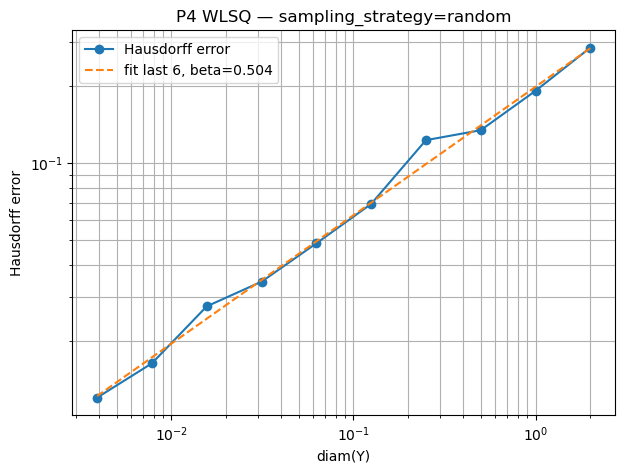

Estimated beta = 0.5035371415468094


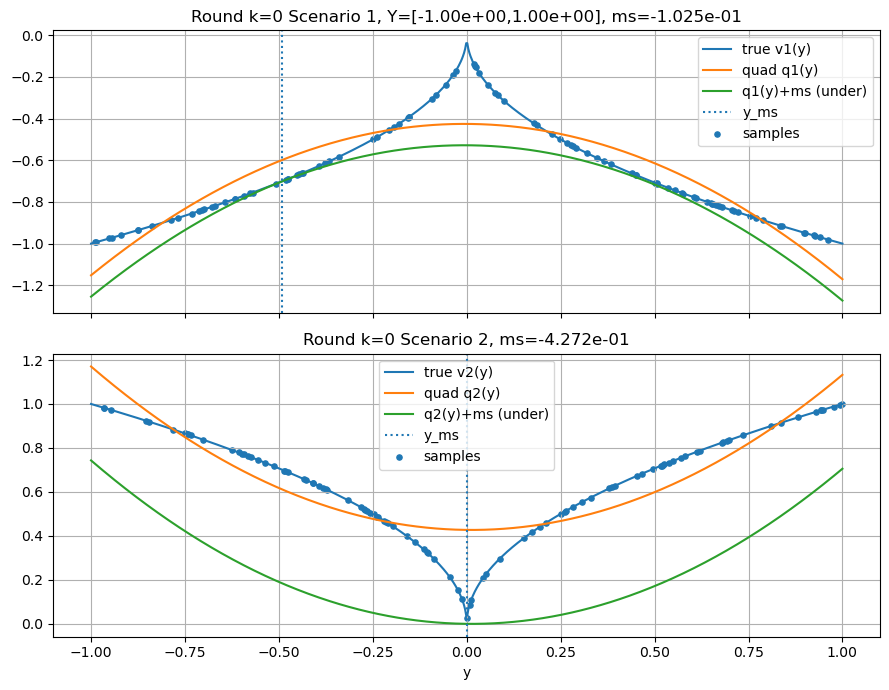

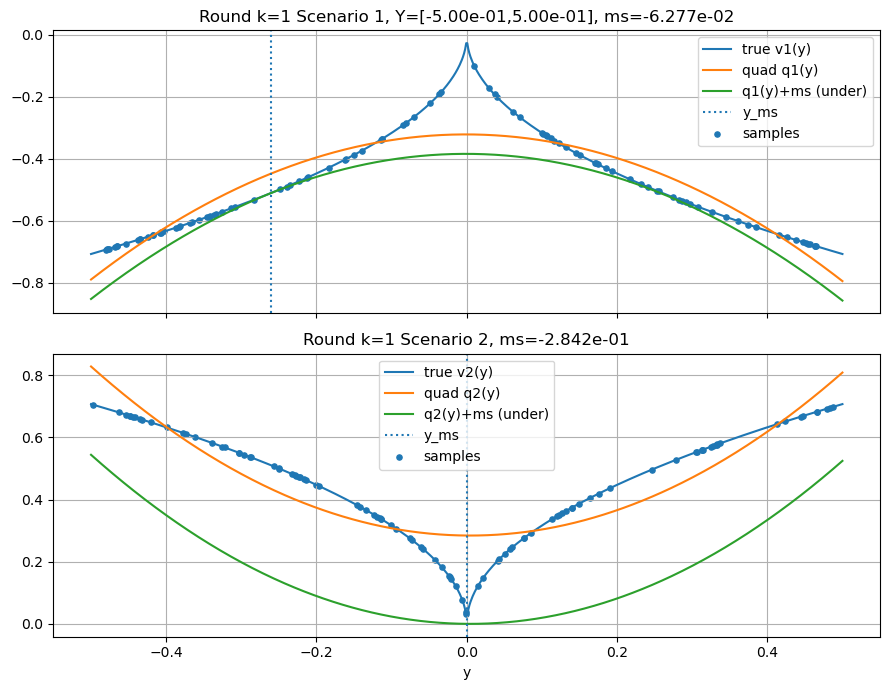

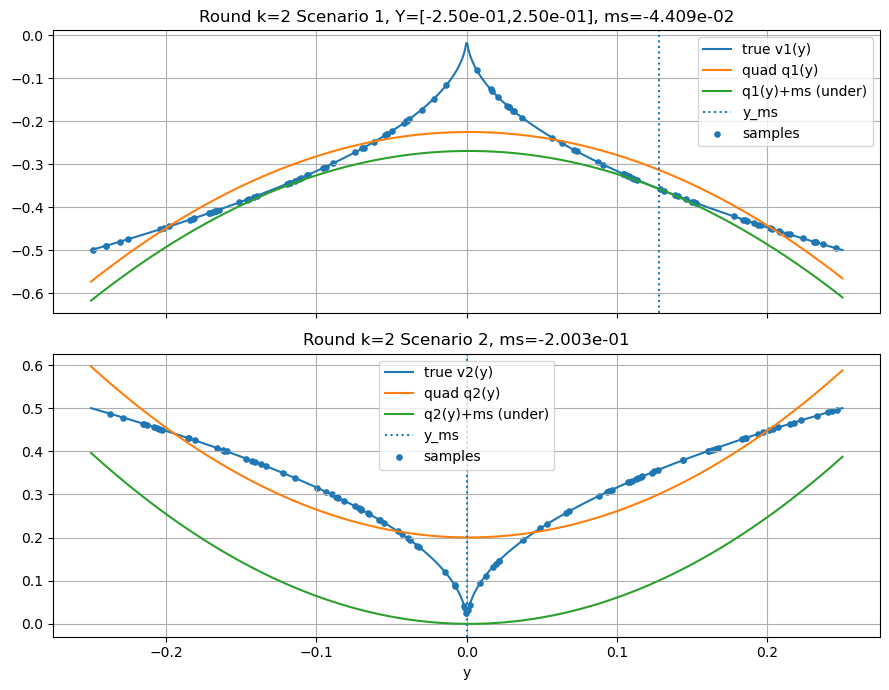

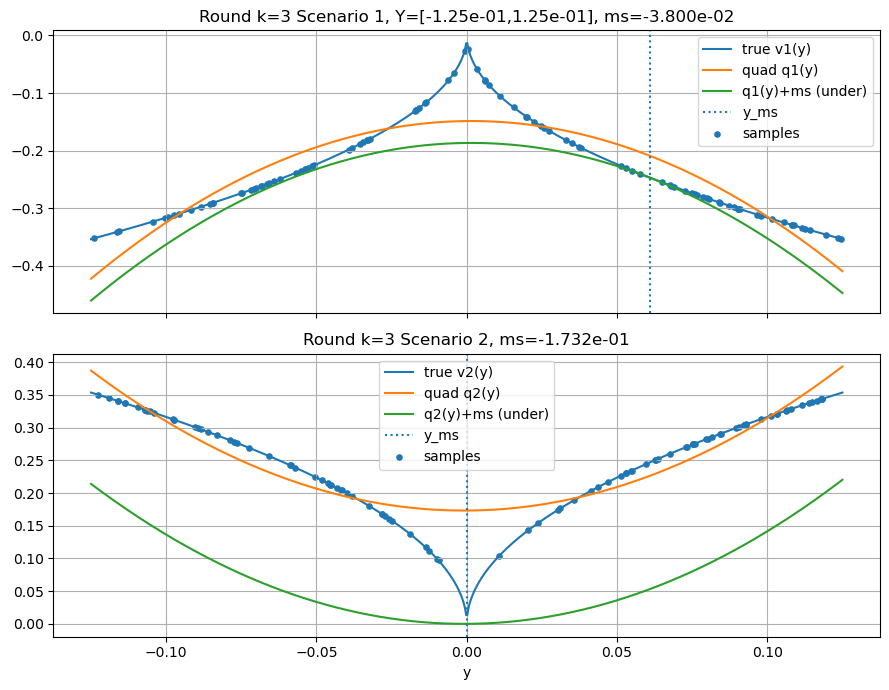

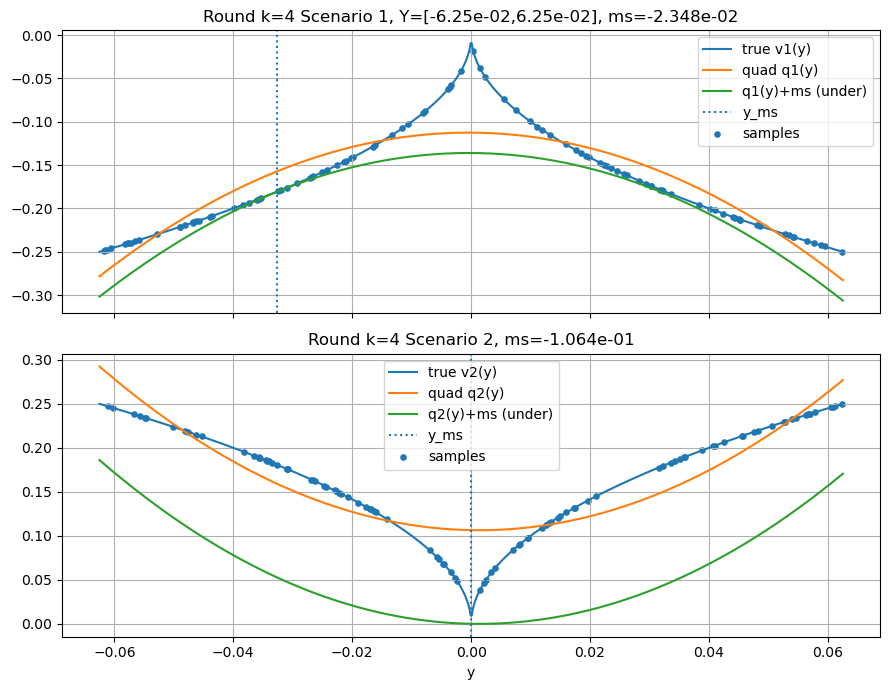

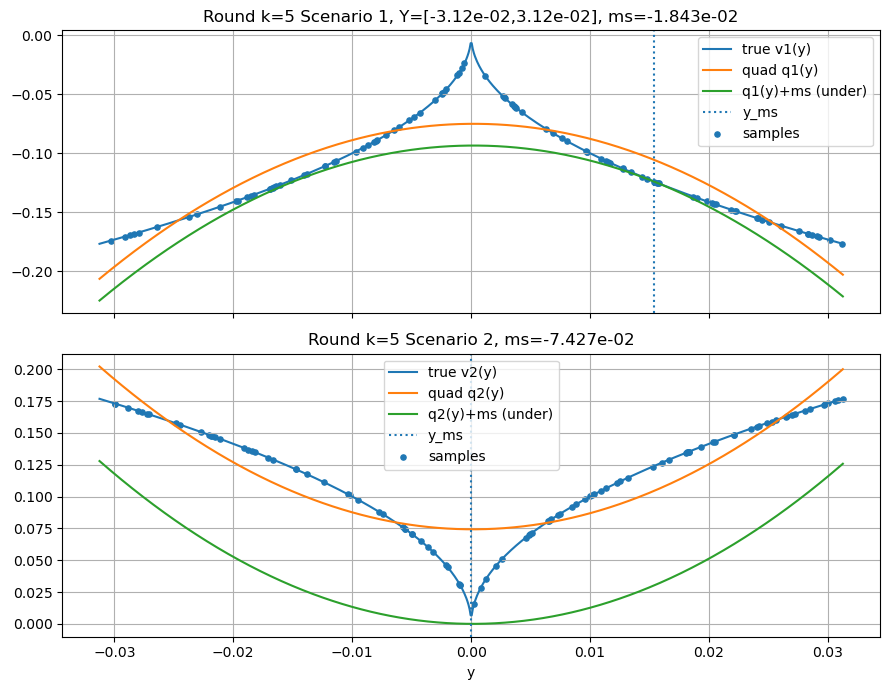

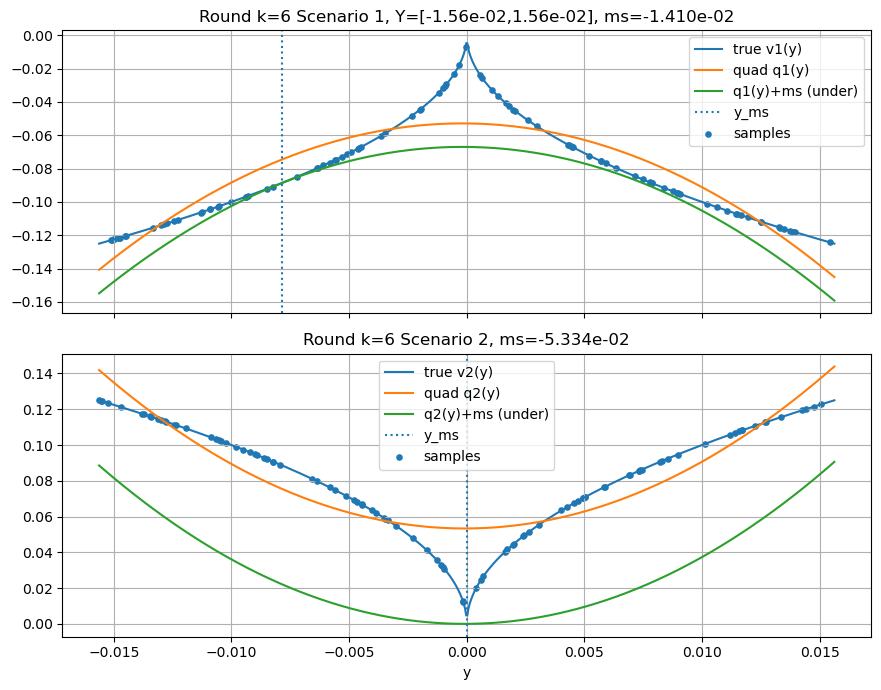

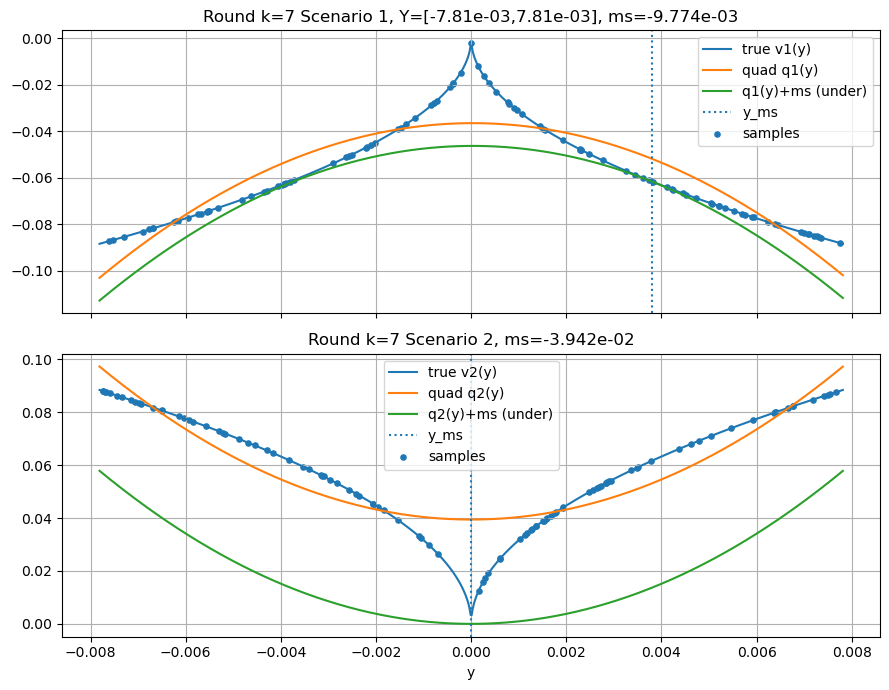

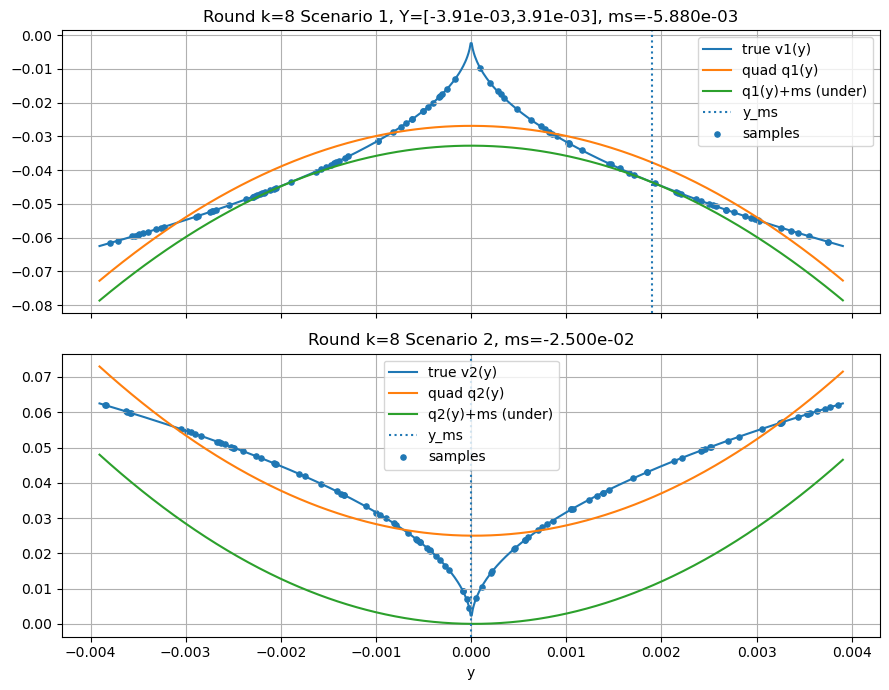

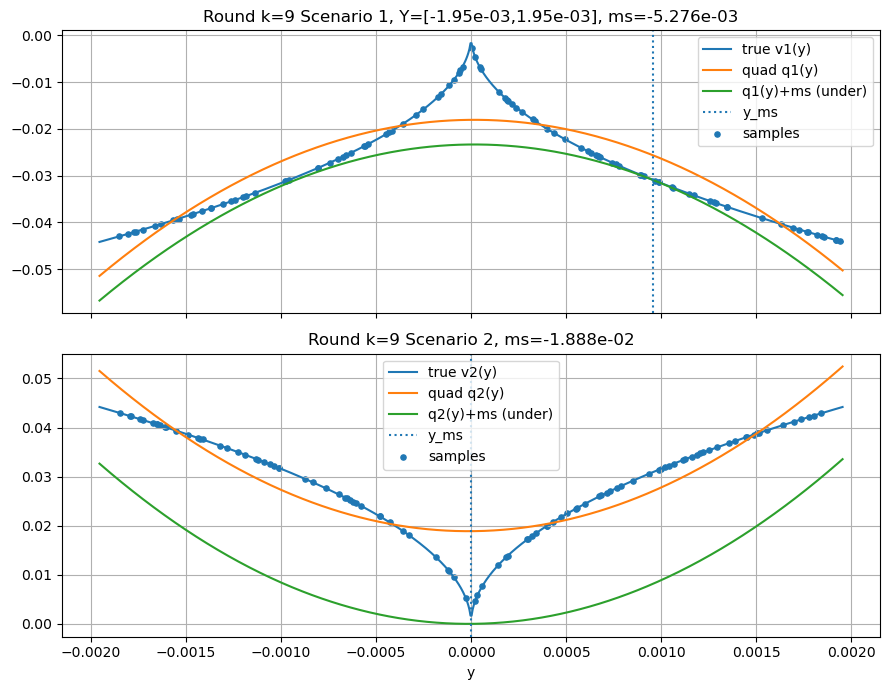

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from dataclasses import dataclass
from typing import Callable, Tuple, Dict, Optional

# ============================================================
# P4: v1(y) = -sqrt(|y|), v2(y) = +sqrt(|y|)
# ============================================================
def v1(y: float) -> float:
    return -np.sqrt(abs(y))

def v2(y: float) -> float:
    return +np.sqrt(abs(y))

P1 = 0.5
P2 = 0.5

# ============================================================
# Models
# ============================================================
@dataclass
class QuadModel:
    a: float
    b: float
    c: float
    ms: float       # shift so that q+ms <= v on Y
    y_ms: float     # argmax of (q - v) over Y

    def q(self, y):
        y = np.asarray(y, dtype=float)
        return self.a*y*y + self.b*y + self.c

    def under(self, y):
        return self.q(y) + self.ms

@dataclass
class FitDiag:
    ys: np.ndarray
    fs: np.ndarray
    w: np.ndarray
    y_ms: float
    ms: float

# ============================================================
# Weighted least squares fit: q(y)=a y^2 + b y + c
# ============================================================
def fit_weighted_quadratic(ys: np.ndarray, fs: np.ndarray, w: np.ndarray) -> Tuple[float,float,float]:
    ys = np.asarray(ys, dtype=float).ravel()
    fs = np.asarray(fs, dtype=float).ravel()
    w  = np.asarray(w,  dtype=float).ravel()
    assert ys.shape == fs.shape == w.shape

    X = np.vstack([ys**2, ys, np.ones_like(ys)]).T
    W = np.sqrt(np.clip(w, 0.0, np.inf))
    Xw = X * W[:, None]
    fw = fs * W
    coef, *_ = np.linalg.lstsq(Xw, fw, rcond=None)
    a,b,c = coef.tolist()
    return a,b,c

# ============================================================
# Robust "exact" shift (grid global search + local refine)
# We want ms = - max_{y in Y} (q(y) - v(y))
# so that q(y) + ms <= v(y) for all y in Y.
# ============================================================
def robust_shift_to_underestimator(
    v: Callable[[float], float],
    a: float, b: float, c: float,
    Y: Tuple[float,float],
    grid_n: int = 6001,
    refine_iters: int = 40
) -> Tuple[float,float]:
    lo, hi = Y
    ys = np.linspace(lo, hi, grid_n)

    # h(y) = q(y) - v(y), we need its max
    qv = a*ys*ys + b*ys + c
    vv = np.array([v(float(t)) for t in ys])
    h  = qv - vv

    idx = int(np.argmax(h))
    y0  = float(ys[idx])
    best_val = float(h[idx])

    # local refine around y0 via ternary search on a small bracket
    # (safe even if not strictly unimodal: bracket is tiny, so it's fine)
    # choose bracket as neighbors in grid
    L = float(ys[max(idx-1, 0)])
    U = float(ys[min(idx+1, grid_n-1)])
    if U - L < 1e-15:
        ms = -best_val
        return ms, y0

    def h_scalar(t: float) -> float:
        return (a*t*t + b*t + c) - v(t)

    l, r = L, U
    for _ in range(refine_iters):
        m1 = l + (r-l)/3.0
        m2 = r - (r-l)/3.0
        if h_scalar(m1) < h_scalar(m2):
            l = m1
        else:
            r = m2
    y_ref = 0.5*(l+r)
    val_ref = h_scalar(y_ref)

    if val_ref > best_val:
        best_val = float(val_ref)
        y0 = float(y_ref)

    ms = -best_val
    return float(ms), float(y0)

# ============================================================
# Sampling strategies
# 1) random: n_samples uniform random in [lo,hi]
# 2) grid:   n_samples evenly spaced in [lo,hi]
# 3) grid_low_weight: same points as grid, but weights emphasize low fs
# 4) grid_then_ms_nearby:
#       - first grid (n_samples), fit once (uniform weights) -> get ms point y_ms0
#       - then add extra 30 random points near y_ms0 (radius r)
#       - final fit on combined points (uniform weights)
# ============================================================
def make_samples(
    sampling_strategy: str,
    v: Callable[[float], float],
    Y: Tuple[float,float],
    n_samples: int,
    rng: np.random.Generator,
    extra_ms_points: int = 30,
    ms_radius_frac: float = 0.10,  # neighborhood radius = frac * (hi-lo)
) -> Tuple[np.ndarray, np.ndarray]:
    lo, hi = Y

    if sampling_strategy == "random":
        ys = rng.uniform(lo, hi, size=n_samples)

    elif sampling_strategy in ("grid", "grid_low_weight", "grid_then_ms_nearby"):
        ys = np.linspace(lo, hi, n_samples)

    else:
        raise ValueError(f"Unknown sampling_strategy={sampling_strategy}")

    ys = np.unique(ys)
    fs = np.array([v(float(t)) for t in ys])

    # strategy 4: add points near preliminary ms point
    if sampling_strategy == "grid_then_ms_nearby":
        # preliminary uniform-weight fit
        w0 = np.ones_like(fs)
        a0,b0,c0 = fit_weighted_quadratic(ys, fs, w0)
        ms0, y_ms0 = robust_shift_to_underestimator(v, a0,b0,c0, Y)

        radius = ms_radius_frac * (hi - lo)
        radius = max(radius, 1e-12)
        L = max(lo, y_ms0 - radius)
        U = min(hi, y_ms0 + radius)
        ys_extra = rng.uniform(L, U, size=extra_ms_points)

        ys = np.unique(np.concatenate([ys, ys_extra]))
        fs = np.array([v(float(t)) for t in ys])

    return ys, fs

def make_weights(
    sampling_strategy: str,
    ys: np.ndarray,
    fs: np.ndarray,
    alpha: float = 5.0
) -> np.ndarray:
    # default uniform
    if sampling_strategy in ("random", "grid", "grid_then_ms_nearby"):
        return np.ones_like(fs)

    # grid + low-value-focused weights
    if sampling_strategy == "grid_low_weight":
        # weight higher when fs is smaller
        # w_i = exp(-alpha*(fs_i - min(fs)))
        fmin = float(np.min(fs))
        return np.exp(-alpha * (fs - fmin))

    raise ValueError(f"Unknown sampling_strategy={sampling_strategy}")

# ============================================================
# Build WLSQ underestimator per scenario for one interval Y
# ============================================================
def build_wlsq_underestimator(
    v: Callable[[float], float],
    Y: Tuple[float,float],
    n_samples: int,
    rng: np.random.Generator,
    sampling_strategy: str,
    extra_ms_points: int = 30,
) -> Tuple[QuadModel, FitDiag]:
    ys, fs = make_samples(
        sampling_strategy=sampling_strategy,
        v=v, Y=Y, n_samples=n_samples, rng=rng,
        extra_ms_points=extra_ms_points
    )
    w = make_weights(sampling_strategy, ys, fs)

    a,b,c = fit_weighted_quadratic(ys, fs, w)
    ms, y_ms = robust_shift_to_underestimator(v, a,b,c, Y)

    model = QuadModel(a=a, b=b, c=c, ms=ms, y_ms=y_ms)
    diag  = FitDiag(ys=ys, fs=fs, w=w, y_ms=y_ms, ms=ms)
    return model, diag

# ============================================================
# Compute min of quadratic on interval
# ============================================================
def min_of_quadratic_on_interval(a: float, b: float, c: float, lo: float, hi: float) -> float:
    vals = [a*lo*lo + b*lo + c, a*hi*hi + b*hi + c]
    if a > 0:
        ystar = -b/(2.0*a)
        if lo <= ystar <= hi:
            vals.append(a*ystar*ystar + b*ystar + c)
    return float(min(vals))

# Hausdorff error on Y for P4:
# true min of (0.5*v1+0.5*v2) is 0 on symmetric interval around 0
def hausdorff_error_for_interval(Y: Tuple[float,float], m1: QuadModel, m2: QuadModel) -> Tuple[float,float]:
    lo, hi = Y
    a = P1*m1.a + P2*m2.a
    b = P1*m1.b + P2*m2.b
    c = P1*(m1.c + m1.ms) + P2*(m2.c + m2.ms)
    lb = min_of_quadratic_on_interval(a,b,c,lo,hi)
    err = -lb
    return lb, err

# ============================================================
# Experiment runner
# ============================================================
def run_p4_experiment(
    sampling_strategy: str,
    eps0: float = 1.0,
    rho: float = 0.5,
    n_levels: int = 10,
    n_samples: int = 100,
    extra_ms_points: int = 30,
    seed: int = 1,
) -> Dict[str, object]:
    rng = np.random.default_rng(seed)

    eps_list, diam_list, lb_list, err_list = [], [], [], []
    rounds = []

    for k in range(n_levels):
        eps = eps0 * (rho**k)
        Y = (-eps, eps)

        m1, d1 = build_wlsq_underestimator(v1, Y, n_samples, rng, sampling_strategy, extra_ms_points)
        m2, d2 = build_wlsq_underestimator(v2, Y, n_samples, rng, sampling_strategy, extra_ms_points)

        lb, err = hausdorff_error_for_interval(Y, m1, m2)

        eps_list.append(eps)
        diam_list.append(2.0*eps)
        lb_list.append(lb)
        err_list.append(err)

        rounds.append(dict(k=k, Y=Y, m1=m1, m2=m2, d1=d1, d2=d2))

    return {
        "sampling_strategy": sampling_strategy,
        "eps": np.array(eps_list),
        "diam": np.array(diam_list),
        "lb": np.array(lb_list),
        "err": np.array(err_list),
        "rounds": rounds,
        "seed": seed,
        "n_samples": n_samples,
        "extra_ms_points": extra_ms_points
    }

def estimate_slope_loglog(x: np.ndarray, y: np.ndarray) -> float:
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    mask = (x > 0) & (y > 0)
    x = x[mask]; y = y[mask]
    beta, _ = np.polyfit(np.log(x), np.log(y), 1)
    return float(beta)

def plot_convergence(out: Dict[str, object], slope_fit_last: int = 6):
    diam = out["diam"]
    err  = out["err"]
    mask = (diam > 0) & (err > 0)
    diam = diam[mask]
    err  = err[mask]

    K = min(slope_fit_last, len(diam))
    beta = estimate_slope_loglog(diam[-K:], err[-K:])

    # fit line
    lx = np.log(diam[-K:])
    ly = np.log(err[-K:])
    c = float(np.mean(ly - beta*lx))
    fit_err = np.exp(beta*np.log(diam) + c)

    plt.figure(figsize=(7,5))
    plt.loglog(diam, err, marker="o", linestyle="-", label="Hausdorff error")
    plt.loglog(diam, fit_err, linestyle="--", label=f"fit last {K}, beta={beta:.3f}")
    plt.xlabel("diam(Y)")
    plt.ylabel("Hausdorff error")
    plt.grid(True, which="both")
    plt.title(f"P4 WLSQ — sampling_strategy={out['sampling_strategy']}")
    plt.legend()
    plt.show()

    return beta

def plot_round_scenarios(round_info: Dict[str, object], n_grid: int = 600, show_samples: bool = True):
    k = round_info["k"]
    lo, hi = round_info["Y"]
    m1, m2 = round_info["m1"], round_info["m2"]
    d1, d2 = round_info["d1"], round_info["d2"]

    ys = np.linspace(lo, hi, n_grid)

    fig, axes = plt.subplots(2,1,sharex=True,figsize=(9,7))

    # Scenario 1
    ax = axes[0]
    ax.plot(ys, [v1(float(t)) for t in ys], label="true v1(y)")
    ax.plot(ys, m1.q(ys), label="quad q1(y)")
    ax.plot(ys, m1.under(ys), label="q1(y)+ms (under)")
    ax.axvline(m1.y_ms, linestyle=":", label="y_ms")
    if show_samples:
        ax.scatter(d1.ys, d1.fs, s=14, label="samples")
    ax.grid(True)
    ax.set_title(f"Round k={k} Scenario 1, Y=[{lo:.2e},{hi:.2e}], ms={m1.ms:.3e}")
    ax.legend()

    # Scenario 2
    ax = axes[1]
    ax.plot(ys, [v2(float(t)) for t in ys], label="true v2(y)")
    ax.plot(ys, m2.q(ys), label="quad q2(y)")
    ax.plot(ys, m2.under(ys), label="q2(y)+ms (under)")
    ax.axvline(m2.y_ms, linestyle=":", label="y_ms")
    if show_samples:
        ax.scatter(d2.ys, d2.fs, s=14, label="samples")
    ax.grid(True)
    ax.set_title(f"Round k={k} Scenario 2, ms={m2.ms:.3e}")
    ax.legend()

    axes[1].set_xlabel("y")
    fig.tight_layout()
    plt.show()

# ============================================================
# RUN ONE STRATEGY (switch here)
# ============================================================
sampling_strategy = "random"
# sampling_strategy = "grid"
# sampling_strategy = "grid_low_weight"
# sampling_strategy = "grid_then_ms_nearby"

params = dict(
    sampling_strategy=sampling_strategy,
    eps0=1.0,
    rho=0.5,
    n_levels=10,
    n_samples=100,
    extra_ms_points=30,  # only used in strategy 4
    seed=1,
)

out = run_p4_experiment(**params)

beta = plot_convergence(out, slope_fit_last=6)
print("Estimated beta =", beta)

# per-iteration plots (optional)
for r in out["rounds"]:
    plot_round_scenarios(r, n_grid=700, show_samples=True)


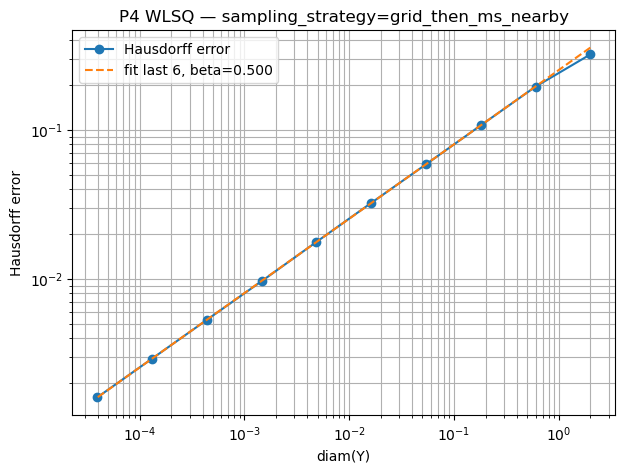

Estimated beta = 0.4998411669588714


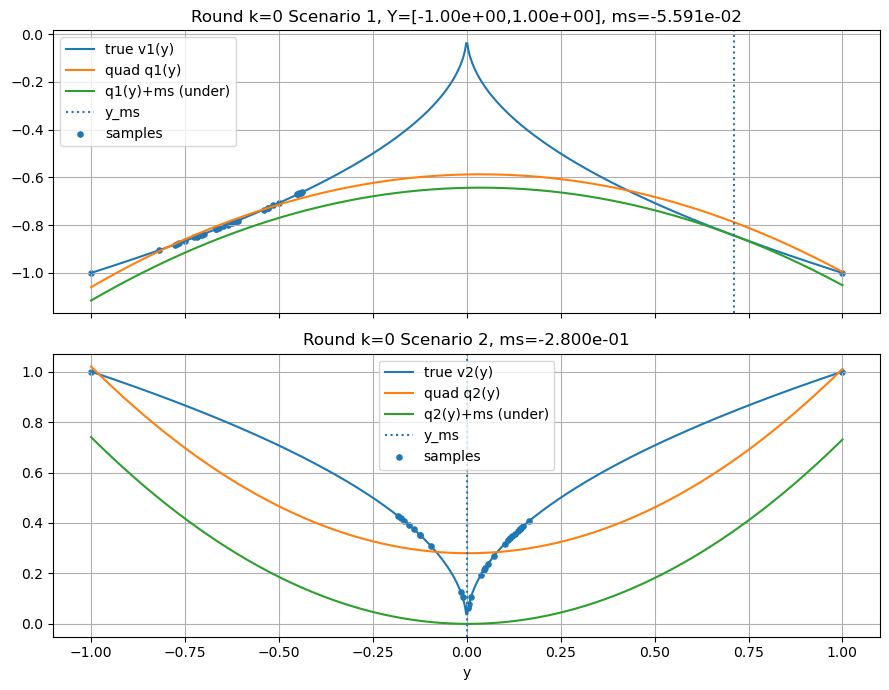

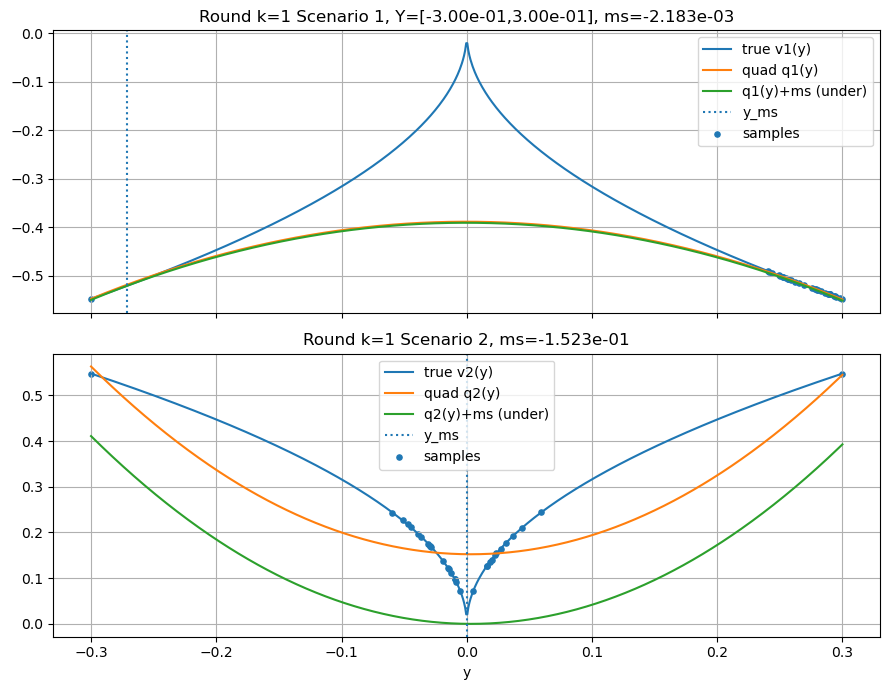

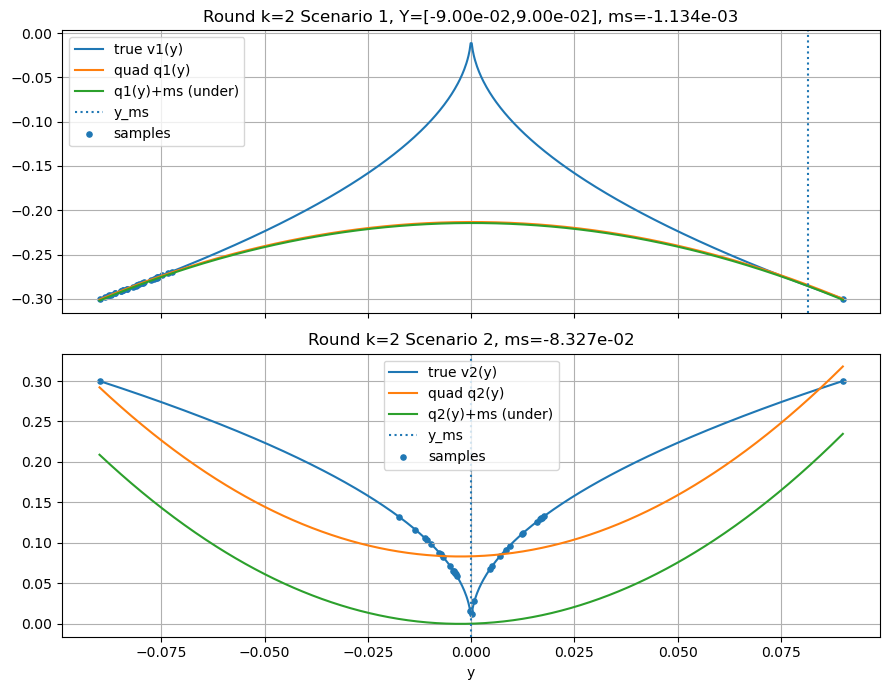

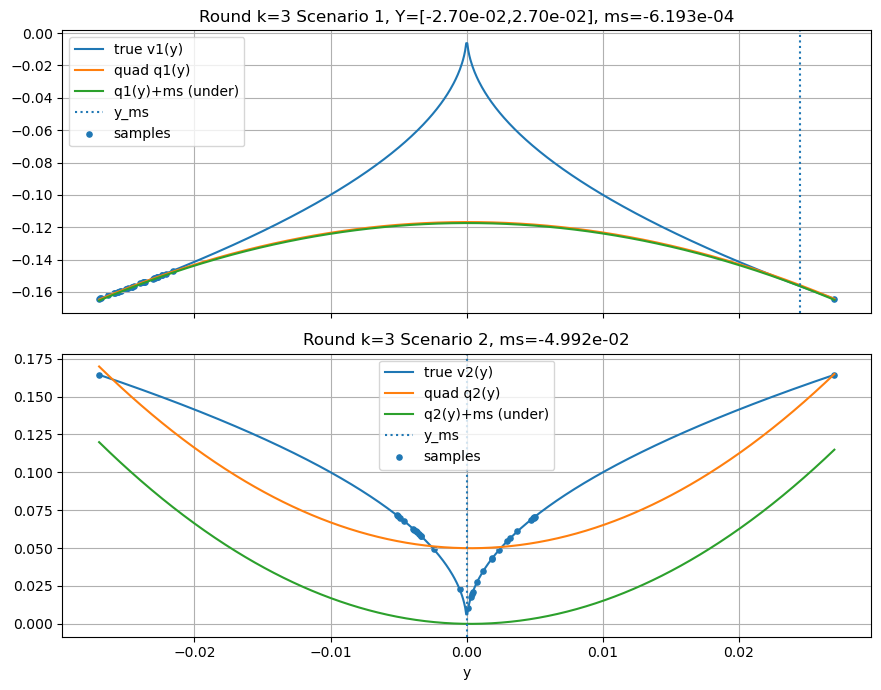

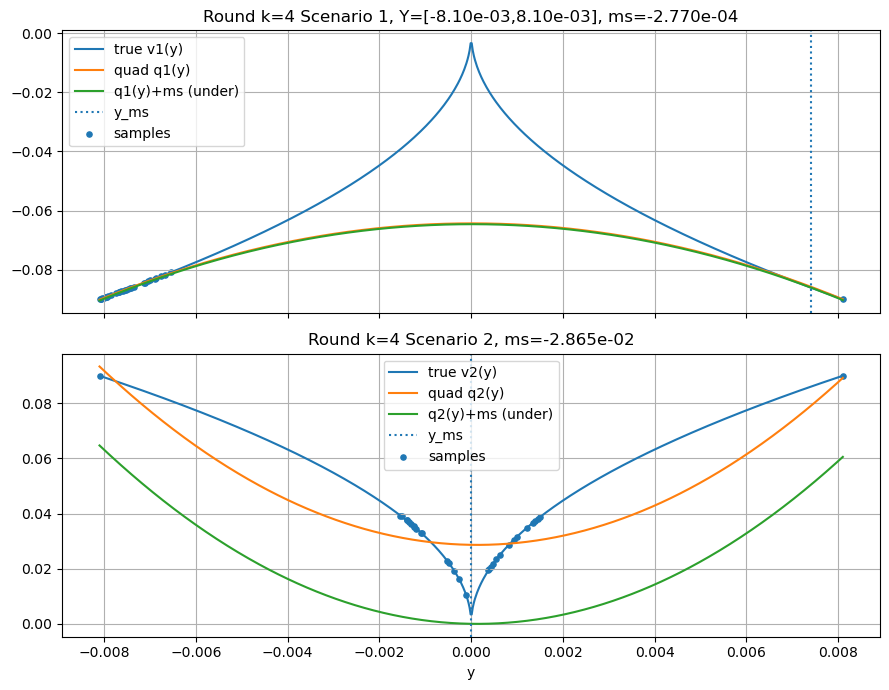

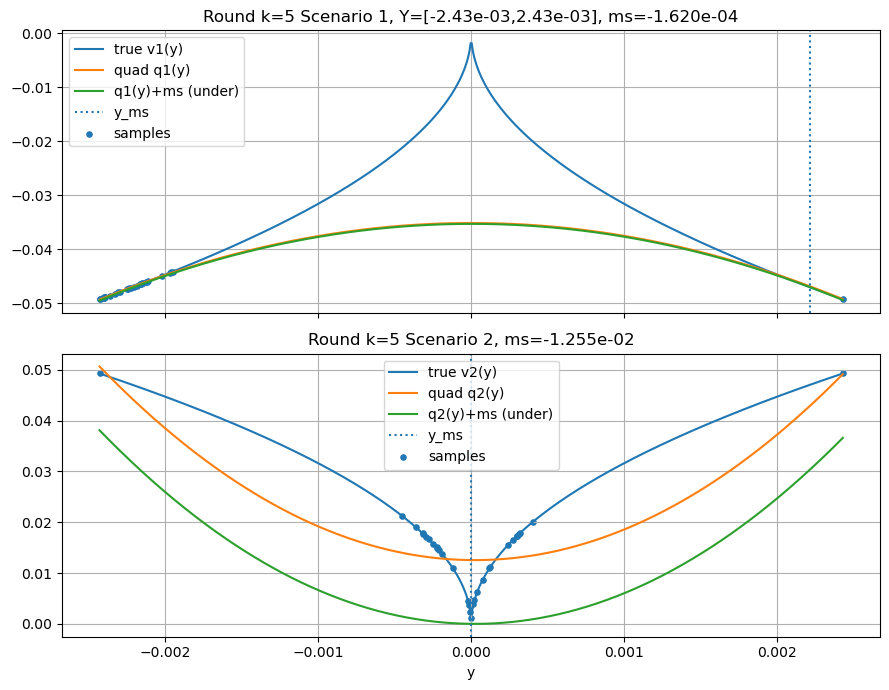

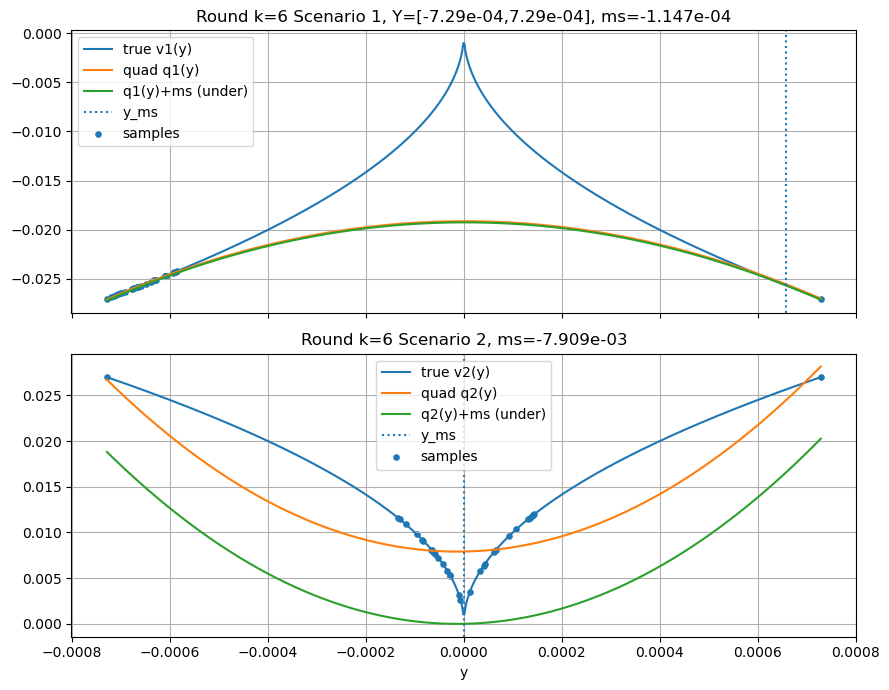

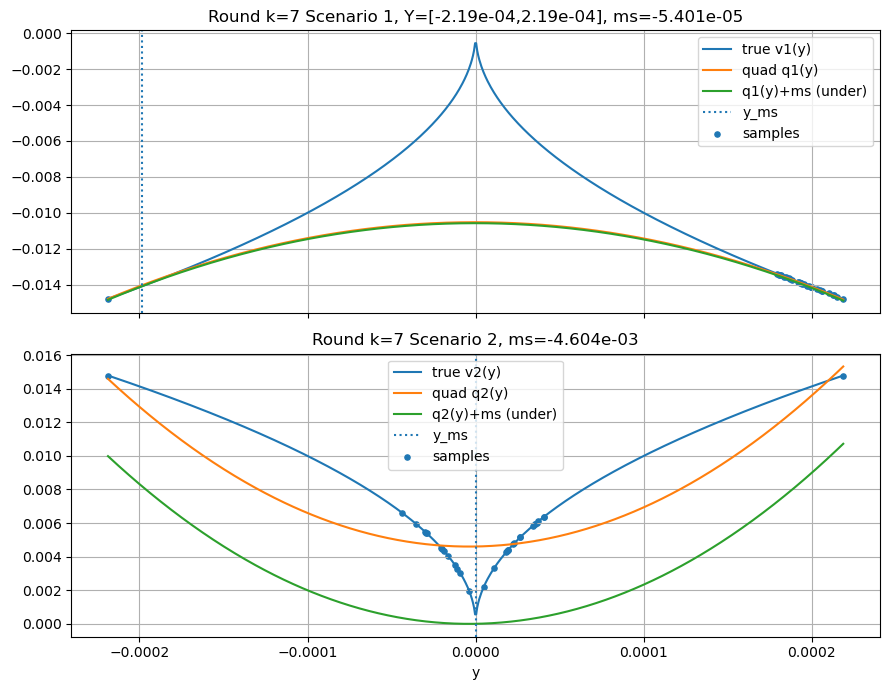

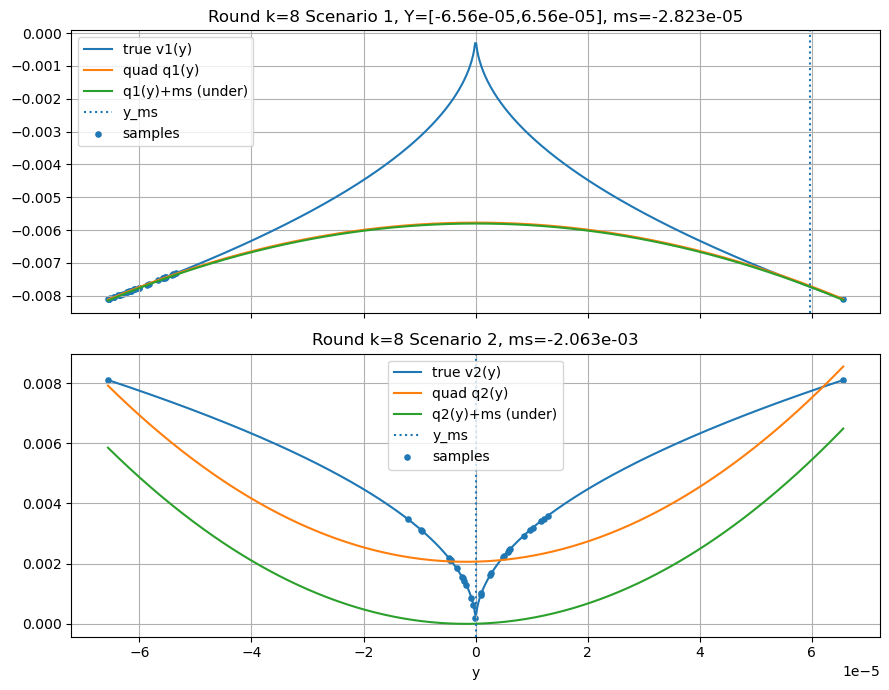

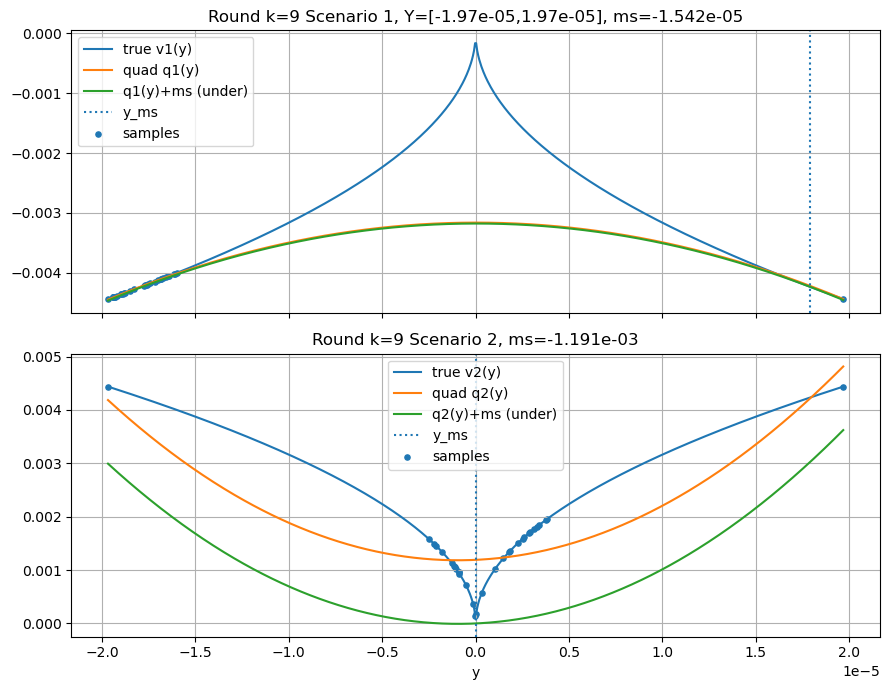

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from dataclasses import dataclass
from typing import Callable, Tuple, Dict, Optional

# ============================================================
# P4: v1(y) = -sqrt(|y|), v2(y) = +sqrt(|y|)
# ============================================================
def v1(y: float) -> float:
    return -np.sqrt(abs(y))

def v2(y: float) -> float:
    return +np.sqrt(abs(y))

P1 = 0.5
P2 = 0.5

# ============================================================
# Models
# ============================================================
@dataclass
class QuadModel:
    a: float
    b: float
    c: float
    ms: float       # shift so that q+ms <= v on Y
    y_ms: float     # argmax of (q - v) over Y

    def q(self, y):
        y = np.asarray(y, dtype=float)
        return self.a*y*y + self.b*y + self.c

    def under(self, y):
        return self.q(y) + self.ms

@dataclass
class FitDiag:
    ys: np.ndarray
    fs: np.ndarray
    w: np.ndarray
    y_ms: float
    ms: float

# ============================================================
# Weighted least squares fit: q(y)=a y^2 + b y + c
# ============================================================
def fit_weighted_quadratic(ys: np.ndarray, fs: np.ndarray, w: np.ndarray) -> Tuple[float,float,float]:
    ys = np.asarray(ys, dtype=float).ravel()
    fs = np.asarray(fs, dtype=float).ravel()
    w  = np.asarray(w,  dtype=float).ravel()
    assert ys.shape == fs.shape == w.shape

    X = np.vstack([ys**2, ys, np.ones_like(ys)]).T
    W = np.sqrt(np.clip(w, 0.0, np.inf))
    Xw = X * W[:, None]
    fw = fs * W
    coef, *_ = np.linalg.lstsq(Xw, fw, rcond=None)
    a,b,c = coef.tolist()
    return a,b,c

# ============================================================
# Robust "exact" shift (grid global search + local refine)
# We want ms = - max_{y in Y} (q(y) - v(y))
# so that q(y) + ms <= v(y) for all y in Y.
# ============================================================
def robust_shift_to_underestimator(
    v: Callable[[float], float],
    a: float, b: float, c: float,
    Y: Tuple[float,float],
    grid_n: int = 6001,
    refine_iters: int = 40
) -> Tuple[float,float]:
    lo, hi = Y
    ys = np.linspace(lo, hi, grid_n)

    # h(y) = q(y) - v(y), we need its max
    qv = a*ys*ys + b*ys + c
    vv = np.array([v(float(t)) for t in ys])
    h  = qv - vv

    idx = int(np.argmax(h))
    y0  = float(ys[idx])
    best_val = float(h[idx])

    # local refine around y0 via ternary search on a small bracket
    # (safe even if not strictly unimodal: bracket is tiny, so it's fine)
    # choose bracket as neighbors in grid
    L = float(ys[max(idx-1, 0)])
    U = float(ys[min(idx+1, grid_n-1)])
    if U - L < 1e-15:
        ms = -best_val
        return ms, y0

    def h_scalar(t: float) -> float:
        return (a*t*t + b*t + c) - v(t)

    l, r = L, U
    for _ in range(refine_iters):
        m1 = l + (r-l)/3.0
        m2 = r - (r-l)/3.0
        if h_scalar(m1) < h_scalar(m2):
            l = m1
        else:
            r = m2
    y_ref = 0.5*(l+r)
    val_ref = h_scalar(y_ref)

    if val_ref > best_val:
        best_val = float(val_ref)
        y0 = float(y_ref)

    ms = -best_val
    return float(ms), float(y0)

# ============================================================
# Sampling strategies
# 1) random: n_samples uniform random in [lo,hi]
# 2) grid:   n_samples evenly spaced in [lo,hi]
# 3) grid_low_weight: same points as grid, but weights emphasize low fs
# 4) grid_then_ms_nearby:
#       - first grid (n_samples), fit once (uniform weights) -> get ms point y_ms0
#       - then add extra 30 random points near y_ms0 (radius r)
#       - final fit on combined points (uniform weights)
# ============================================================
def make_samples(
    sampling_strategy: str,
    v: Callable[[float], float],
    Y: Tuple[float,float],
    n_samples: int,
    rng: np.random.Generator,
    extra_ms_points: int = 30,
    ms_radius_frac: float = 0.10,  # neighborhood radius = frac * (hi-lo)
) -> Tuple[np.ndarray, np.ndarray]:
    lo, hi = Y

    if sampling_strategy == "random":
        ys = rng.uniform(lo, hi, size=n_samples)

    elif sampling_strategy in ("grid", "grid_low_weight", "grid_then_ms_nearby"):
        ys = np.linspace(lo, hi, n_samples)

    else:
        raise ValueError(f"Unknown sampling_strategy={sampling_strategy}")

    ys = np.unique(ys)
    fs = np.array([v(float(t)) for t in ys])

    # strategy 4: add points near preliminary ms point
    if sampling_strategy == "grid_then_ms_nearby":
        # preliminary uniform-weight fit
        w0 = np.ones_like(fs)
        a0,b0,c0 = fit_weighted_quadratic(ys, fs, w0)
        ms0, y_ms0 = robust_shift_to_underestimator(v, a0,b0,c0, Y)

        radius = ms_radius_frac * (hi - lo)
        radius = max(radius, 1e-12)
        L = max(lo, y_ms0 - radius)
        U = min(hi, y_ms0 + radius)
        ys_extra = rng.uniform(L, U, size=extra_ms_points)

        ys = np.unique(np.concatenate([ys, ys_extra]))
        fs = np.array([v(float(t)) for t in ys])

    return ys, fs

def make_weights(
    sampling_strategy: str,
    ys: np.ndarray,
    fs: np.ndarray,
    alpha: float = 5.0
) -> np.ndarray:
    # default uniform
    if sampling_strategy in ("random", "grid", "grid_then_ms_nearby"):
        return np.ones_like(fs)

    # grid + low-value-focused weights
    if sampling_strategy == "grid_low_weight":
        # weight higher when fs is smaller
        # w_i = exp(-alpha*(fs_i - min(fs)))
        fmin = float(np.min(fs))
        return np.exp(-alpha * (fs - fmin))

    raise ValueError(f"Unknown sampling_strategy={sampling_strategy}")

# ============================================================
# Build WLSQ underestimator per scenario for one interval Y
# ============================================================
def build_wlsq_underestimator(
    v: Callable[[float], float],
    Y: Tuple[float,float],
    n_samples: int,
    rng: np.random.Generator,
    sampling_strategy: str,
    extra_ms_points: int = 30,
) -> Tuple[QuadModel, FitDiag]:
    ys, fs = make_samples(
        sampling_strategy=sampling_strategy,
        v=v, Y=Y, n_samples=n_samples, rng=rng,
        extra_ms_points=extra_ms_points
    )
    w = make_weights(sampling_strategy, ys, fs)

    a,b,c = fit_weighted_quadratic(ys, fs, w)
    ms, y_ms = robust_shift_to_underestimator(v, a,b,c, Y)

    model = QuadModel(a=a, b=b, c=c, ms=ms, y_ms=y_ms)
    diag  = FitDiag(ys=ys, fs=fs, w=w, y_ms=y_ms, ms=ms)
    return model, diag

# ============================================================
# Compute min of quadratic on interval
# ============================================================
def min_of_quadratic_on_interval(a: float, b: float, c: float, lo: float, hi: float) -> float:
    vals = [a*lo*lo + b*lo + c, a*hi*hi + b*hi + c]
    if a > 0:
        ystar = -b/(2.0*a)
        if lo <= ystar <= hi:
            vals.append(a*ystar*ystar + b*ystar + c)
    return float(min(vals))

# Hausdorff error on Y for P4:
# true min of (0.5*v1+0.5*v2) is 0 on symmetric interval around 0
def hausdorff_error_for_interval(Y: Tuple[float,float], m1: QuadModel, m2: QuadModel) -> Tuple[float,float]:
    lo, hi = Y
    a = P1*m1.a + P2*m2.a
    b = P1*m1.b + P2*m2.b
    c = P1*(m1.c + m1.ms) + P2*(m2.c + m2.ms)
    lb = min_of_quadratic_on_interval(a,b,c,lo,hi)
    err = -lb
    return lb, err

# ============================================================
# Experiment runner
# ============================================================
def run_p4_experiment(
    sampling_strategy: str,
    eps0: float = 1.0,
    rho: float = 0.5,
    n_levels: int = 10,
    n_samples: int = 100,
    extra_ms_points: int = 30,
    seed: int = 1,
) -> Dict[str, object]:
    rng = np.random.default_rng(seed)

    eps_list, diam_list, lb_list, err_list = [], [], [], []
    rounds = []

    for k in range(n_levels):
        eps = eps0 * (rho**k)
        Y = (-eps, eps)

        m1, d1 = build_wlsq_underestimator(v1, Y, n_samples, rng, sampling_strategy, extra_ms_points)
        m2, d2 = build_wlsq_underestimator(v2, Y, n_samples, rng, sampling_strategy, extra_ms_points)

        lb, err = hausdorff_error_for_interval(Y, m1, m2)

        eps_list.append(eps)
        diam_list.append(2.0*eps)
        lb_list.append(lb)
        err_list.append(err)

        rounds.append(dict(k=k, Y=Y, m1=m1, m2=m2, d1=d1, d2=d2))

    return {
        "sampling_strategy": sampling_strategy,
        "eps": np.array(eps_list),
        "diam": np.array(diam_list),
        "lb": np.array(lb_list),
        "err": np.array(err_list),
        "rounds": rounds,
        "seed": seed,
        "n_samples": n_samples,
        "extra_ms_points": extra_ms_points
    }

def estimate_slope_loglog(x: np.ndarray, y: np.ndarray) -> float:
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    mask = (x > 0) & (y > 0)
    x = x[mask]; y = y[mask]
    beta, _ = np.polyfit(np.log(x), np.log(y), 1)
    return float(beta)

def plot_convergence(out: Dict[str, object], slope_fit_last: int = 6):
    diam = out["diam"]
    err  = out["err"]
    mask = (diam > 0) & (err > 0)
    diam = diam[mask]
    err  = err[mask]

    K = min(slope_fit_last, len(diam))
    beta = estimate_slope_loglog(diam[-K:], err[-K:])

    # fit line
    lx = np.log(diam[-K:])
    ly = np.log(err[-K:])
    c = float(np.mean(ly - beta*lx))
    fit_err = np.exp(beta*np.log(diam) + c)

    plt.figure(figsize=(7,5))
    plt.loglog(diam, err, marker="o", linestyle="-", label="Hausdorff error")
    plt.loglog(diam, fit_err, linestyle="--", label=f"fit last {K}, beta={beta:.3f}")
    plt.xlabel("diam(Y)")
    plt.ylabel("Hausdorff error")
    plt.grid(True, which="both")
    plt.title(f"P4 WLSQ — sampling_strategy={out['sampling_strategy']}")
    plt.legend()
    plt.show()

    return beta

def plot_round_scenarios(round_info: Dict[str, object], n_grid: int = 600, show_samples: bool = True):
    k = round_info["k"]
    lo, hi = round_info["Y"]
    m1, m2 = round_info["m1"], round_info["m2"]
    d1, d2 = round_info["d1"], round_info["d2"]

    ys = np.linspace(lo, hi, n_grid)

    fig, axes = plt.subplots(2,1,sharex=True,figsize=(9,7))

    # Scenario 1
    ax = axes[0]
    ax.plot(ys, [v1(float(t)) for t in ys], label="true v1(y)")
    ax.plot(ys, m1.q(ys), label="quad q1(y)")
    ax.plot(ys, m1.under(ys), label="q1(y)+ms (under)")
    ax.axvline(m1.y_ms, linestyle=":", label="y_ms")
    if show_samples:
        ax.scatter(d1.ys, d1.fs, s=14, label="samples")
    ax.grid(True)
    ax.set_title(f"Round k={k} Scenario 1, Y=[{lo:.2e},{hi:.2e}], ms={m1.ms:.3e}")
    ax.legend()

    # Scenario 2
    ax = axes[1]
    ax.plot(ys, [v2(float(t)) for t in ys], label="true v2(y)")
    ax.plot(ys, m2.q(ys), label="quad q2(y)")
    ax.plot(ys, m2.under(ys), label="q2(y)+ms (under)")
    ax.axvline(m2.y_ms, linestyle=":", label="y_ms")
    if show_samples:
        ax.scatter(d2.ys, d2.fs, s=14, label="samples")
    ax.grid(True)
    ax.set_title(f"Round k={k} Scenario 2, ms={m2.ms:.3e}")
    ax.legend()

    axes[1].set_xlabel("y")
    fig.tight_layout()
    plt.show()

# ============================================================
# RUN ONE STRATEGY (switch here)
# ============================================================
sampling_strategy = "grid_then_ms_nearby"
# sampling_strategy = "grid"
# sampling_strategy = "grid_low_weight"
# sampling_strategy = "grid_then_ms_nearby"

params = dict(
    sampling_strategy=sampling_strategy,
    eps0=1.0,
    rho=0.3,
    n_levels=10,
    n_samples=2,
    extra_ms_points=30,  # only used in strategy 4
    seed=1,
)

out = run_p4_experiment(**params)

beta = plot_convergence(out, slope_fit_last=6)
print("Estimated beta =", beta)

# per-iteration plots (optional)
for r in out["rounds"]:
    plot_round_scenarios(r, n_grid=700, show_samples=True)


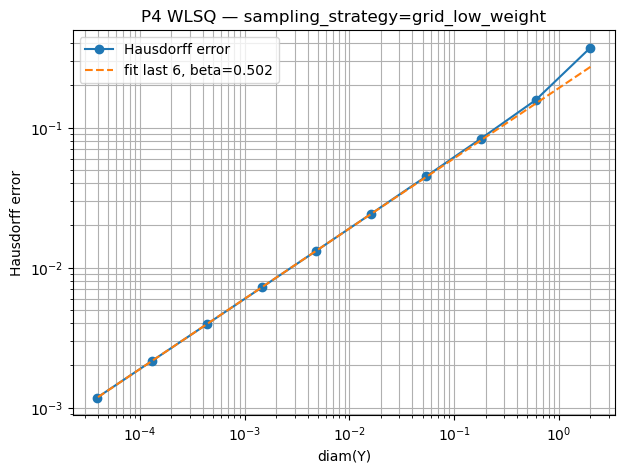

Estimated beta = 0.5019828786883654


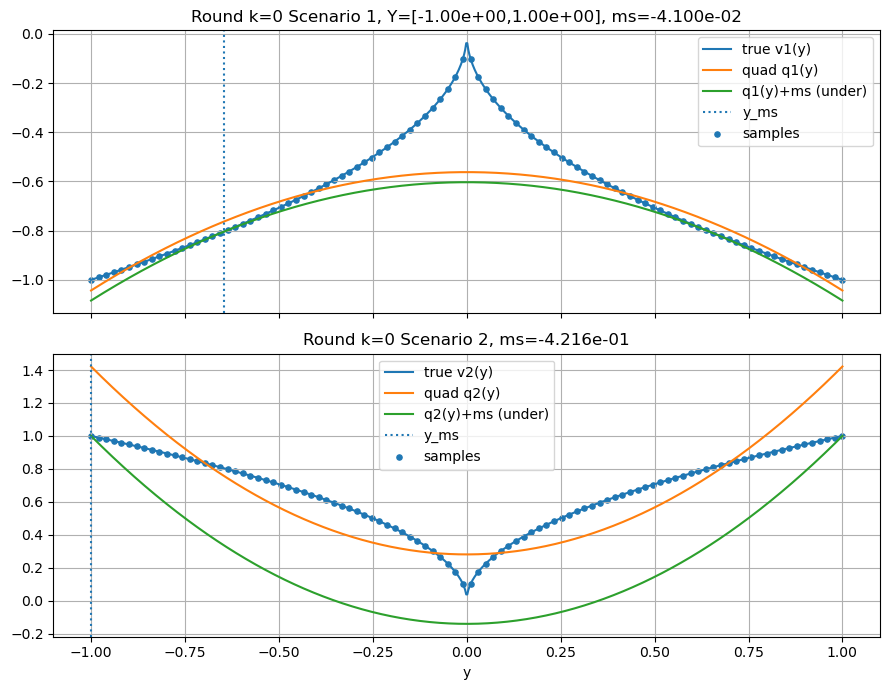

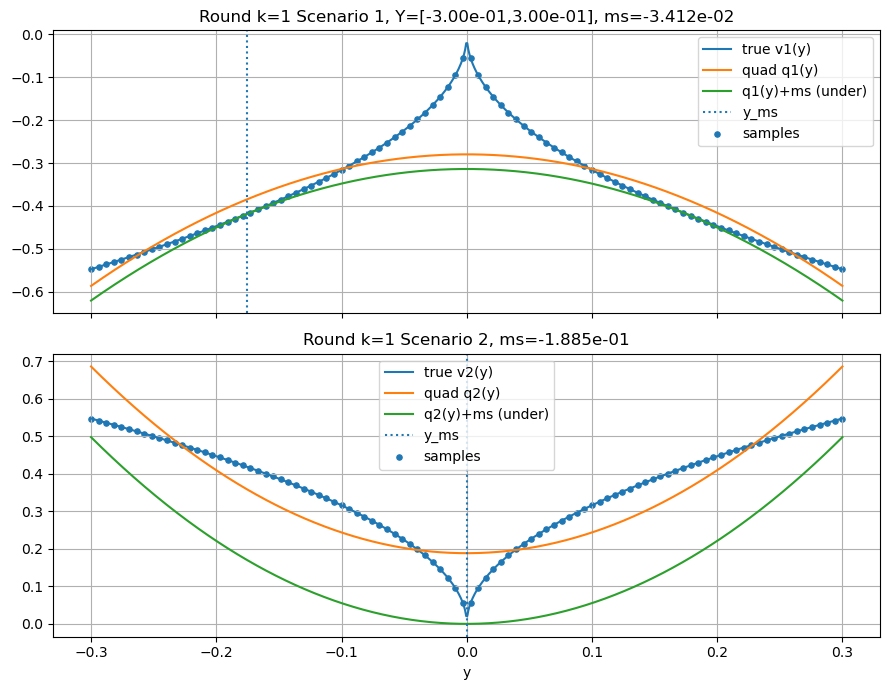

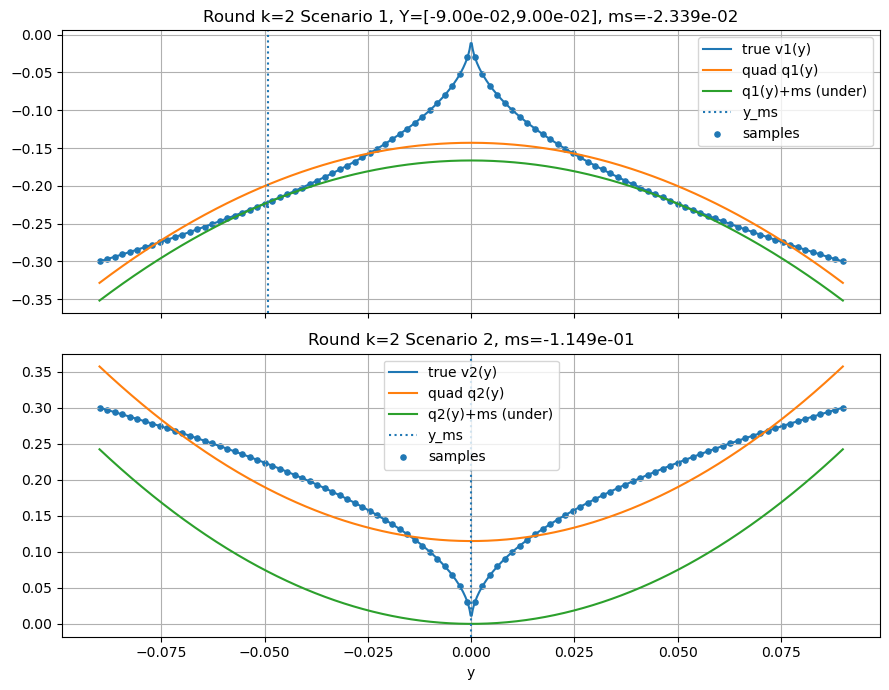

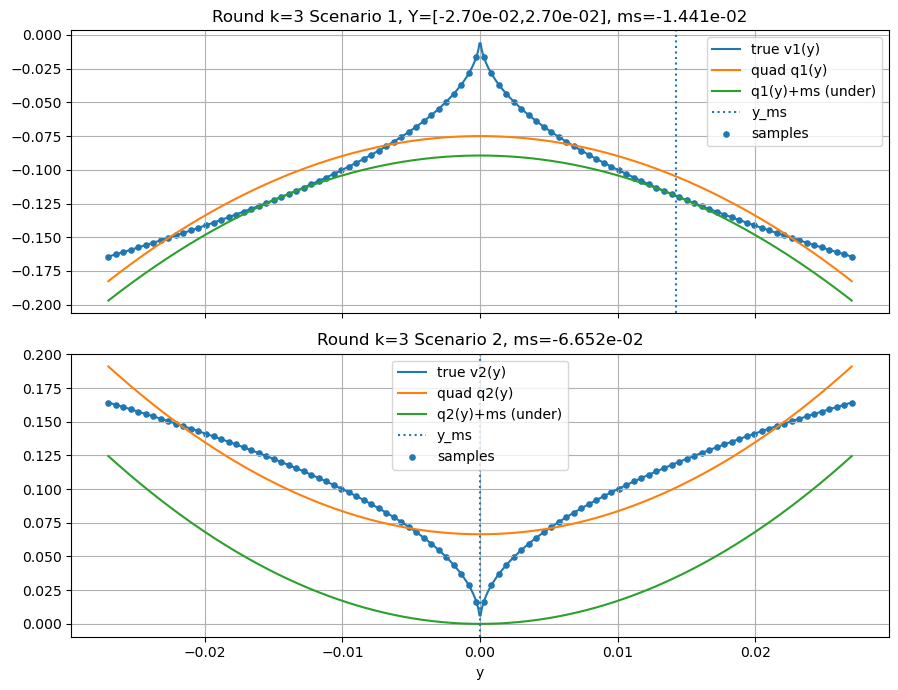

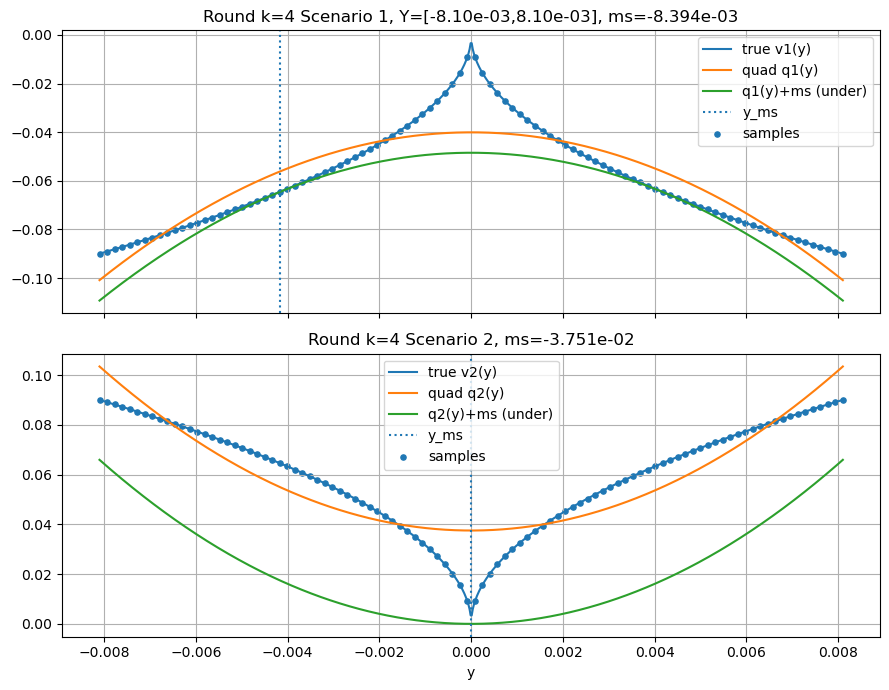

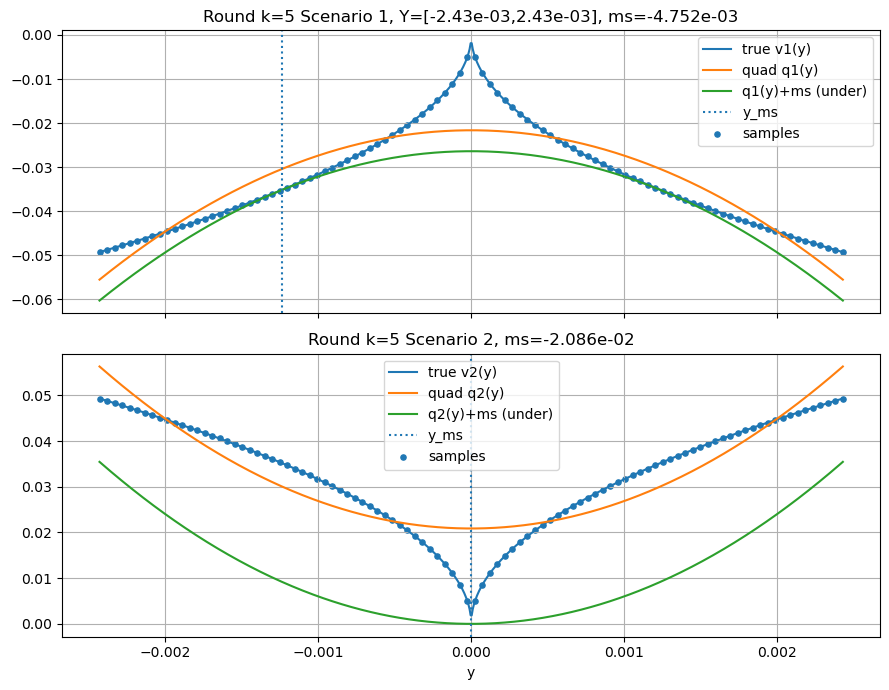

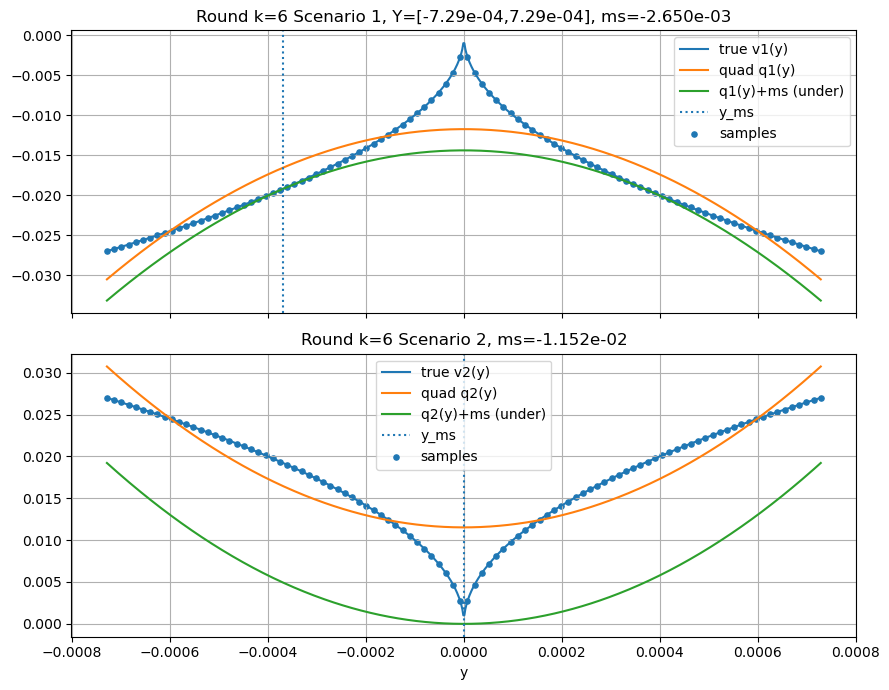

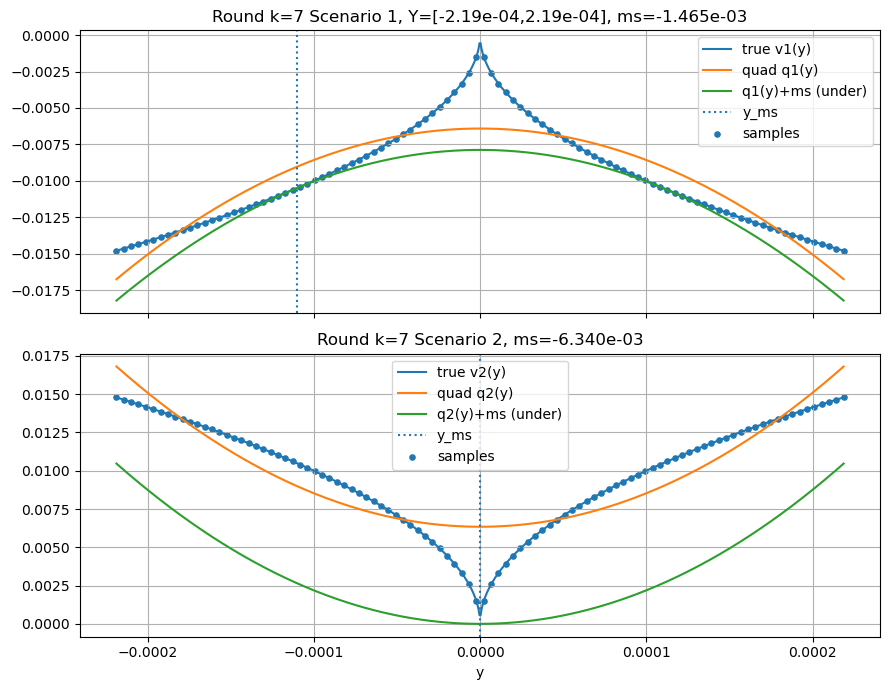

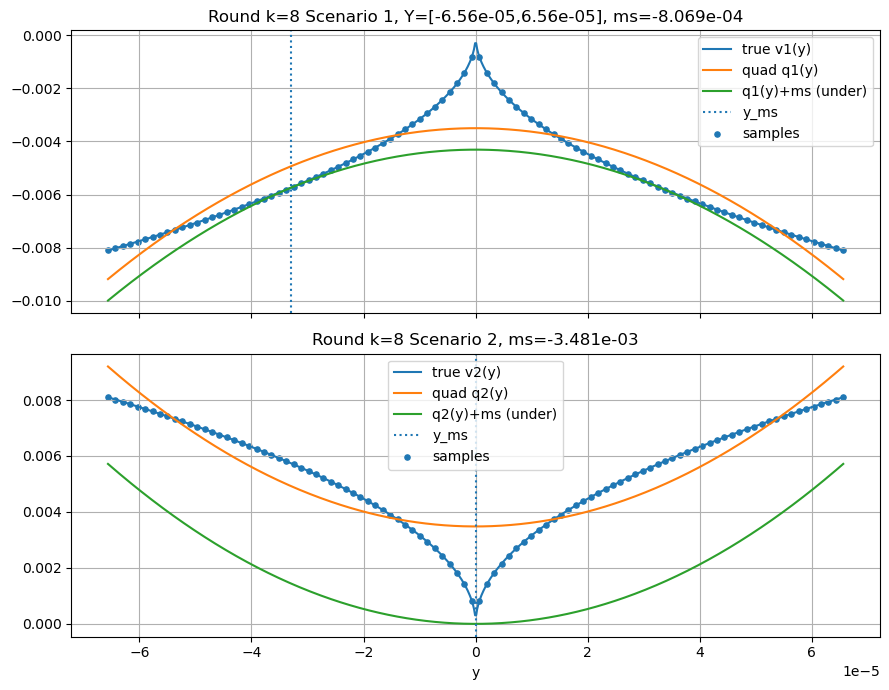

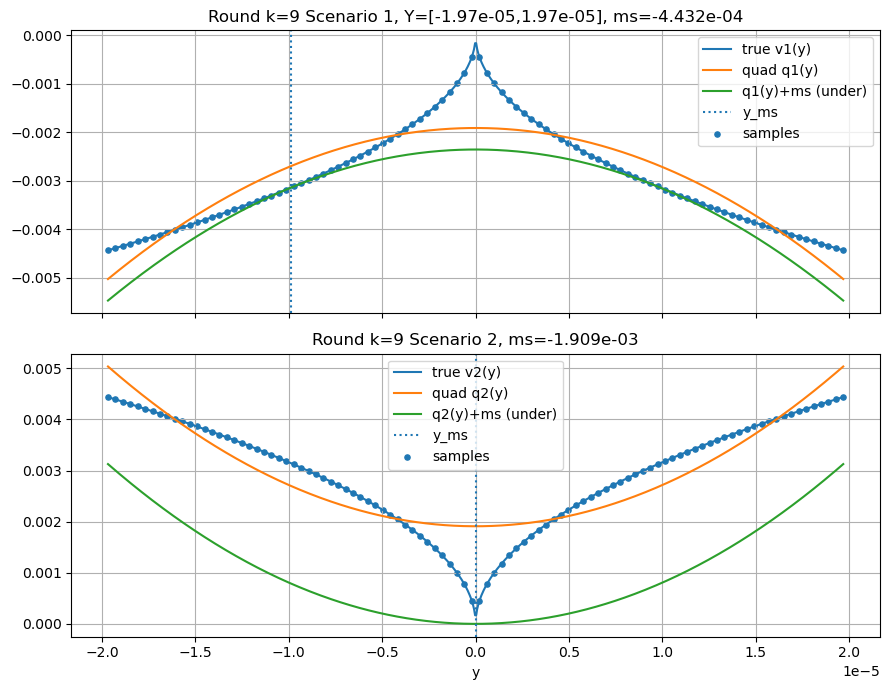

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from dataclasses import dataclass
from typing import Callable, Tuple, Dict, Optional

# ============================================================
# P4: v1(y) = -sqrt(|y|), v2(y) = +sqrt(|y|)
# ============================================================
def v1(y: float) -> float:
    return -np.sqrt(abs(y))

def v2(y: float) -> float:
    return +np.sqrt(abs(y))

P1 = 0.5
P2 = 0.5

# ============================================================
# Models
# ============================================================
@dataclass
class QuadModel:
    a: float
    b: float
    c: float
    ms: float       # shift so that q+ms <= v on Y
    y_ms: float     # argmax of (q - v) over Y

    def q(self, y):
        y = np.asarray(y, dtype=float)
        return self.a*y*y + self.b*y + self.c

    def under(self, y):
        return self.q(y) + self.ms

@dataclass
class FitDiag:
    ys: np.ndarray
    fs: np.ndarray
    w: np.ndarray
    y_ms: float
    ms: float

# ============================================================
# Weighted least squares fit: q(y)=a y^2 + b y + c
# ============================================================
def fit_weighted_quadratic(ys: np.ndarray, fs: np.ndarray, w: np.ndarray) -> Tuple[float,float,float]:
    ys = np.asarray(ys, dtype=float).ravel()
    fs = np.asarray(fs, dtype=float).ravel()
    w  = np.asarray(w,  dtype=float).ravel()
    assert ys.shape == fs.shape == w.shape

    X = np.vstack([ys**2, ys, np.ones_like(ys)]).T
    W = np.sqrt(np.clip(w, 0.0, np.inf))
    Xw = X * W[:, None]
    fw = fs * W
    coef, *_ = np.linalg.lstsq(Xw, fw, rcond=None)
    a,b,c = coef.tolist()
    return a,b,c

# ============================================================
# Robust "exact" shift (grid global search + local refine)
# We want ms = - max_{y in Y} (q(y) - v(y))
# so that q(y) + ms <= v(y) for all y in Y.
# ============================================================
def robust_shift_to_underestimator(
    v: Callable[[float], float],
    a: float, b: float, c: float,
    Y: Tuple[float,float],
    grid_n: int = 6001,
    refine_iters: int = 40
) -> Tuple[float,float]:
    lo, hi = Y
    ys = np.linspace(lo, hi, grid_n)

    # h(y) = q(y) - v(y), we need its max
    qv = a*ys*ys + b*ys + c
    vv = np.array([v(float(t)) for t in ys])
    h  = qv - vv

    idx = int(np.argmax(h))
    y0  = float(ys[idx])
    best_val = float(h[idx])

    # local refine around y0 via ternary search on a small bracket
    # (safe even if not strictly unimodal: bracket is tiny, so it's fine)
    # choose bracket as neighbors in grid
    L = float(ys[max(idx-1, 0)])
    U = float(ys[min(idx+1, grid_n-1)])
    if U - L < 1e-15:
        ms = -best_val
        return ms, y0

    def h_scalar(t: float) -> float:
        return (a*t*t + b*t + c) - v(t)

    l, r = L, U
    for _ in range(refine_iters):
        m1 = l + (r-l)/3.0
        m2 = r - (r-l)/3.0
        if h_scalar(m1) < h_scalar(m2):
            l = m1
        else:
            r = m2
    y_ref = 0.5*(l+r)
    val_ref = h_scalar(y_ref)

    if val_ref > best_val:
        best_val = float(val_ref)
        y0 = float(y_ref)

    ms = -best_val
    return float(ms), float(y0)

# ============================================================
# Sampling strategies
# 1) random: n_samples uniform random in [lo,hi]
# 2) grid:   n_samples evenly spaced in [lo,hi]
# 3) grid_low_weight: same points as grid, but weights emphasize low fs
# 4) grid_then_ms_nearby:
#       - first grid (n_samples), fit once (uniform weights) -> get ms point y_ms0
#       - then add extra 30 random points near y_ms0 (radius r)
#       - final fit on combined points (uniform weights)
# ============================================================
def make_samples(
    sampling_strategy: str,
    v: Callable[[float], float],
    Y: Tuple[float,float],
    n_samples: int,
    rng: np.random.Generator,
    extra_ms_points: int = 30,
    ms_radius_frac: float = 0.10,  # neighborhood radius = frac * (hi-lo)
) -> Tuple[np.ndarray, np.ndarray]:
    lo, hi = Y

    if sampling_strategy == "random":
        ys = rng.uniform(lo, hi, size=n_samples)

    elif sampling_strategy in ("grid", "grid_low_weight", "grid_then_ms_nearby"):
        ys = np.linspace(lo, hi, n_samples)

    else:
        raise ValueError(f"Unknown sampling_strategy={sampling_strategy}")

    ys = np.unique(ys)
    fs = np.array([v(float(t)) for t in ys])

    # strategy 4: add points near preliminary ms point
    if sampling_strategy == "grid_then_ms_nearby":
        # preliminary uniform-weight fit
        w0 = np.ones_like(fs)
        a0,b0,c0 = fit_weighted_quadratic(ys, fs, w0)
        ms0, y_ms0 = robust_shift_to_underestimator(v, a0,b0,c0, Y)

        radius = ms_radius_frac * (hi - lo)
        radius = max(radius, 1e-12)
        L = max(lo, y_ms0 - radius)
        U = min(hi, y_ms0 + radius)
        ys_extra = rng.uniform(L, U, size=extra_ms_points)

        ys = np.unique(np.concatenate([ys, ys_extra]))
        fs = np.array([v(float(t)) for t in ys])

    return ys, fs

def make_weights(
    sampling_strategy: str,
    ys: np.ndarray,
    fs: np.ndarray,
    alpha: float = 5.0
) -> np.ndarray:
    # default uniform
    if sampling_strategy in ("random", "grid", "grid_then_ms_nearby"):
        return np.ones_like(fs)

    # grid + low-value-focused weights
    if sampling_strategy == "grid_low_weight":
        # weight higher when fs is smaller
        # w_i = exp(-alpha*(fs_i - min(fs)))
        fmin = float(np.min(fs))
        return np.exp(-alpha * (fs - fmin))

    raise ValueError(f"Unknown sampling_strategy={sampling_strategy}")

# ============================================================
# Build WLSQ underestimator per scenario for one interval Y
# ============================================================
def build_wlsq_underestimator(
    v: Callable[[float], float],
    Y: Tuple[float,float],
    n_samples: int,
    rng: np.random.Generator,
    sampling_strategy: str,
    extra_ms_points: int = 30,
) -> Tuple[QuadModel, FitDiag]:
    ys, fs = make_samples(
        sampling_strategy=sampling_strategy,
        v=v, Y=Y, n_samples=n_samples, rng=rng,
        extra_ms_points=extra_ms_points
    )
    w = make_weights(sampling_strategy, ys, fs)

    a,b,c = fit_weighted_quadratic(ys, fs, w)
    ms, y_ms = robust_shift_to_underestimator(v, a,b,c, Y)

    model = QuadModel(a=a, b=b, c=c, ms=ms, y_ms=y_ms)
    diag  = FitDiag(ys=ys, fs=fs, w=w, y_ms=y_ms, ms=ms)
    return model, diag

# ============================================================
# Compute min of quadratic on interval
# ============================================================
def min_of_quadratic_on_interval(a: float, b: float, c: float, lo: float, hi: float) -> float:
    vals = [a*lo*lo + b*lo + c, a*hi*hi + b*hi + c]
    if a > 0:
        ystar = -b/(2.0*a)
        if lo <= ystar <= hi:
            vals.append(a*ystar*ystar + b*ystar + c)
    return float(min(vals))

# Hausdorff error on Y for P4:
# true min of (0.5*v1+0.5*v2) is 0 on symmetric interval around 0
def hausdorff_error_for_interval(Y: Tuple[float,float], m1: QuadModel, m2: QuadModel) -> Tuple[float,float]:
    lo, hi = Y
    a = P1*m1.a + P2*m2.a
    b = P1*m1.b + P2*m2.b
    c = P1*(m1.c + m1.ms) + P2*(m2.c + m2.ms)
    lb = min_of_quadratic_on_interval(a,b,c,lo,hi)
    err = -lb
    return lb, err

# ============================================================
# Experiment runner
# ============================================================
def run_p4_experiment(
    sampling_strategy: str,
    eps0: float = 1.0,
    rho: float = 0.5,
    n_levels: int = 10,
    n_samples: int = 100,
    extra_ms_points: int = 30,
    seed: int = 1,
) -> Dict[str, object]:
    rng = np.random.default_rng(seed)

    eps_list, diam_list, lb_list, err_list = [], [], [], []
    rounds = []

    for k in range(n_levels):
        eps = eps0 * (rho**k)
        Y = (-eps, eps)

        m1, d1 = build_wlsq_underestimator(v1, Y, n_samples, rng, sampling_strategy, extra_ms_points)
        m2, d2 = build_wlsq_underestimator(v2, Y, n_samples, rng, sampling_strategy, extra_ms_points)

        lb, err = hausdorff_error_for_interval(Y, m1, m2)

        eps_list.append(eps)
        diam_list.append(2.0*eps)
        lb_list.append(lb)
        err_list.append(err)

        rounds.append(dict(k=k, Y=Y, m1=m1, m2=m2, d1=d1, d2=d2))

    return {
        "sampling_strategy": sampling_strategy,
        "eps": np.array(eps_list),
        "diam": np.array(diam_list),
        "lb": np.array(lb_list),
        "err": np.array(err_list),
        "rounds": rounds,
        "seed": seed,
        "n_samples": n_samples,
        "extra_ms_points": extra_ms_points
    }

def estimate_slope_loglog(x: np.ndarray, y: np.ndarray) -> float:
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    mask = (x > 0) & (y > 0)
    x = x[mask]; y = y[mask]
    beta, _ = np.polyfit(np.log(x), np.log(y), 1)
    return float(beta)

def plot_convergence(out: Dict[str, object], slope_fit_last: int = 6):
    diam = out["diam"]
    err  = out["err"]
    mask = (diam > 0) & (err > 0)
    diam = diam[mask]
    err  = err[mask]

    K = min(slope_fit_last, len(diam))
    beta = estimate_slope_loglog(diam[-K:], err[-K:])

    # fit line
    lx = np.log(diam[-K:])
    ly = np.log(err[-K:])
    c = float(np.mean(ly - beta*lx))
    fit_err = np.exp(beta*np.log(diam) + c)

    plt.figure(figsize=(7,5))
    plt.loglog(diam, err, marker="o", linestyle="-", label="Hausdorff error")
    plt.loglog(diam, fit_err, linestyle="--", label=f"fit last {K}, beta={beta:.3f}")
    plt.xlabel("diam(Y)")
    plt.ylabel("Hausdorff error")
    plt.grid(True, which="both")
    plt.title(f"P4 WLSQ — sampling_strategy={out['sampling_strategy']}")
    plt.legend()
    plt.show()

    return beta

def plot_round_scenarios(round_info: Dict[str, object], n_grid: int = 600, show_samples: bool = True):
    k = round_info["k"]
    lo, hi = round_info["Y"]
    m1, m2 = round_info["m1"], round_info["m2"]
    d1, d2 = round_info["d1"], round_info["d2"]

    ys = np.linspace(lo, hi, n_grid)

    fig, axes = plt.subplots(2,1,sharex=True,figsize=(9,7))

    # Scenario 1
    ax = axes[0]
    ax.plot(ys, [v1(float(t)) for t in ys], label="true v1(y)")
    ax.plot(ys, m1.q(ys), label="quad q1(y)")
    ax.plot(ys, m1.under(ys), label="q1(y)+ms (under)")
    ax.axvline(m1.y_ms, linestyle=":", label="y_ms")
    if show_samples:
        ax.scatter(d1.ys, d1.fs, s=14, label="samples")
    ax.grid(True)
    ax.set_title(f"Round k={k} Scenario 1, Y=[{lo:.2e},{hi:.2e}], ms={m1.ms:.3e}")
    ax.legend()

    # Scenario 2
    ax = axes[1]
    ax.plot(ys, [v2(float(t)) for t in ys], label="true v2(y)")
    ax.plot(ys, m2.q(ys), label="quad q2(y)")
    ax.plot(ys, m2.under(ys), label="q2(y)+ms (under)")
    ax.axvline(m2.y_ms, linestyle=":", label="y_ms")
    if show_samples:
        ax.scatter(d2.ys, d2.fs, s=14, label="samples")
    ax.grid(True)
    ax.set_title(f"Round k={k} Scenario 2, ms={m2.ms:.3e}")
    ax.legend()

    axes[1].set_xlabel("y")
    fig.tight_layout()
    plt.show()

# ============================================================
# RUN ONE STRATEGY (switch here)
# ============================================================
sampling_strategy = "grid_low_weight"
# sampling_strategy = "grid"
# sampling_strategy = "grid_low_weight"
# sampling_strategy = "grid_then_ms_nearby"

params = dict(
    sampling_strategy=sampling_strategy,
    eps0=1.0,
    rho=0.3,
    n_levels=10,
    n_samples=100,
    extra_ms_points=30,  # only used in strategy 4
    seed=1,
)

out = run_p4_experiment(**params)

beta = plot_convergence(out, slope_fit_last=6)
print("Estimated beta =", beta)

# per-iteration plots (optional)
for r in out["rounds"]:
    plot_round_scenarios(r, n_grid=700, show_samples=True)


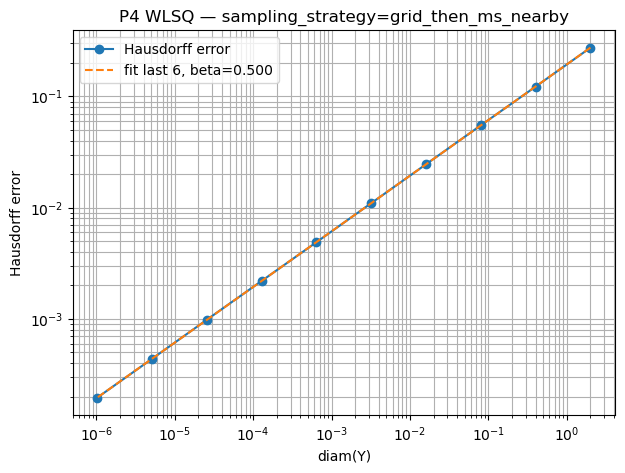

Estimated beta = 0.5000564721038311


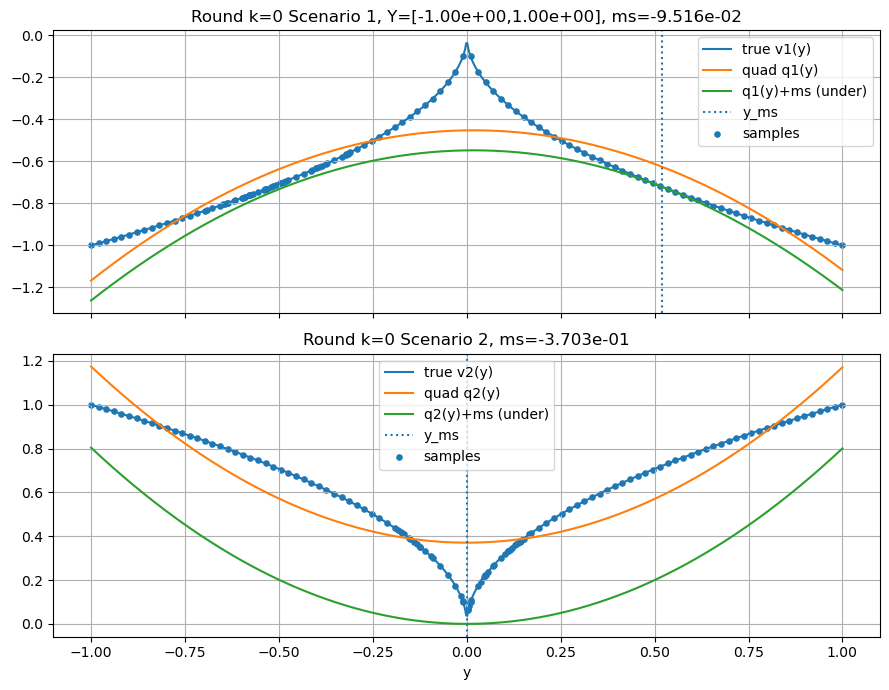

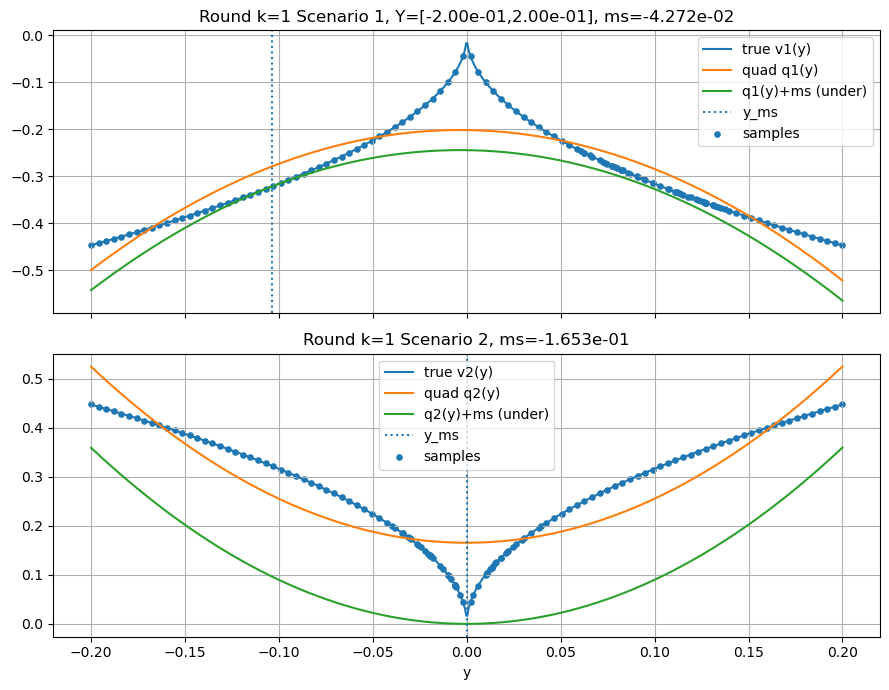

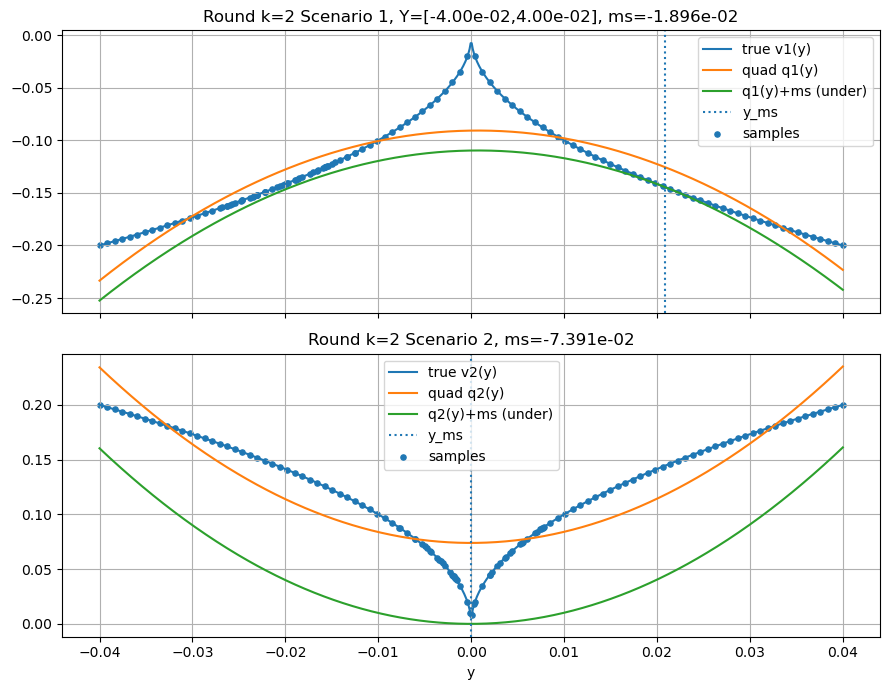

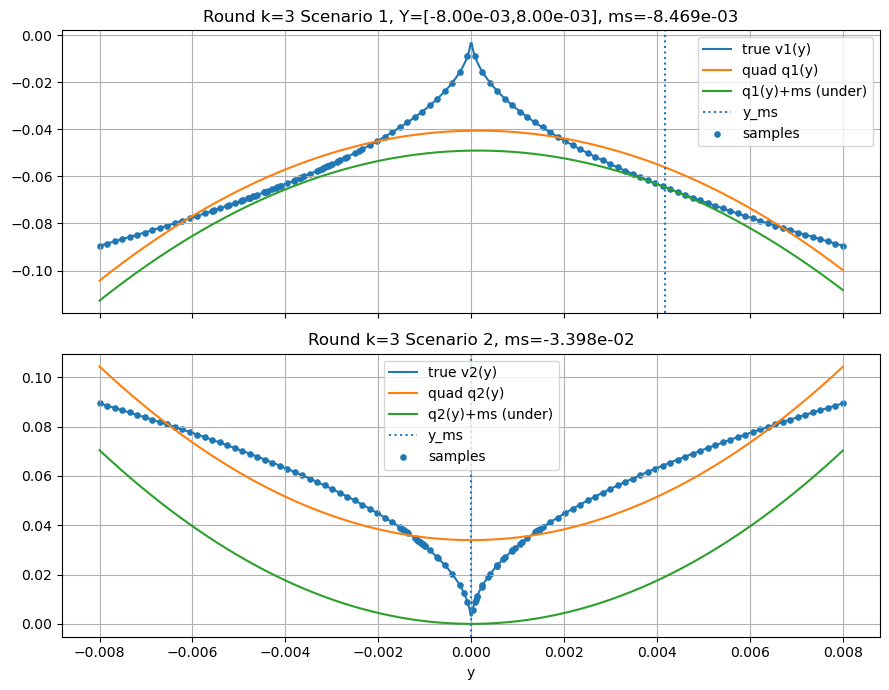

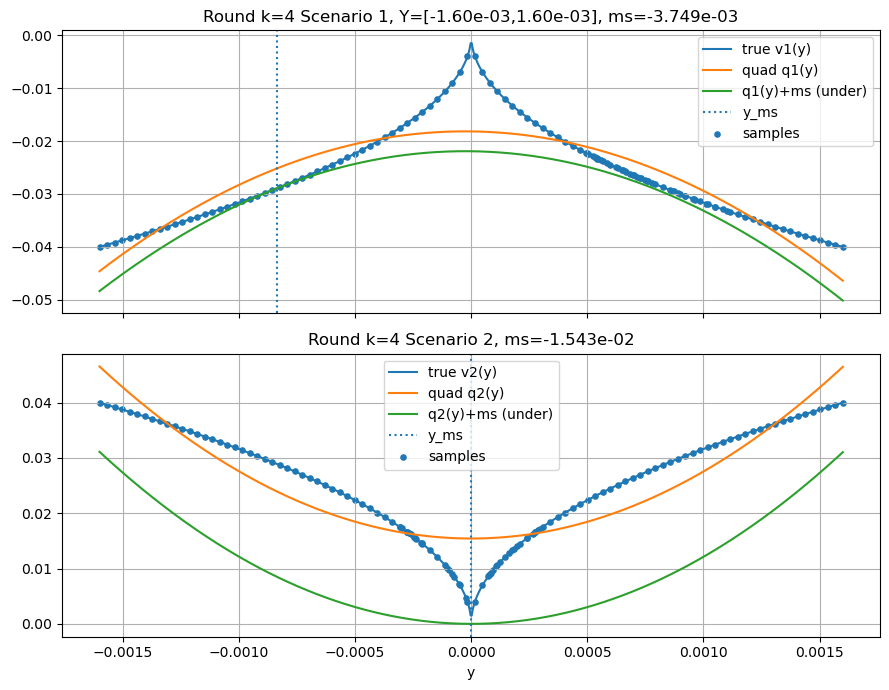

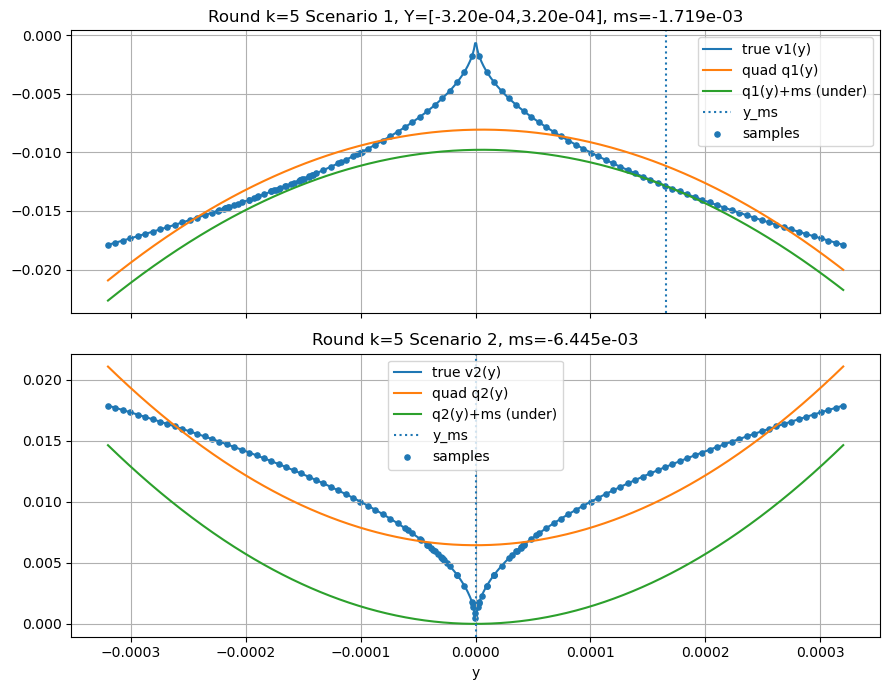

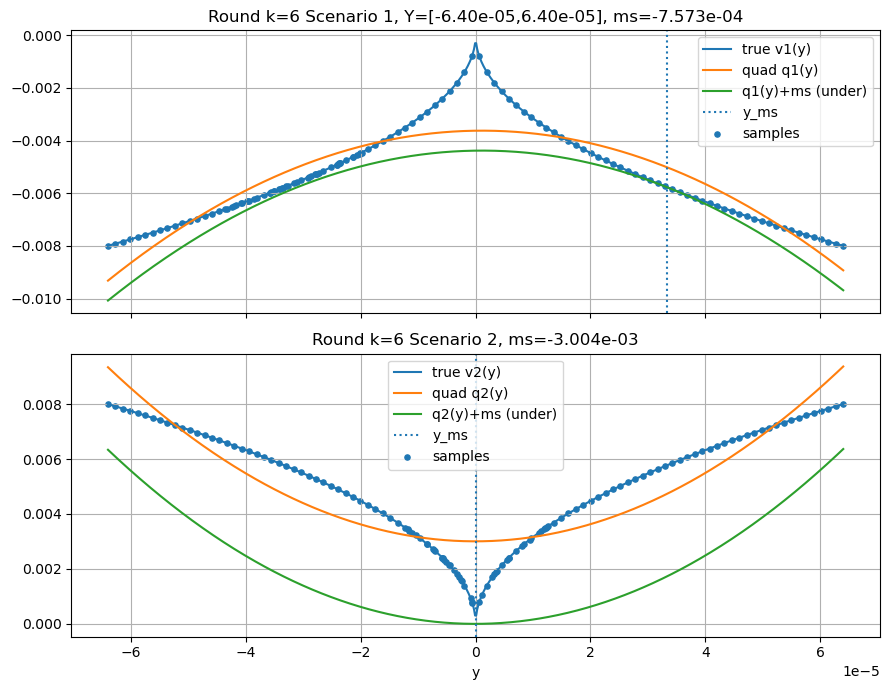

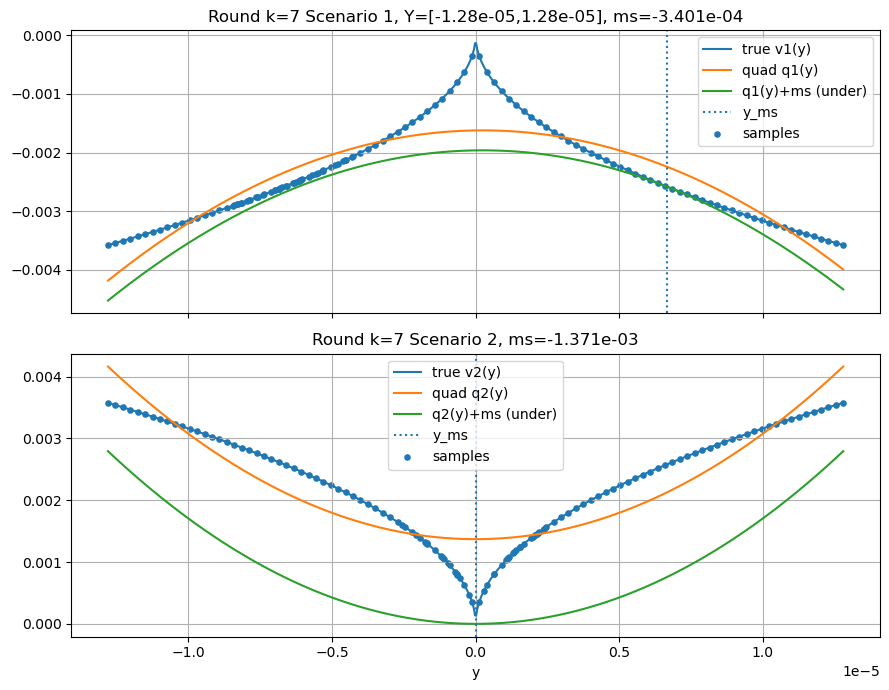

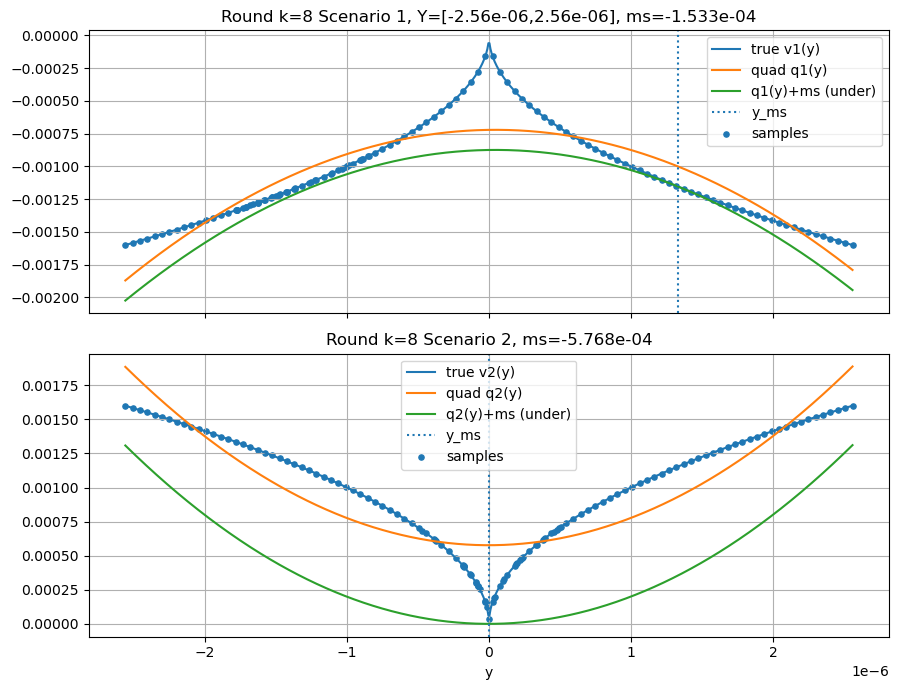

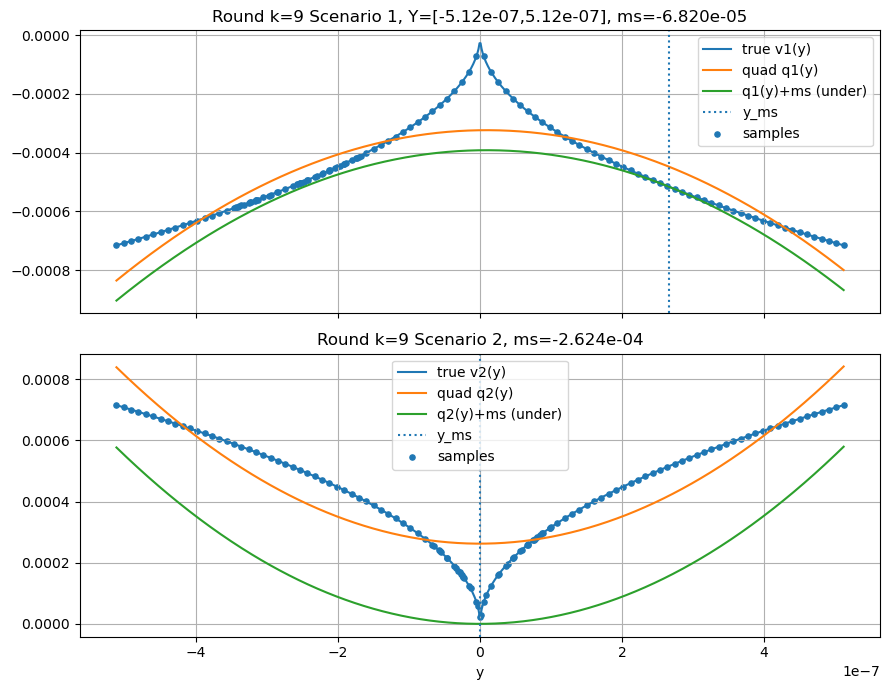

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from dataclasses import dataclass
from typing import Callable, Tuple, Dict, Optional

# ============================================================
# P4: v1(y) = -sqrt(|y|), v2(y) = +sqrt(|y|)
# ============================================================
def v1(y: float) -> float:
    return -np.sqrt(abs(y))

def v2(y: float) -> float:
    return +np.sqrt(abs(y))

P1 = 0.5
P2 = 0.5

# ============================================================
# Models
# ============================================================
@dataclass
class QuadModel:
    a: float
    b: float
    c: float
    ms: float       # shift so that q+ms <= v on Y
    y_ms: float     # argmax of (q - v) over Y

    def q(self, y):
        y = np.asarray(y, dtype=float)
        return self.a*y*y + self.b*y + self.c

    def under(self, y):
        return self.q(y) + self.ms

@dataclass
class FitDiag:
    ys: np.ndarray
    fs: np.ndarray
    w: np.ndarray
    y_ms: float
    ms: float

# ============================================================
# Weighted least squares fit: q(y)=a y^2 + b y + c
# ============================================================
def fit_weighted_quadratic(ys: np.ndarray, fs: np.ndarray, w: np.ndarray) -> Tuple[float,float,float]:
    ys = np.asarray(ys, dtype=float).ravel()
    fs = np.asarray(fs, dtype=float).ravel()
    w  = np.asarray(w,  dtype=float).ravel()
    assert ys.shape == fs.shape == w.shape

    X = np.vstack([ys**2, ys, np.ones_like(ys)]).T
    W = np.sqrt(np.clip(w, 0.0, np.inf))
    Xw = X * W[:, None]
    fw = fs * W
    coef, *_ = np.linalg.lstsq(Xw, fw, rcond=None)
    a,b,c = coef.tolist()
    return a,b,c

# ============================================================
# Robust "exact" shift (grid global search + local refine)
# We want ms = - max_{y in Y} (q(y) - v(y))
# so that q(y) + ms <= v(y) for all y in Y.
# ============================================================
def robust_shift_to_underestimator(
    v: Callable[[float], float],
    a: float, b: float, c: float,
    Y: Tuple[float,float],
    grid_n: int = 6001,
    refine_iters: int = 40
) -> Tuple[float,float]:
    lo, hi = Y
    ys = np.linspace(lo, hi, grid_n)

    # h(y) = q(y) - v(y), we need its max
    qv = a*ys*ys + b*ys + c
    vv = np.array([v(float(t)) for t in ys])
    h  = qv - vv

    idx = int(np.argmax(h))
    y0  = float(ys[idx])
    best_val = float(h[idx])

    # local refine around y0 via ternary search on a small bracket
    # (safe even if not strictly unimodal: bracket is tiny, so it's fine)
    # choose bracket as neighbors in grid
    L = float(ys[max(idx-1, 0)])
    U = float(ys[min(idx+1, grid_n-1)])
    if U - L < 1e-15:
        ms = -best_val
        return ms, y0

    def h_scalar(t: float) -> float:
        return (a*t*t + b*t + c) - v(t)

    l, r = L, U
    for _ in range(refine_iters):
        m1 = l + (r-l)/3.0
        m2 = r - (r-l)/3.0
        if h_scalar(m1) < h_scalar(m2):
            l = m1
        else:
            r = m2
    y_ref = 0.5*(l+r)
    val_ref = h_scalar(y_ref)

    if val_ref > best_val:
        best_val = float(val_ref)
        y0 = float(y_ref)

    ms = -best_val
    return float(ms), float(y0)

# ============================================================
# Sampling strategies
# 1) random: n_samples uniform random in [lo,hi]
# 2) grid:   n_samples evenly spaced in [lo,hi]
# 3) grid_low_weight: same points as grid, but weights emphasize low fs
# 4) grid_then_ms_nearby:
#       - first grid (n_samples), fit once (uniform weights) -> get ms point y_ms0
#       - then add extra 30 random points near y_ms0 (radius r)
#       - final fit on combined points (uniform weights)
# ============================================================
def make_samples(
    sampling_strategy: str,
    v: Callable[[float], float],
    Y: Tuple[float,float],
    n_samples: int,
    rng: np.random.Generator,
    extra_ms_points: int = 30,
    ms_radius_frac: float = 0.10,  # neighborhood radius = frac * (hi-lo)
) -> Tuple[np.ndarray, np.ndarray]:
    lo, hi = Y

    if sampling_strategy == "random":
        ys = rng.uniform(lo, hi, size=n_samples)

    elif sampling_strategy in ("grid", "grid_low_weight", "grid_then_ms_nearby"):
        ys = np.linspace(lo, hi, n_samples)

    else:
        raise ValueError(f"Unknown sampling_strategy={sampling_strategy}")

    ys = np.unique(ys)
    fs = np.array([v(float(t)) for t in ys])

    # strategy 4: add points near preliminary ms point
    if sampling_strategy == "grid_then_ms_nearby":
        # preliminary uniform-weight fit
        w0 = np.ones_like(fs)
        a0,b0,c0 = fit_weighted_quadratic(ys, fs, w0)
        ms0, y_ms0 = robust_shift_to_underestimator(v, a0,b0,c0, Y)

        radius = ms_radius_frac * (hi - lo)
        radius = max(radius, 1e-12)
        L = max(lo, y_ms0 - radius)
        U = min(hi, y_ms0 + radius)
        ys_extra = rng.uniform(L, U, size=extra_ms_points)

        ys = np.unique(np.concatenate([ys, ys_extra]))
        fs = np.array([v(float(t)) for t in ys])

    return ys, fs

def make_weights(
    sampling_strategy: str,
    ys: np.ndarray,
    fs: np.ndarray,
    alpha: float = 5.0
) -> np.ndarray:
    # default uniform
    if sampling_strategy in ("random", "grid", "grid_then_ms_nearby"):
        return np.ones_like(fs)

    # grid + low-value-focused weights
    if sampling_strategy == "grid_low_weight":
        # weight higher when fs is smaller
        # w_i = exp(-alpha*(fs_i - min(fs)))
        fmin = float(np.min(fs))
        return np.exp(-alpha * (fs - fmin))

    raise ValueError(f"Unknown sampling_strategy={sampling_strategy}")

# ============================================================
# Build WLSQ underestimator per scenario for one interval Y
# ============================================================
def build_wlsq_underestimator(
    v: Callable[[float], float],
    Y: Tuple[float,float],
    n_samples: int,
    rng: np.random.Generator,
    sampling_strategy: str,
    extra_ms_points: int = 30,
) -> Tuple[QuadModel, FitDiag]:
    ys, fs = make_samples(
        sampling_strategy=sampling_strategy,
        v=v, Y=Y, n_samples=n_samples, rng=rng,
        extra_ms_points=extra_ms_points
    )
    w = make_weights(sampling_strategy, ys, fs)

    a,b,c = fit_weighted_quadratic(ys, fs, w)
    ms, y_ms = robust_shift_to_underestimator(v, a,b,c, Y)

    model = QuadModel(a=a, b=b, c=c, ms=ms, y_ms=y_ms)
    diag  = FitDiag(ys=ys, fs=fs, w=w, y_ms=y_ms, ms=ms)
    return model, diag

# ============================================================
# Compute min of quadratic on interval
# ============================================================
def min_of_quadratic_on_interval(a: float, b: float, c: float, lo: float, hi: float) -> float:
    vals = [a*lo*lo + b*lo + c, a*hi*hi + b*hi + c]
    if a > 0:
        ystar = -b/(2.0*a)
        if lo <= ystar <= hi:
            vals.append(a*ystar*ystar + b*ystar + c)
    return float(min(vals))

# Hausdorff error on Y for P4:
# true min of (0.5*v1+0.5*v2) is 0 on symmetric interval around 0
def hausdorff_error_for_interval(Y: Tuple[float,float], m1: QuadModel, m2: QuadModel) -> Tuple[float,float]:
    lo, hi = Y
    a = P1*m1.a + P2*m2.a
    b = P1*m1.b + P2*m2.b
    c = P1*(m1.c + m1.ms) + P2*(m2.c + m2.ms)
    lb = min_of_quadratic_on_interval(a,b,c,lo,hi)
    err = -lb
    return lb, err

# ============================================================
# Experiment runner
# ============================================================
def run_p4_experiment(
    sampling_strategy: str,
    eps0: float = 1.0,
    rho: float = 0.5,
    n_levels: int = 10,
    n_samples: int = 100,
    extra_ms_points: int = 30,
    seed: int = 1,
) -> Dict[str, object]:
    rng = np.random.default_rng(seed)

    eps_list, diam_list, lb_list, err_list = [], [], [], []
    rounds = []

    for k in range(n_levels):
        eps = eps0 * (rho**k)
        Y = (-eps, eps)

        m1, d1 = build_wlsq_underestimator(v1, Y, n_samples, rng, sampling_strategy, extra_ms_points)
        m2, d2 = build_wlsq_underestimator(v2, Y, n_samples, rng, sampling_strategy, extra_ms_points)

        lb, err = hausdorff_error_for_interval(Y, m1, m2)

        eps_list.append(eps)
        diam_list.append(2.0*eps)
        lb_list.append(lb)
        err_list.append(err)

        rounds.append(dict(k=k, Y=Y, m1=m1, m2=m2, d1=d1, d2=d2))

    return {
        "sampling_strategy": sampling_strategy,
        "eps": np.array(eps_list),
        "diam": np.array(diam_list),
        "lb": np.array(lb_list),
        "err": np.array(err_list),
        "rounds": rounds,
        "seed": seed,
        "n_samples": n_samples,
        "extra_ms_points": extra_ms_points
    }

def estimate_slope_loglog(x: np.ndarray, y: np.ndarray) -> float:
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    mask = (x > 0) & (y > 0)
    x = x[mask]; y = y[mask]
    beta, _ = np.polyfit(np.log(x), np.log(y), 1)
    return float(beta)

def plot_convergence(out: Dict[str, object], slope_fit_last: int = 6):
    diam = out["diam"]
    err  = out["err"]
    mask = (diam > 0) & (err > 0)
    diam = diam[mask]
    err  = err[mask]

    K = min(slope_fit_last, len(diam))
    beta = estimate_slope_loglog(diam[-K:], err[-K:])

    # fit line
    lx = np.log(diam[-K:])
    ly = np.log(err[-K:])
    c = float(np.mean(ly - beta*lx))
    fit_err = np.exp(beta*np.log(diam) + c)

    plt.figure(figsize=(7,5))
    plt.loglog(diam, err, marker="o", linestyle="-", label="Hausdorff error")
    plt.loglog(diam, fit_err, linestyle="--", label=f"fit last {K}, beta={beta:.3f}")
    plt.xlabel("diam(Y)")
    plt.ylabel("Hausdorff error")
    plt.grid(True, which="both")
    plt.title(f"P4 WLSQ — sampling_strategy={out['sampling_strategy']}")
    plt.legend()
    plt.show()

    return beta

def plot_round_scenarios(round_info: Dict[str, object], n_grid: int = 600, show_samples: bool = True):
    k = round_info["k"]
    lo, hi = round_info["Y"]
    m1, m2 = round_info["m1"], round_info["m2"]
    d1, d2 = round_info["d1"], round_info["d2"]

    ys = np.linspace(lo, hi, n_grid)

    fig, axes = plt.subplots(2,1,sharex=True,figsize=(9,7))

    # Scenario 1
    ax = axes[0]
    ax.plot(ys, [v1(float(t)) for t in ys], label="true v1(y)")
    ax.plot(ys, m1.q(ys), label="quad q1(y)")
    ax.plot(ys, m1.under(ys), label="q1(y)+ms (under)")
    ax.axvline(m1.y_ms, linestyle=":", label="y_ms")
    if show_samples:
        ax.scatter(d1.ys, d1.fs, s=14, label="samples")
    ax.grid(True)
    ax.set_title(f"Round k={k} Scenario 1, Y=[{lo:.2e},{hi:.2e}], ms={m1.ms:.3e}")
    ax.legend()

    # Scenario 2
    ax = axes[1]
    ax.plot(ys, [v2(float(t)) for t in ys], label="true v2(y)")
    ax.plot(ys, m2.q(ys), label="quad q2(y)")
    ax.plot(ys, m2.under(ys), label="q2(y)+ms (under)")
    ax.axvline(m2.y_ms, linestyle=":", label="y_ms")
    if show_samples:
        ax.scatter(d2.ys, d2.fs, s=14, label="samples")
    ax.grid(True)
    ax.set_title(f"Round k={k} Scenario 2, ms={m2.ms:.3e}")
    ax.legend()

    axes[1].set_xlabel("y")
    fig.tight_layout()
    plt.show()

# ============================================================
# RUN ONE STRATEGY (switch here)
# ============================================================
sampling_strategy = "grid_then_ms_nearby"
# sampling_strategy = "grid"
# sampling_strategy = "grid_low_weight"
# sampling_strategy = "grid_then_ms_nearby"

params = dict(
    sampling_strategy=sampling_strategy,
    eps0=1.0,
    rho=0.2,
    n_levels=10,
    n_samples=100,
    extra_ms_points=30,  # only used in strategy 4
    seed=1,
)

out = run_p4_experiment(**params)

beta = plot_convergence(out, slope_fit_last=6)
print("Estimated beta =", beta)

# per-iteration plots (optional)
for r in out["rounds"]:
    plot_round_scenarios(r, n_grid=700, show_samples=True)


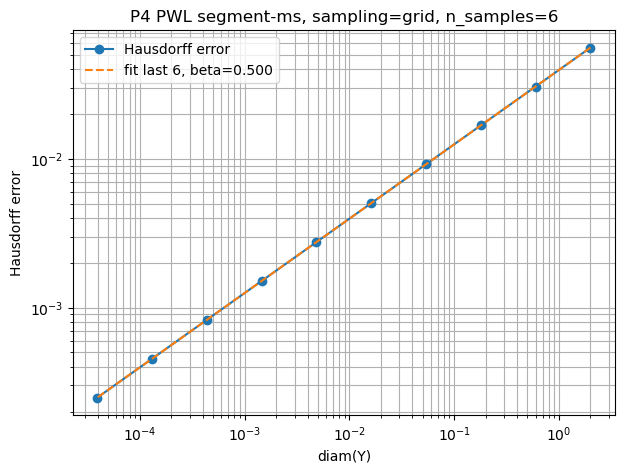

Estimated beta = 0.4999999999999997


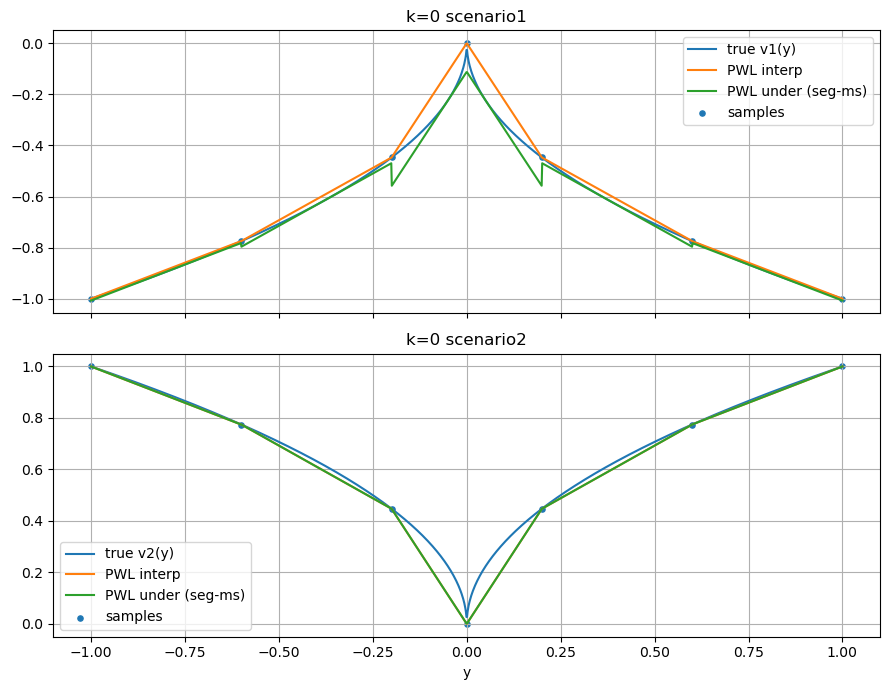

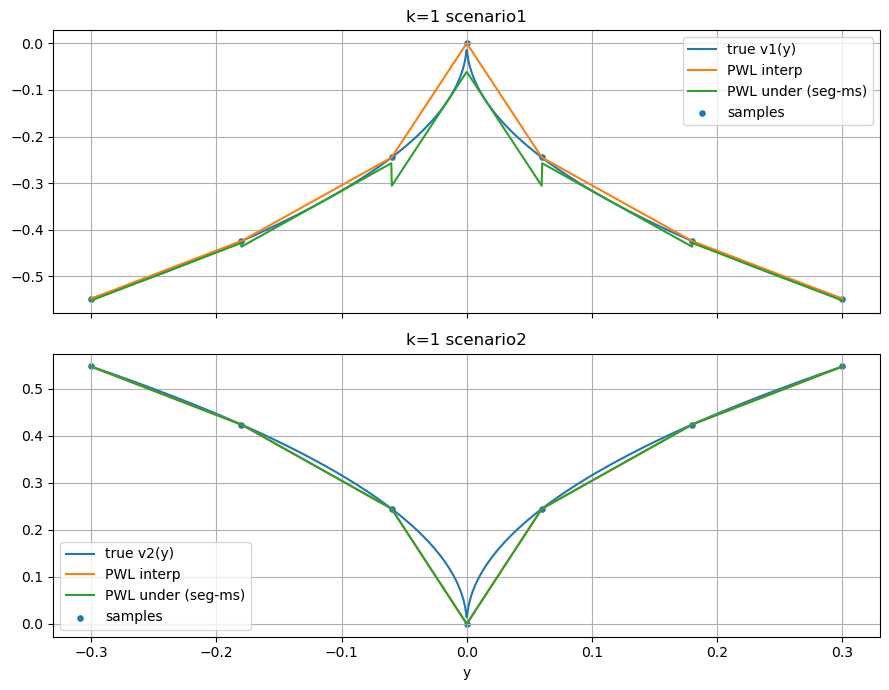

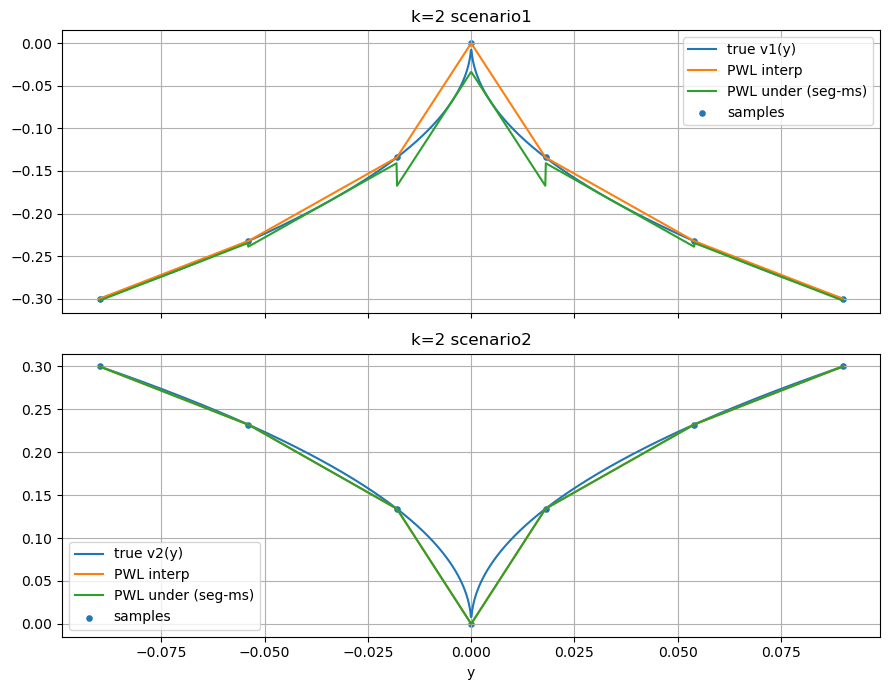

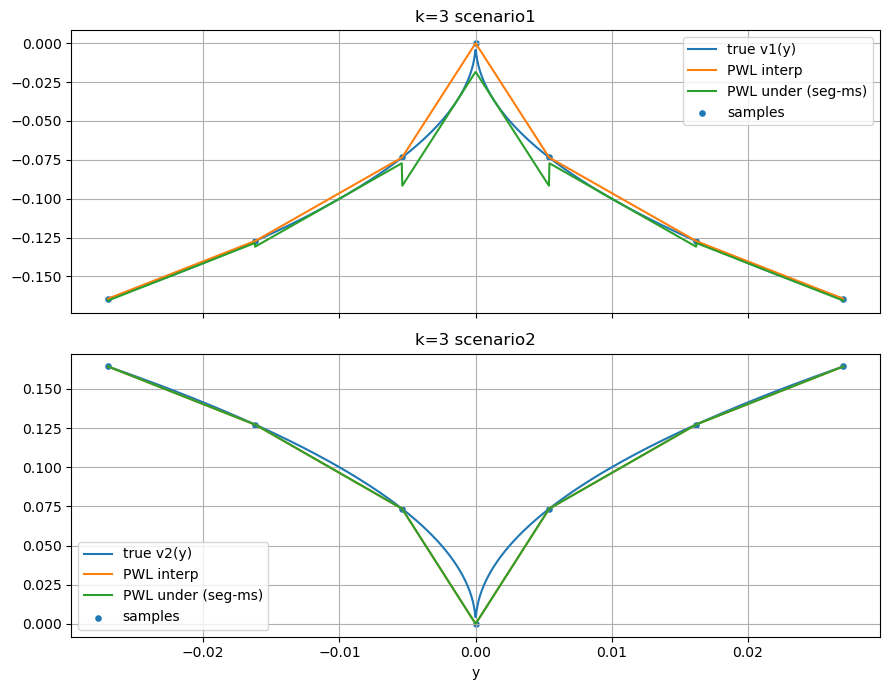

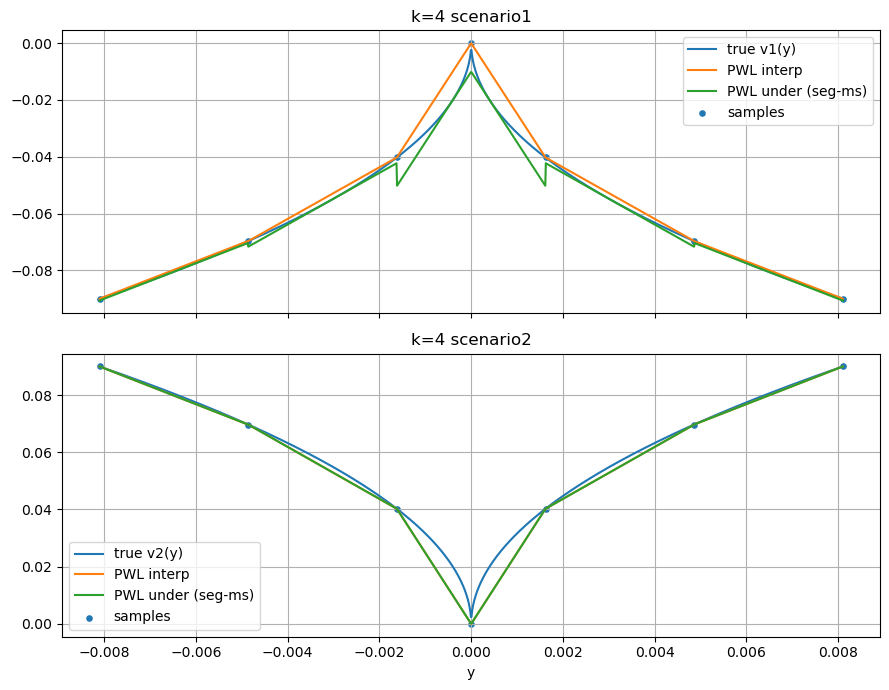

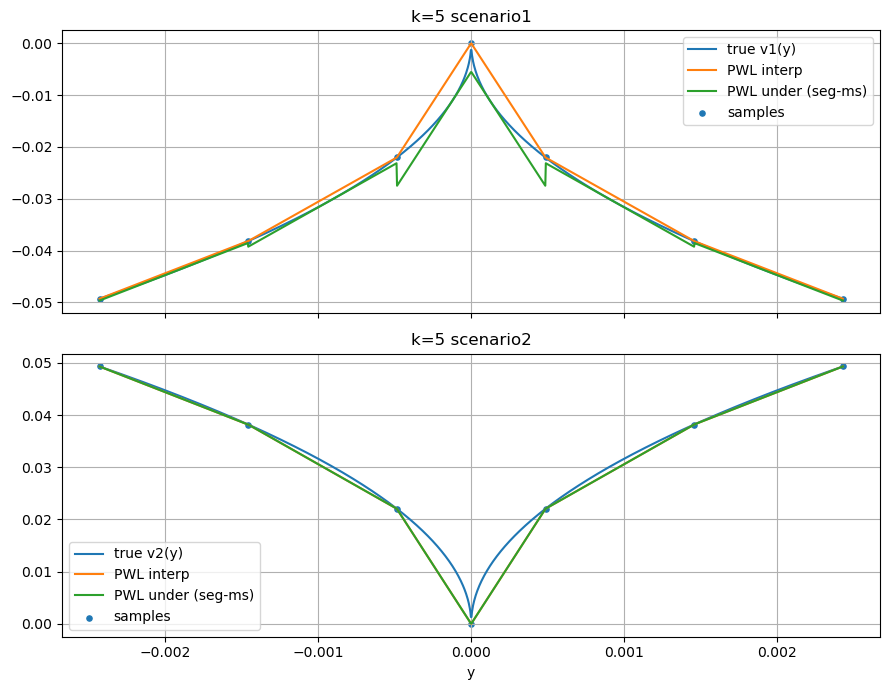

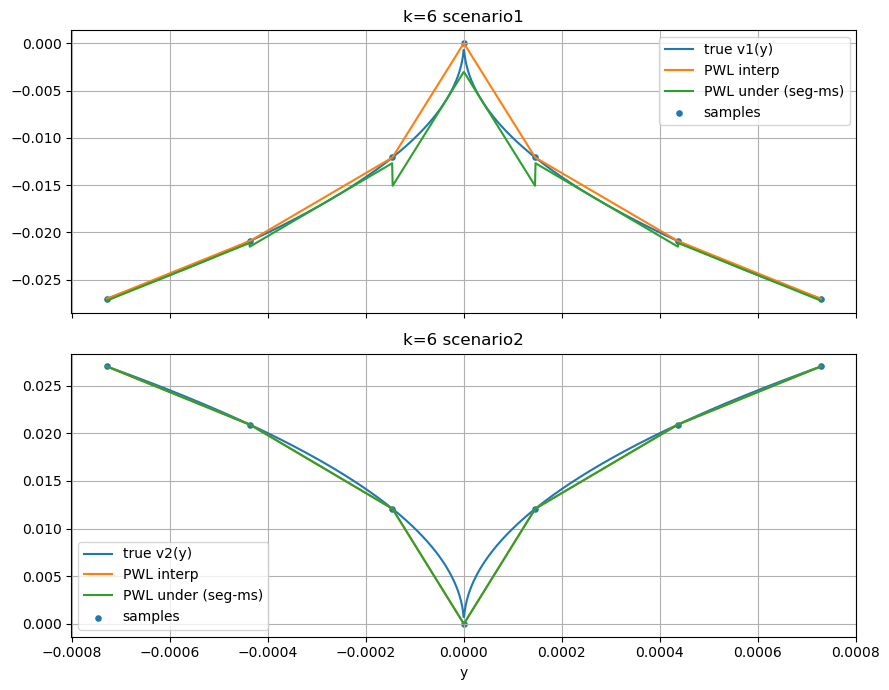

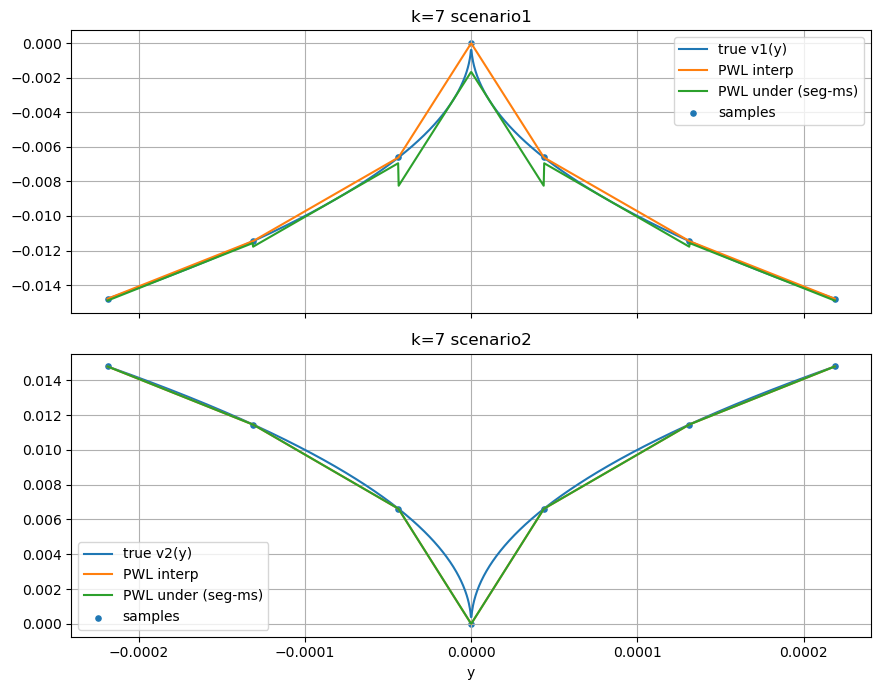

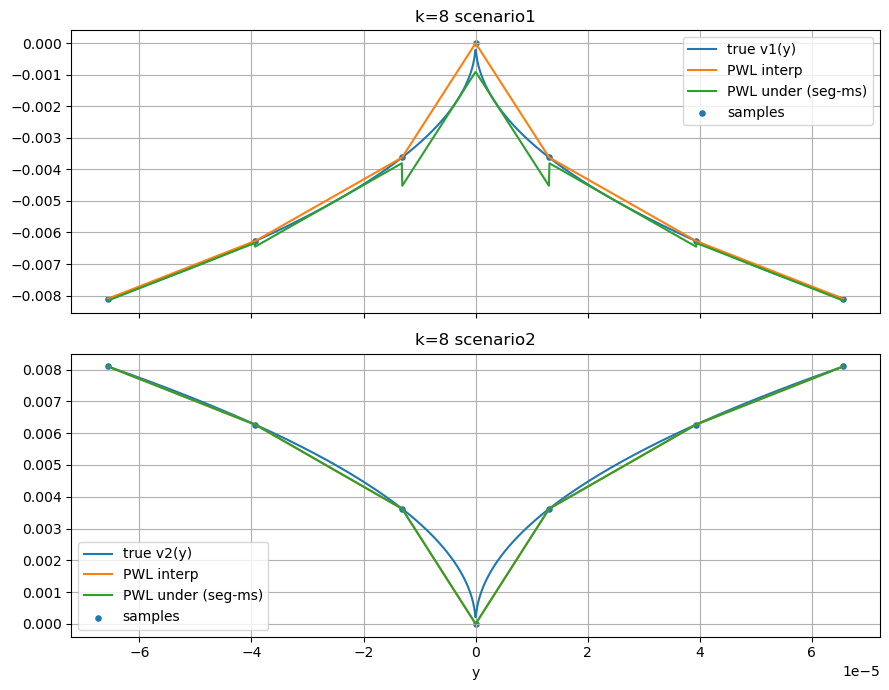

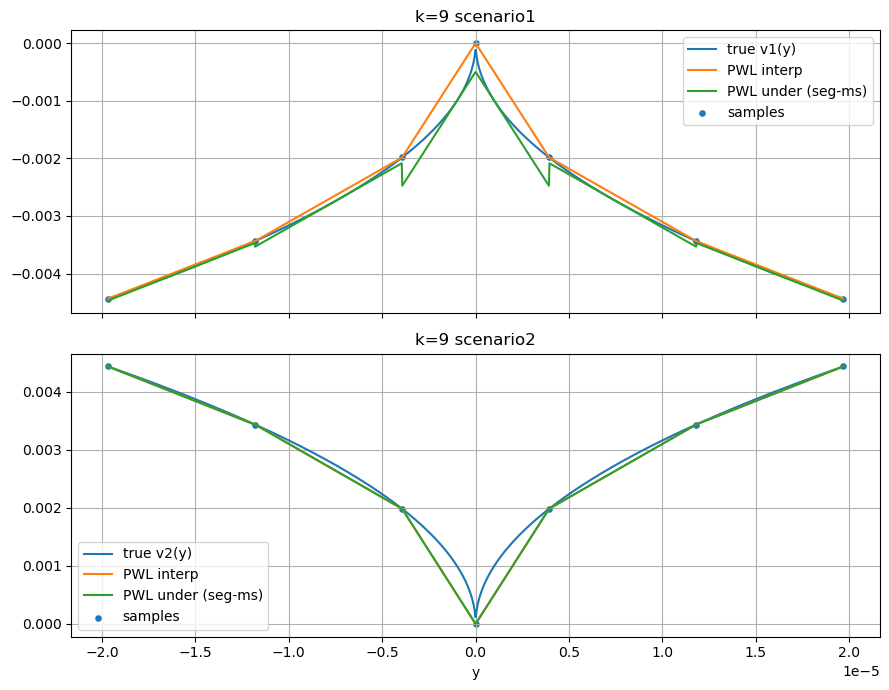

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from dataclasses import dataclass
from typing import Callable, Tuple, Dict

# ============================================================
# P4 scenarios
# ============================================================
def v1(y: float) -> float:
    return -np.sqrt(abs(y))

def v2(y: float) -> float:
    return +np.sqrt(abs(y))

P1 = 0.5
P2 = 0.5

# ============================================================
# Sampling
# ============================================================
def sample_points(Y: Tuple[float,float], n_samples: int, rng: np.random.Generator, mode: str) -> np.ndarray:
    lo, hi = Y
    if mode == "grid":
        ys = np.linspace(lo, hi, n_samples)
    elif mode == "random":
        ys = rng.uniform(lo, hi, size=n_samples)
    else:
        raise ValueError("mode must be 'grid' or 'random'")
    # ensure endpoints & 0 included
    ys = np.unique(np.concatenate([ys, np.array([lo, 0.0, hi])]))
    ys.sort()
    return ys

# ============================================================
# Piecewise linear interpolant on samples + per-segment ms shifts
# ============================================================
@dataclass
class PWLSegment:
    xL: float
    xU: float
    slope: float
    intercept: float
    ms: float  # segment-specific shift
    def line(self, x):
        x = np.asarray(x, dtype=float)
        return self.slope*x + self.intercept
    def under(self, x):
        return self.line(x) + self.ms

@dataclass
class PWLModel:
    xs: np.ndarray
    fs: np.ndarray
    segs: list  # list[PWLSegment]

    def interp(self, x):
        """Original piecewise linear interpolant (no ms)."""
        x = np.asarray(x, dtype=float)
        y = np.empty_like(x)
        for i, xi in enumerate(x):
            y[i] = self._interp_scalar(float(xi))
        return y

    def under(self, x):
        """Piecewise linear underestimator (segment-wise ms)."""
        x = np.asarray(x, dtype=float)
        y = np.empty_like(x)
        for i, xi in enumerate(x):
            y[i] = self._under_scalar(float(xi))
        return y

    def _find_seg_index(self, xi: float) -> int:
        # xi assumed within [xs[0], xs[-1]]
        # returns i s.t. xs[i] <= xi <= xs[i+1]
        i = int(np.searchsorted(self.xs, xi) - 1)
        if i < 0: i = 0
        if i >= len(self.xs)-1: i = len(self.xs)-2
        return i

    def _interp_scalar(self, xi: float) -> float:
        i = self._find_seg_index(xi)
        seg = self.segs[i]
        return float(seg.line(xi))

    def _under_scalar(self, xi: float) -> float:
        i = self._find_seg_index(xi)
        seg = self.segs[i]
        return float(seg.under(xi))

def segment_ms_by_grid(v: Callable[[float], float],
                       xL: float, xU: float,
                       slope: float, intercept: float,
                       n_grid: int = 2001) -> Tuple[float,float]:
    """
    Compute ms = min_{x in [xL,xU]} (v(x) - (slope*x+intercept))
    using a dense grid (robust and enough in 1D).
    Return (ms, argmin_x).
    """
    xs = np.linspace(xL, xU, n_grid)
    vx = np.array([v(float(t)) for t in xs])
    lx = slope*xs + intercept
    diff = vx - lx
    j = int(np.argmin(diff))
    return float(diff[j]), float(xs[j])

def build_pwl_underestimator(v: Callable[[float], float],
                             Y: Tuple[float,float],
                             xs: np.ndarray,
                             ms_grid: int = 2001) -> Tuple[PWLModel, Dict]:
    """
    Build piecewise linear interpolant on sample points,
    then for each segment compute its own ms and shift down.
    Returns (model, diag).
    """
    xs = np.asarray(xs, dtype=float).ravel()
    xs = np.unique(xs)
    xs.sort()
    fs = np.array([v(float(t)) for t in xs], dtype=float)

    segs = []
    ms_list = []
    yms_list = []

    for i in range(len(xs)-1):
        xL, xU = float(xs[i]), float(xs[i+1])
        fL, fU = float(fs[i]), float(fs[i+1])
        if abs(xU - xL) < 1e-15:
            continue
        slope = (fU - fL) / (xU - xL)
        intercept = fL - slope*xL

        ms, x_arg = segment_ms_by_grid(v, xL, xU, slope, intercept, n_grid=ms_grid)
        segs.append(PWLSegment(xL=xL, xU=xU, slope=slope, intercept=intercept, ms=ms))
        ms_list.append(ms)
        yms_list.append(x_arg)

    model = PWLModel(xs=xs, fs=fs, segs=segs)
    diag = {
        "ms_per_segment": np.array(ms_list),
        "x_ms_per_segment": np.array(yms_list),
    }
    return model, diag

# ============================================================
# Hausdorff error on interval for P4:
# true total f(y)=0, so err = - min(relax)
# We'll compute min on a dense grid (because relaxation is piecewise).
# ============================================================
def hausdorff_error_for_interval_grid(Y: Tuple[float,float],
                                      m1: PWLModel,
                                      m2: PWLModel,
                                      n_grid: int = 20001) -> Tuple[float,float,float]:
    lo, hi = Y
    xs = np.linspace(lo, hi, n_grid)
    relax = P1*m1.under(xs) + P2*m2.under(xs)
    j = int(np.argmin(relax))
    lb = float(relax[j])
    err = -lb
    return lb, err, float(xs[j])

# ============================================================
# Experiment runner + plots
# ============================================================
def estimate_slope_loglog(x: np.ndarray, y: np.ndarray) -> float:
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    mask = (x > 0) & (y > 0)
    x = x[mask]; y = y[mask]
    beta, _ = np.polyfit(np.log(x), np.log(y), 1)
    return float(beta)

def run_p4_pwl_experiment(
    sampling: str = "grid",
    eps0: float = 1.0,
    rho: float = 0.5,
    n_levels: int = 10,
    n_samples: int = 100,
    seed: int = 1,
    ms_grid: int = 2001,
    lb_grid: int = 20001
) -> Dict[str, object]:
    rng = np.random.default_rng(seed)

    diam_list, err_list, lb_list = [], [], []
    rounds = []

    for k in range(n_levels):
        eps = eps0*(rho**k)
        Y = (-eps, eps)
        xs = sample_points(Y, n_samples=n_samples, rng=rng, mode=sampling)

        m1, d1 = build_pwl_underestimator(v1, Y, xs, ms_grid=ms_grid)
        m2, d2 = build_pwl_underestimator(v2, Y, xs, ms_grid=ms_grid)

        lb, err, y_argmin = hausdorff_error_for_interval_grid(Y, m1, m2, n_grid=lb_grid)

        diam_list.append(2*eps)
        err_list.append(err)
        lb_list.append(lb)

        rounds.append(dict(k=k, Y=Y, xs=xs, m1=m1, m2=m2, d1=d1, d2=d2, lb=lb, err=err, y_argmin=y_argmin))

    return dict(
        diam=np.array(diam_list),
        err=np.array(err_list),
        lb=np.array(lb_list),
        rounds=rounds,
        params=dict(sampling=sampling, eps0=eps0, rho=rho, n_levels=n_levels, n_samples=n_samples, seed=seed)
    )

def plot_convergence(out: Dict[str, object], slope_fit_last: int = 6) -> float:
    diam = out["diam"]
    err  = out["err"]
    mask = (diam > 0) & (err > 0)
    d2 = diam[mask]; e2 = err[mask]
    K = min(slope_fit_last, len(d2))
    beta = estimate_slope_loglog(d2[-K:], e2[-K:])

    lx = np.log(d2[-K:])
    ly = np.log(e2[-K:])
    c = float(np.mean(ly - beta*lx))
    fit = np.exp(beta*np.log(d2) + c)

    plt.figure(figsize=(7,5))
    plt.loglog(d2, e2, marker="o", linestyle="-", label="Hausdorff error")
    plt.loglog(d2, fit, linestyle="--", label=f"fit last {K}, beta={beta:.3f}")
    p = out["params"]
    plt.title(f"P4 PWL segment-ms, sampling={p['sampling']}, n_samples={p['n_samples']}")
    plt.xlabel("diam(Y)")
    plt.ylabel("Hausdorff error")
    plt.grid(True, which="both")
    plt.legend()
    plt.show()
    return beta

def plot_round(round_info: Dict[str, object], n_grid: int = 1200):
    k = round_info["k"]
    lo, hi = round_info["Y"]
    xs = round_info["xs"]
    m1, m2 = round_info["m1"], round_info["m2"]

    grid = np.linspace(lo, hi, n_grid)

    fig, axes = plt.subplots(2,1,sharex=True,figsize=(9,7))

    # scenario 1
    ax = axes[0]
    ax.plot(grid, [v1(float(t)) for t in grid], label="true v1(y)")
    ax.plot(grid, m1.interp(grid), label="PWL interp")
    ax.plot(grid, m1.under(grid), label="PWL under (seg-ms)")
    ax.scatter(xs, [v1(float(t)) for t in xs], s=14, label="samples")
    ax.grid(True)
    ax.set_title(f"k={k} scenario1")
    ax.legend()

    # scenario 2
    ax = axes[1]
    ax.plot(grid, [v2(float(t)) for t in grid], label="true v2(y)")
    ax.plot(grid, m2.interp(grid), label="PWL interp")
    ax.plot(grid, m2.under(grid), label="PWL under (seg-ms)")
    ax.scatter(xs, [v2(float(t)) for t in xs], s=14, label="samples")
    ax.grid(True)
    ax.set_title(f"k={k} scenario2")
    ax.legend()

    axes[1].set_xlabel("y")
    fig.tight_layout()
    plt.show()

# ============================================================
# RUN (edit here)
# ============================================================
params = dict(
    sampling="grid",   # "grid" or "random"
    eps0=1.0,
    rho=0.3,
    n_levels=10,
    n_samples=6,
    seed=1,
    ms_grid=2001,
    lb_grid=20001,
)

out = run_p4_pwl_experiment(**params)
beta = plot_convergence(out, slope_fit_last=6)
print("Estimated beta =", beta)

for r in out["rounds"]:
    plot_round(r, n_grid=1400)


C:\Users\Administrator\AppData\Local\Temp\ipykernel_265664\4030385002.py:106: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return float(poly_features(yy, degree) @ beta)


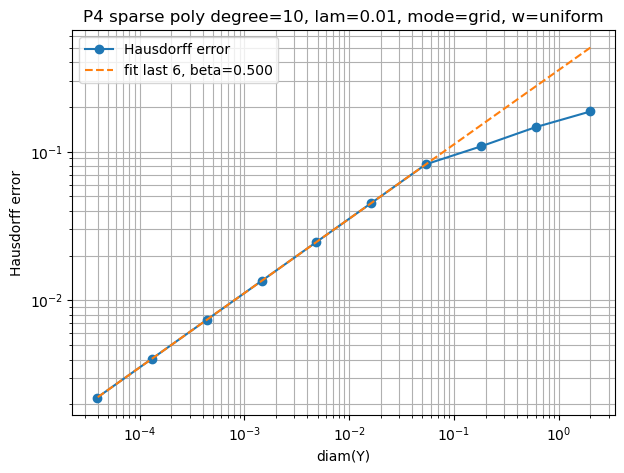

Estimated beta = 0.5


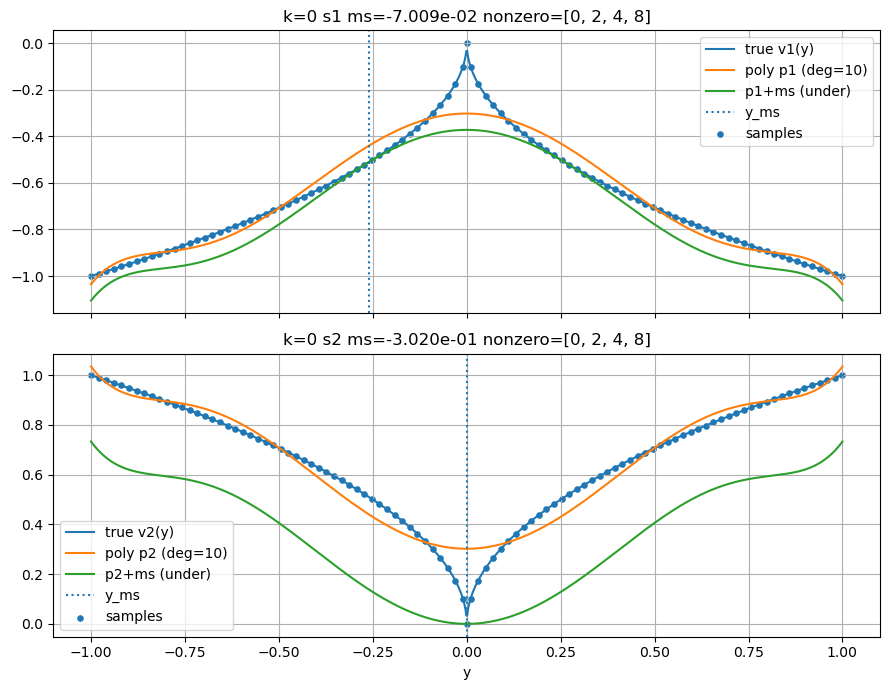

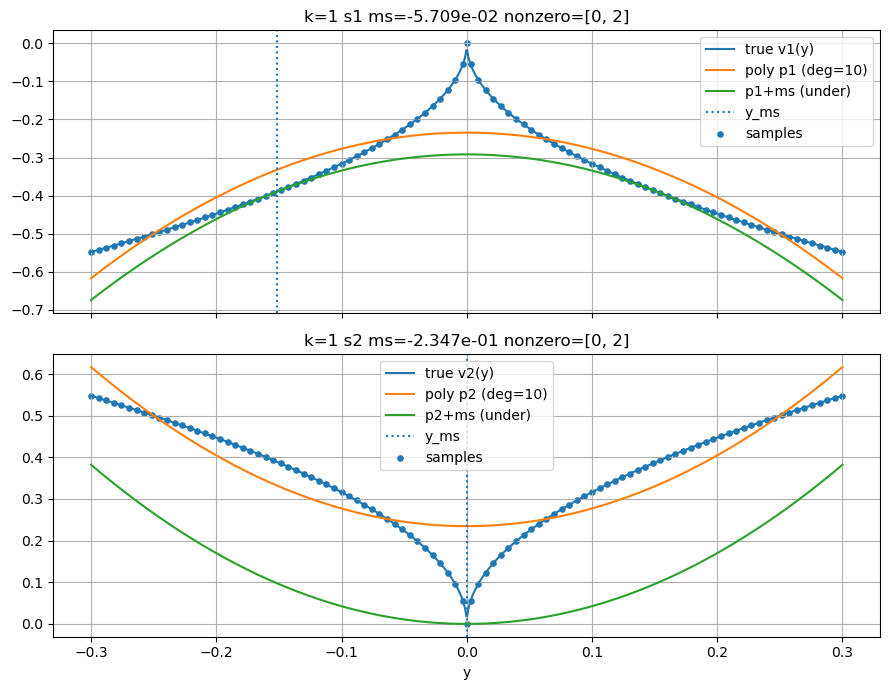

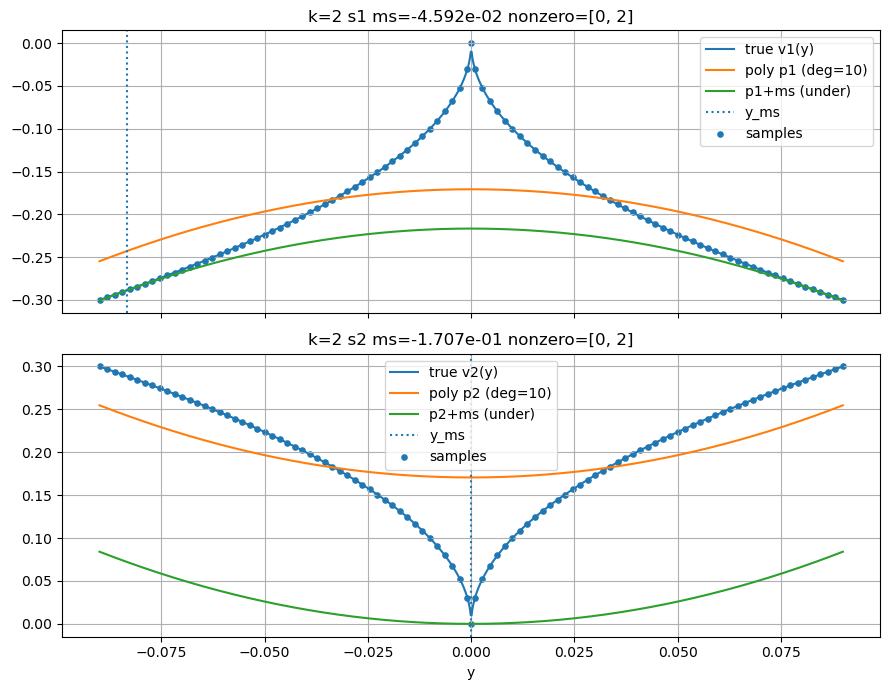

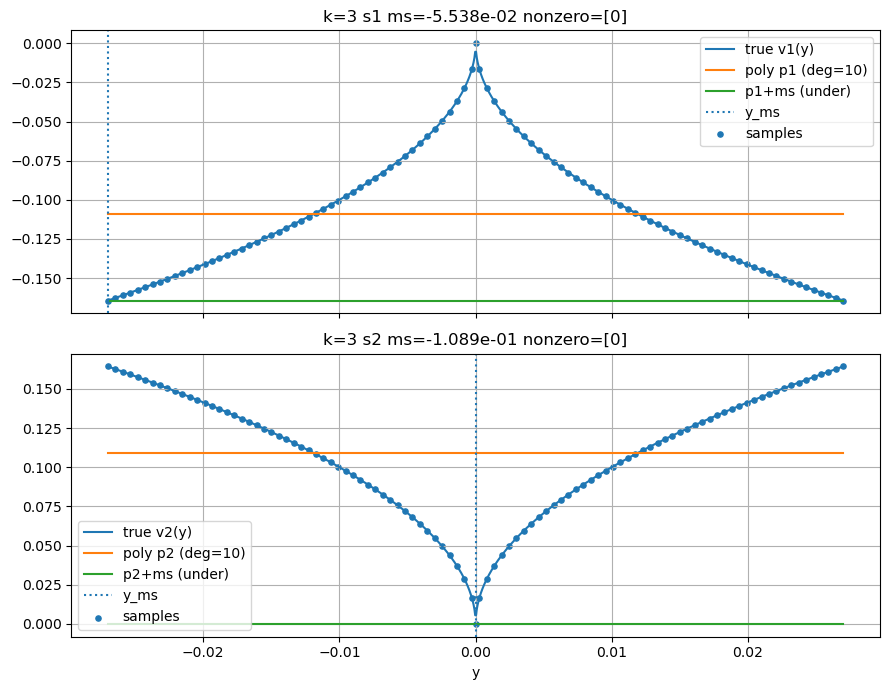

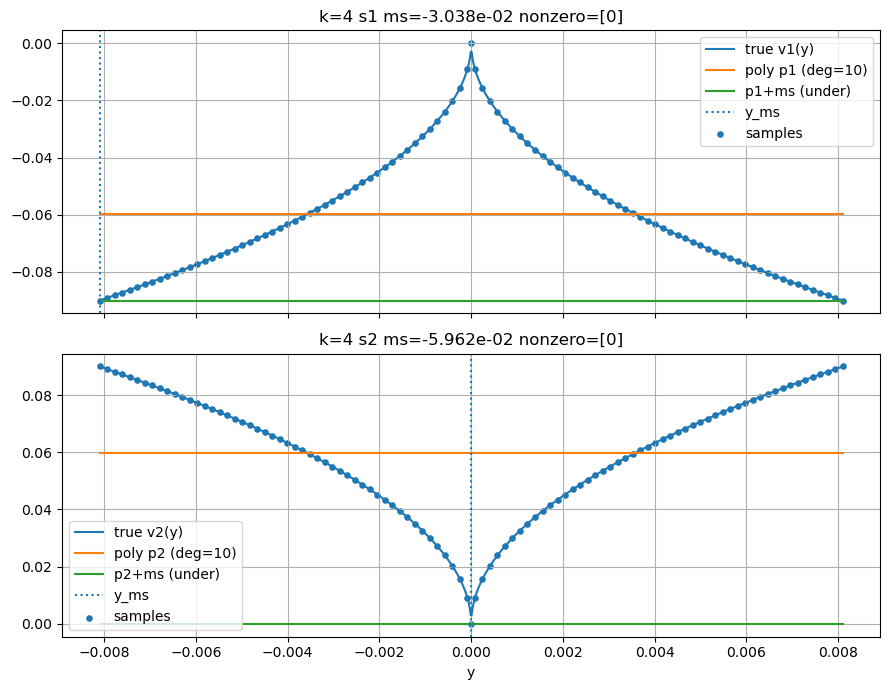

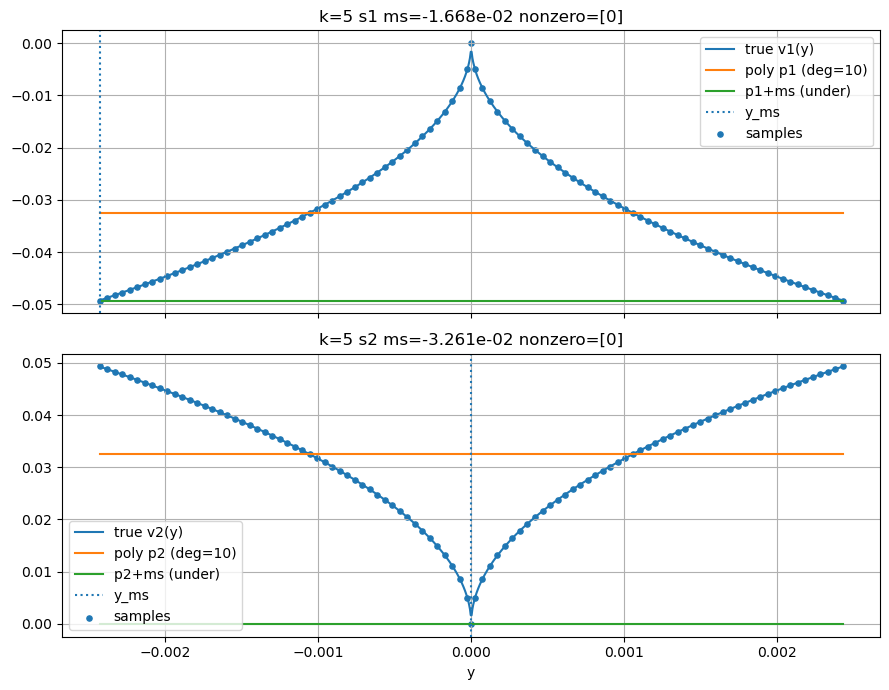

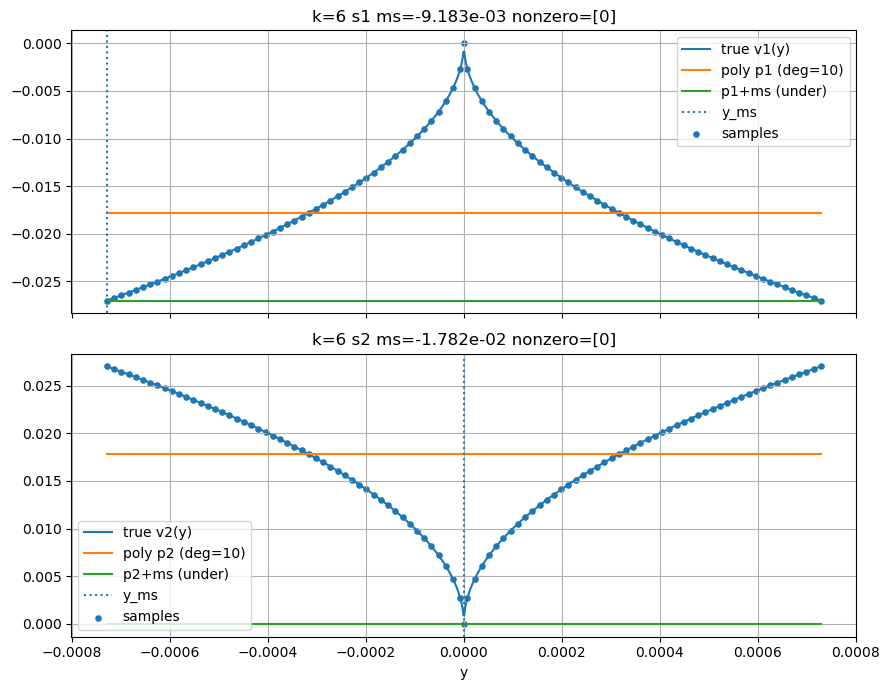

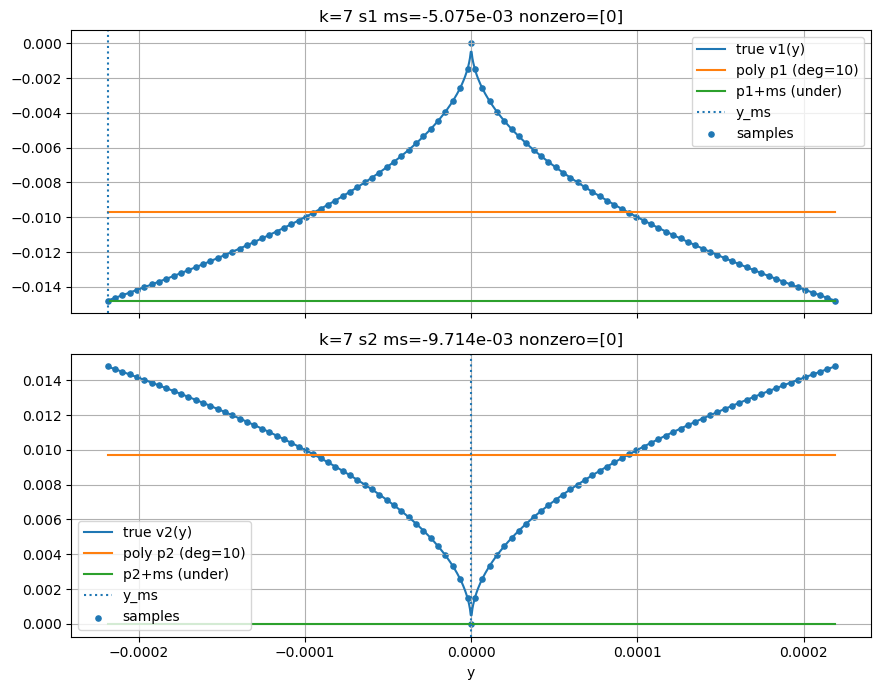

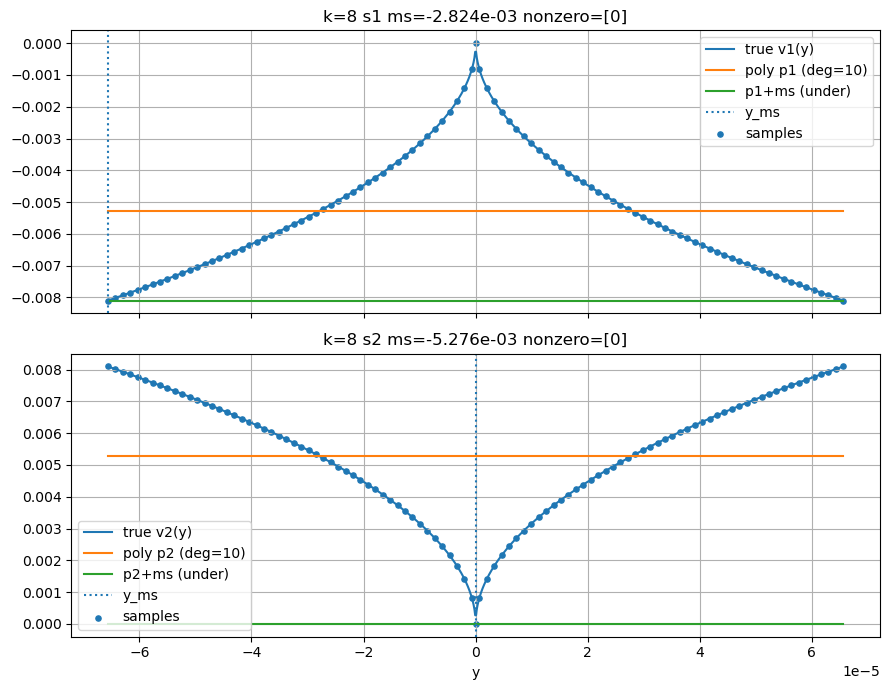

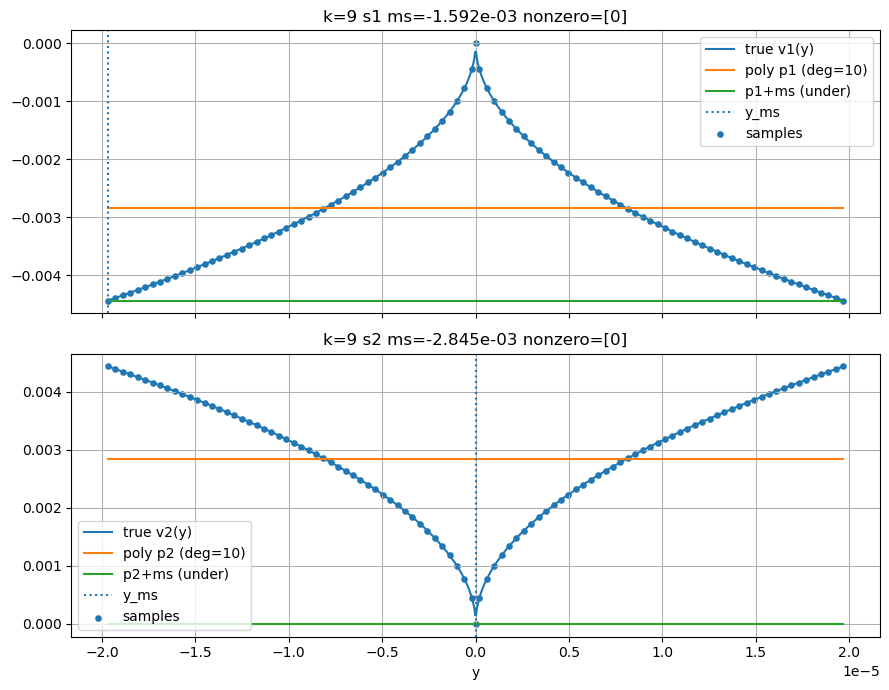

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from dataclasses import dataclass
from typing import Callable, Tuple, Dict
from scipy.optimize import minimize_scalar

# ============================================================
# USER KNOBS
# ============================================================
DEGREE = 10          # try 4, 8, 10
LAM = 1e-2         # L1 strength (larger -> sparser)
SAMPLE_MODE = "grid"   # "grid" or "random"
WEIGHT_MODE = "uniform"  # "uniform" or "low_value_focus"
LOW_VALUE_ALPHA = 5.0
N_SAMPLES = 100
N_LEVELS = 10
EPS0 = 1.0
RHO = 0.3
SEED = 1

# ============================================================
# P4 scenarios
# ============================================================
def v1(y: float) -> float:
    return -np.sqrt(abs(y))

def v2(y: float) -> float:
    return +np.sqrt(abs(y))

P1 = 0.5
P2 = 0.5
YSTAR = 0.0  # split at 0 for nonsmoothness

# ============================================================
# Polynomial features: [y^0, y^1, ..., y^DEGREE]
# ============================================================
def poly_features(y: np.ndarray, degree: int) -> np.ndarray:
    y = np.asarray(y, dtype=float).ravel()
    return np.vstack([y**k for k in range(degree + 1)]).T  # (n, degree+1)

# ============================================================
# LASSO via coordinate descent
# Solve: min_b 0.5||Xb - f||^2 + lam ||b||_1
# ============================================================
def soft_threshold(z: float, gamma: float) -> float:
    if z >  gamma: return z - gamma
    if z < -gamma: return z + gamma
    return 0.0

def lasso_cd(X: np.ndarray, f: np.ndarray, lam: float,
             max_iter: int = 10000, tol: float = 1e-10) -> np.ndarray:
    n, p = X.shape
    b = np.zeros(p, dtype=float)

    col_norm2 = np.sum(X*X, axis=0)
    r = f - X @ b

    for _ in range(max_iter):
        b_old = b.copy()
        for j in range(p):
            if col_norm2[j] <= 1e-18:
                b[j] = 0.0
                continue

            r = r + X[:, j] * b[j]
            rho = float(X[:, j].T @ r)
            b[j] = soft_threshold(rho, lam) / col_norm2[j]
            r = r - X[:, j] * b[j]

        if np.max(np.abs(b - b_old)) < tol:
            break
    return b

def fit_sparse_poly_lasso(ys: np.ndarray, fs: np.ndarray, w: np.ndarray, lam: float, degree: int) -> np.ndarray:
    ys = np.asarray(ys, dtype=float).ravel()
    fs = np.asarray(fs, dtype=float).ravel()
    w  = np.asarray(w,  dtype=float).ravel()
    assert ys.shape == fs.shape == w.shape

    X = poly_features(ys, degree)
    sw = np.sqrt(np.clip(w, 0.0, np.inf))
    Xw = X * sw[:, None]
    fw = fs * sw

    beta = lasso_cd(Xw, fw, lam=lam, max_iter=12000, tol=1e-10)
    return beta

# ============================================================
# ms shift (bounded + safety grid), split at 0
# ms = - max_{y in Y} (p(y) - v(y))
# ============================================================
def exact_shift_to_underestimator_poly(
    v: Callable[[float], float],
    beta: np.ndarray,
    Y: Tuple[float,float],
    degree: int,
    split: float = 0.0,
    safety_grid: int = 10000,
    safety_tol: float = 1e-12,
) -> Tuple[float,float]:
    lo, hi = Y
    assert lo <= split <= hi

    def p_scalar(y: float) -> float:
        yy = np.array([float(y)], dtype=float)
        return float(poly_features(yy, degree) @ beta)

    def h(y: float) -> float:
        return p_scalar(y) - v(y)

    cand = [lo, split, hi]
    best_val = -np.inf
    best_y = split
    for y in cand:
        val = h(y)
        if val > best_val:
            best_val = float(val)
            best_y = float(y)

    for (L, U) in [(lo, split), (split, hi)]:
        if U - L <= 0:
            continue
        res = minimize_scalar(lambda t: -h(t), bounds=(L, U), method="bounded")
        if res.success:
            val = h(res.x)
            if val > best_val:
                best_val = float(val)
                best_y = float(res.x)

    ms = -best_val
    y_ms = best_y

    # safety correction
    ys = np.linspace(lo, hi, safety_grid)
    vv = np.array([v(float(t)) for t in ys])
    pp = poly_features(ys, degree) @ beta
    viol = float(np.max((pp + ms) - vv))
    if viol > safety_tol:
        ms -= (viol + safety_tol)

    hs = pp - vv
    y_ms = float(ys[int(np.argmax(hs))])

    return float(ms), float(y_ms)

# ============================================================
# Model + diagnostics
# ============================================================
@dataclass
class PolyModel:
    beta: np.ndarray
    degree: int
    ms: float
    y_ms: float
    def p(self, y):
        y = np.asarray(y, dtype=float)
        return poly_features(y, self.degree) @ self.beta
    def under(self, y):
        return self.p(y) + self.ms

@dataclass
class FitDiag:
    ys: np.ndarray
    fs: np.ndarray
    w: np.ndarray

# ============================================================
# Sampling + weights
# ============================================================
def sample_points(Y: Tuple[float,float], n_samples: int, rng: np.random.Generator, mode: str) -> np.ndarray:
    lo, hi = Y
    if mode == "grid":
        ys = np.linspace(lo, hi, n_samples)
    elif mode == "random":
        ys = rng.uniform(lo, hi, size=n_samples)
    else:
        raise ValueError("SAMPLE_MODE must be 'grid' or 'random'")
    ys = np.unique(np.concatenate([ys, np.array([lo, 0.0, hi])]))
    return ys

def make_weights(fs: np.ndarray, weight_mode: str, low_value_alpha: float) -> np.ndarray:
    if weight_mode == "uniform":
        return np.ones_like(fs)
    if weight_mode == "low_value_focus":
        fmin = float(np.min(fs))
        return np.exp(-low_value_alpha*(fs - fmin))
    raise ValueError("WEIGHT_MODE must be 'uniform' or 'low_value_focus'")

# ============================================================
# Build sparse polynomial underestimator (one scenario)
# ============================================================
def build_sparse_poly_underestimator(
    v: Callable[[float], float],
    Y: Tuple[float,float],
    degree: int,
    lam: float,
    n_samples: int,
    rng: np.random.Generator,
    sample_mode: str,
    weight_mode: str,
    low_value_alpha: float,
) -> Tuple[PolyModel, FitDiag]:
    ys = sample_points(Y, n_samples, rng, mode=sample_mode)
    fs = np.array([v(float(t)) for t in ys])
    w  = make_weights(fs, weight_mode, low_value_alpha)

    beta = fit_sparse_poly_lasso(ys, fs, w, lam=lam, degree=degree)
    ms, y_ms = exact_shift_to_underestimator_poly(v, beta, Y, degree=degree, split=0.0)

    model = PolyModel(beta=beta, degree=degree, ms=ms, y_ms=y_ms)
    diag  = FitDiag(ys=ys, fs=fs, w=w)
    return model, diag

# ============================================================
# Hausdorff error on Y (P4 true min = 0)
# Use dense grid min for relaxation (since polynomial may be nonconvex).
# ============================================================
def hausdorff_error_for_interval_grid(Y: Tuple[float,float], m1: PolyModel, m2: PolyModel, n_grid: int = 20001):
    lo, hi = Y
    ys = np.linspace(lo, hi, n_grid)
    relax = P1*m1.under(ys) + P2*m2.under(ys)
    lb = float(np.min(relax))
    err = -lb
    y_argmin = float(ys[int(np.argmin(relax))])
    return lb, err, y_argmin

# ============================================================
# Experiment + plotting
# ============================================================
def estimate_slope_loglog(x, y):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    mask = (x > 0) & (y > 0)
    x = x[mask]; y = y[mask]
    beta, _ = np.polyfit(np.log(x), np.log(y), 1)
    return float(beta)

def run_experiment():
    rng = np.random.default_rng(SEED)
    diam_list, err_list, lb_list = [], [], []
    rounds = []

    for k in range(N_LEVELS):
        eps = EPS0*(RHO**k)
        Y = (-eps, eps)

        m1, d1 = build_sparse_poly_underestimator(
            v1, Y, degree=DEGREE, lam=LAM, n_samples=N_SAMPLES, rng=rng,
            sample_mode=SAMPLE_MODE, weight_mode=WEIGHT_MODE, low_value_alpha=LOW_VALUE_ALPHA
        )
        m2, d2 = build_sparse_poly_underestimator(
            v2, Y, degree=DEGREE, lam=LAM, n_samples=N_SAMPLES, rng=rng,
            sample_mode=SAMPLE_MODE, weight_mode=WEIGHT_MODE, low_value_alpha=LOW_VALUE_ALPHA
        )

        lb, err, y_argmin = hausdorff_error_for_interval_grid(Y, m1, m2)

        diam_list.append(2*eps)
        err_list.append(err)
        lb_list.append(lb)

        rounds.append(dict(k=k, Y=Y, m1=m1, m2=m2, d1=d1, d2=d2, lb=lb, err=err, y_argmin=y_argmin))

    return dict(diam=np.array(diam_list), err=np.array(err_list), lb=np.array(lb_list), rounds=rounds)

def plot_convergence(out, slope_fit_last=6):
    diam = out["diam"]
    err = out["err"]
    mask = (diam > 0) & (err > 0)
    d2 = diam[mask]; e2 = err[mask]
    K = min(slope_fit_last, len(d2))
    beta = estimate_slope_loglog(d2[-K:], e2[-K:])

    lx = np.log(d2[-K:])
    ly = np.log(e2[-K:])
    c = float(np.mean(ly - beta*lx))
    fit = np.exp(beta*np.log(d2) + c)

    plt.figure(figsize=(7,5))
    plt.loglog(d2, e2, marker="o", linestyle="-", label="Hausdorff error")
    plt.loglog(d2, fit, linestyle="--", label=f"fit last {K}, beta={beta:.3f}")
    plt.title(f"P4 sparse poly degree={DEGREE}, lam={LAM}, mode={SAMPLE_MODE}, w={WEIGHT_MODE}")
    plt.xlabel("diam(Y)")
    plt.ylabel("Hausdorff error")
    plt.grid(True, which="both")
    plt.legend()
    plt.show()
    return beta

def nonzero_indices(beta, thr=1e-8):
    return np.where(np.abs(beta) > thr)[0].tolist()

def plot_round(round_info, n_grid=900):
    k = round_info["k"]
    lo, hi = round_info["Y"]
    m1, m2 = round_info["m1"], round_info["m2"]
    d1, d2 = round_info["d1"], round_info["d2"]

    ys = np.linspace(lo, hi, n_grid)

    fig, axes = plt.subplots(2,1,sharex=True,figsize=(9,7))

    ax = axes[0]
    ax.plot(ys, [v1(float(t)) for t in ys], label="true v1(y)")
    ax.plot(ys, m1.p(ys), label=f"poly p1 (deg={DEGREE})")
    ax.plot(ys, m1.under(ys), label="p1+ms (under)")
    ax.axvline(m1.y_ms, linestyle=":", label="y_ms")
    ax.scatter(d1.ys, d1.fs, s=14, label="samples")
    ax.set_title(f"k={k} s1 ms={m1.ms:.3e} nonzero={nonzero_indices(m1.beta)}")
    ax.grid(True); ax.legend()

    ax = axes[1]
    ax.plot(ys, [v2(float(t)) for t in ys], label="true v2(y)")
    ax.plot(ys, m2.p(ys), label=f"poly p2 (deg={DEGREE})")
    ax.plot(ys, m2.under(ys), label="p2+ms (under)")
    ax.axvline(m2.y_ms, linestyle=":", label="y_ms")
    ax.scatter(d2.ys, d2.fs, s=14, label="samples")
    ax.set_title(f"k={k} s2 ms={m2.ms:.3e} nonzero={nonzero_indices(m2.beta)}")
    ax.grid(True); ax.legend()

    axes[1].set_xlabel("y")
    fig.tight_layout()
    plt.show()

# ============================================================
# RUN
# ============================================================
out = run_experiment()
beta = plot_convergence(out, slope_fit_last=6)
print("Estimated beta =", beta)

for r in out["rounds"]:
    plot_round(r, n_grid=900)


C:\Users\Administrator\AppData\Local\Temp\ipykernel_265664\528845406.py:197: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return float(poly_features(yy, degree) @ beta)


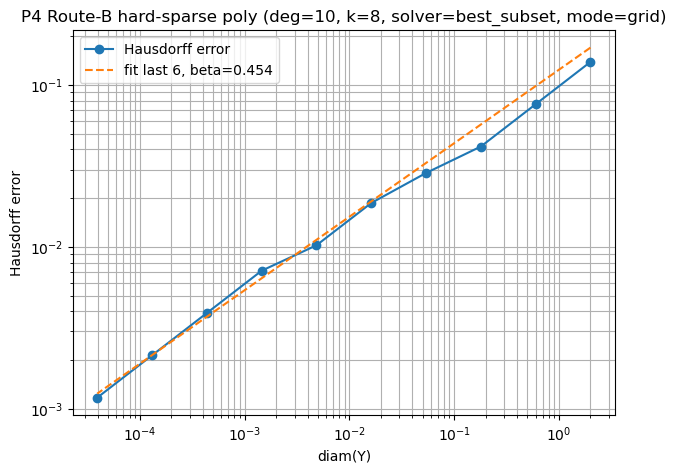

Estimated beta = 0.45434502556516665


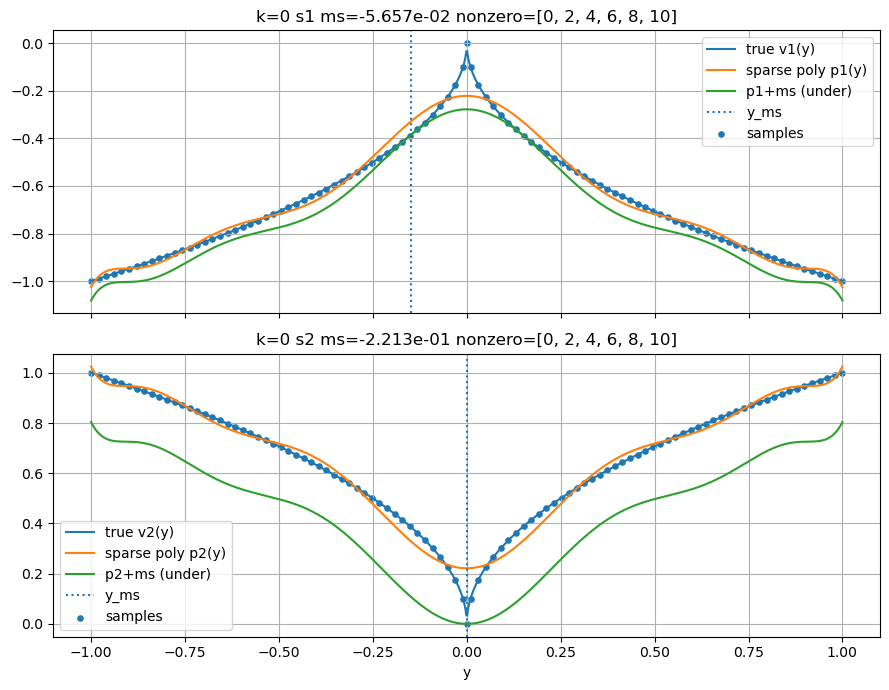

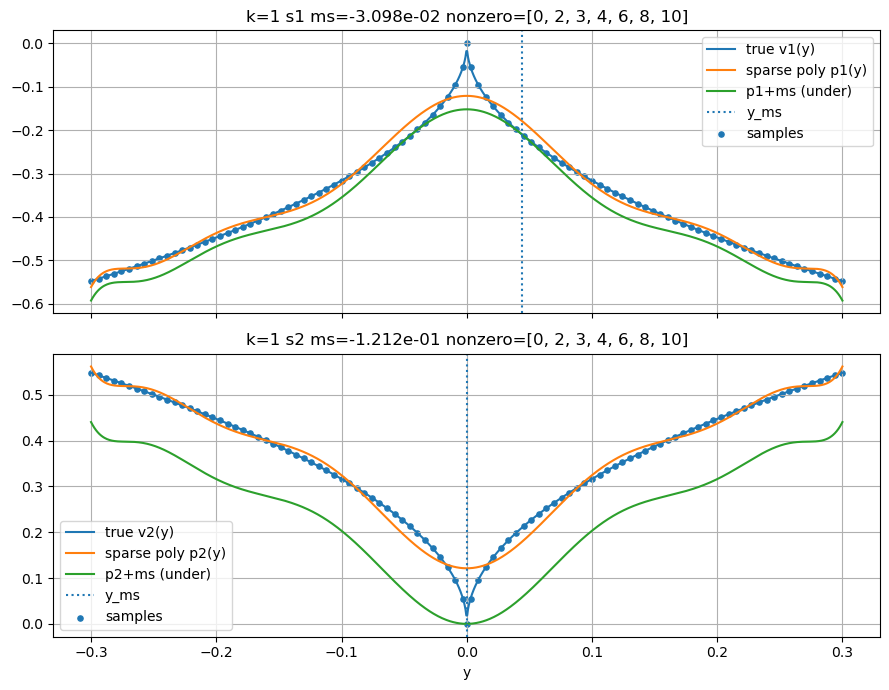

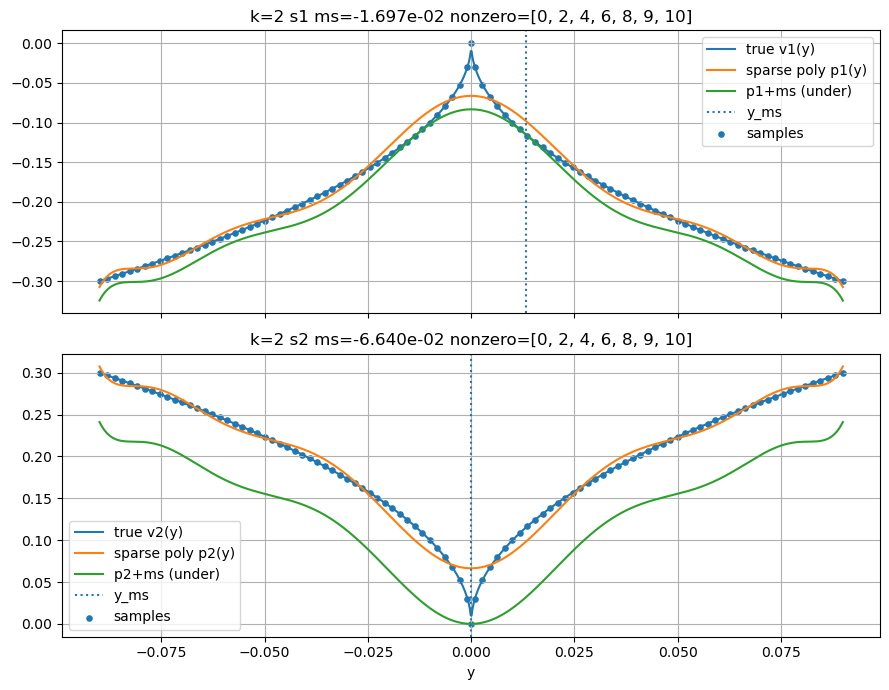

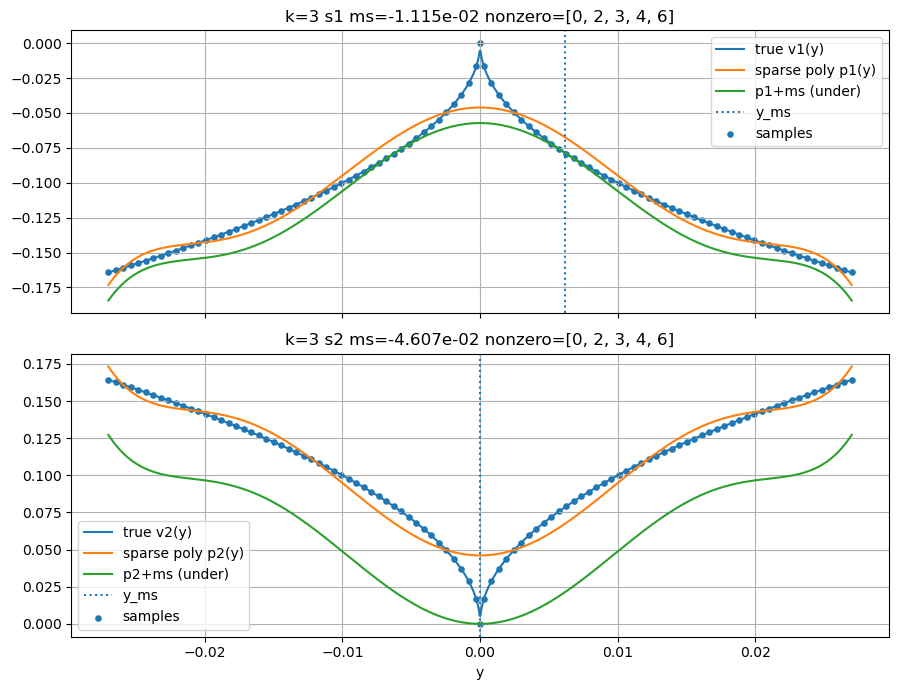

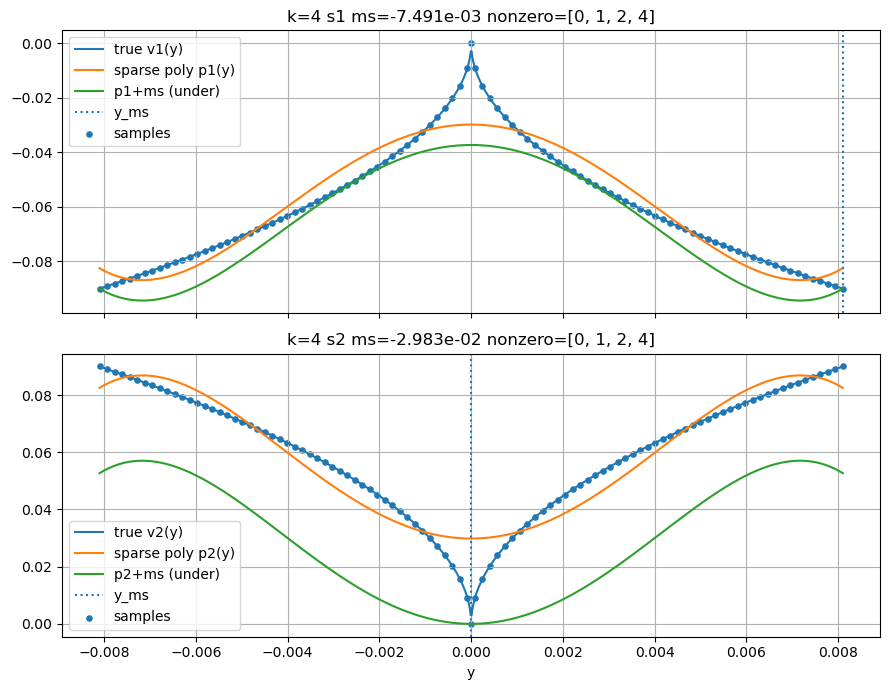

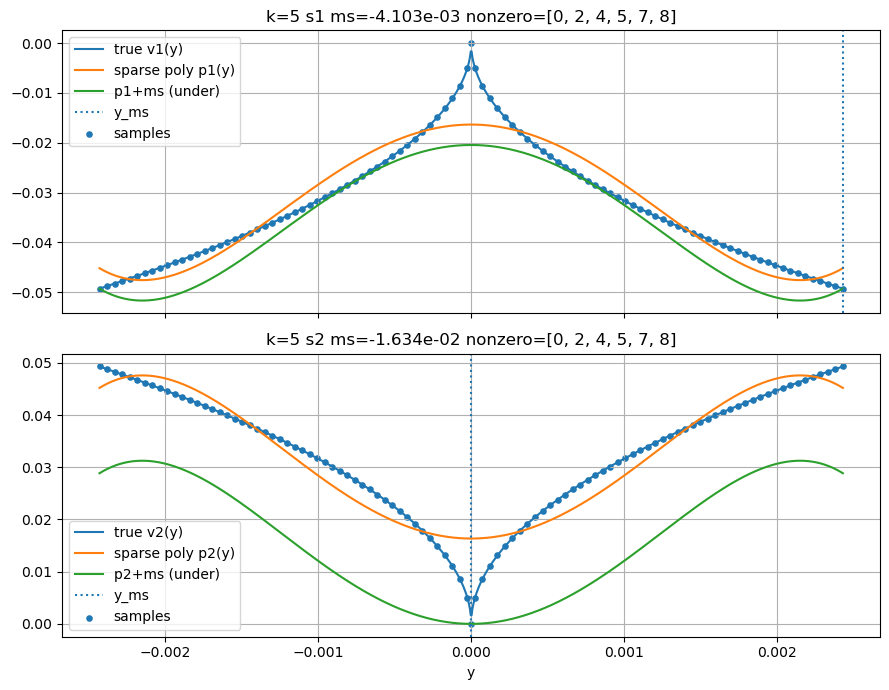

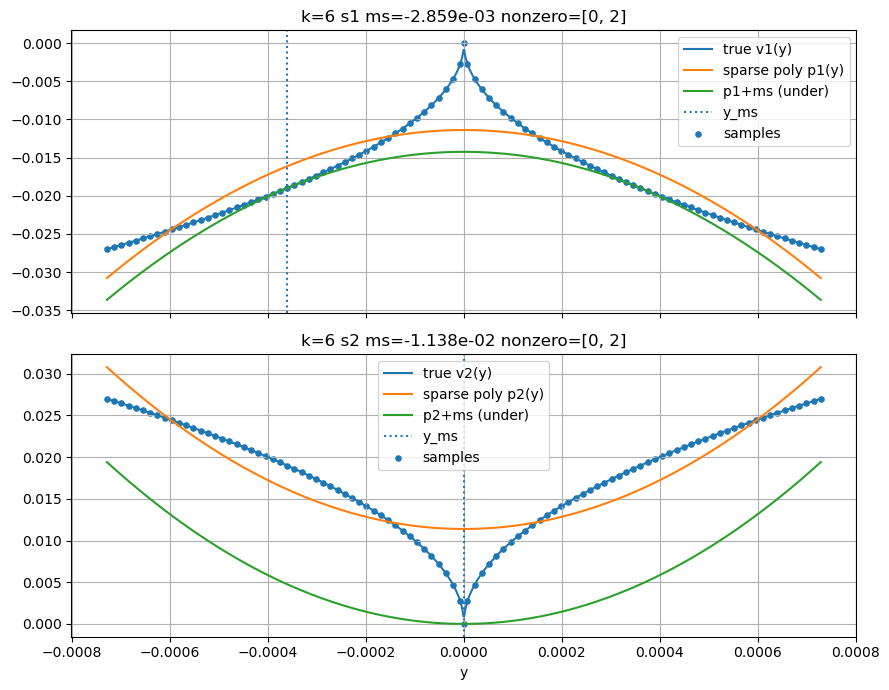

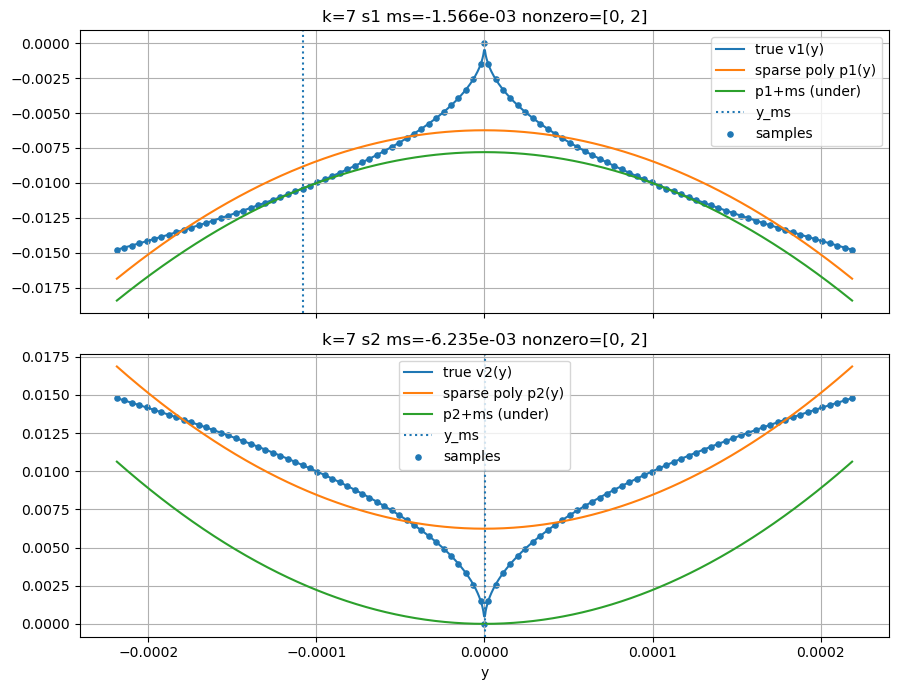

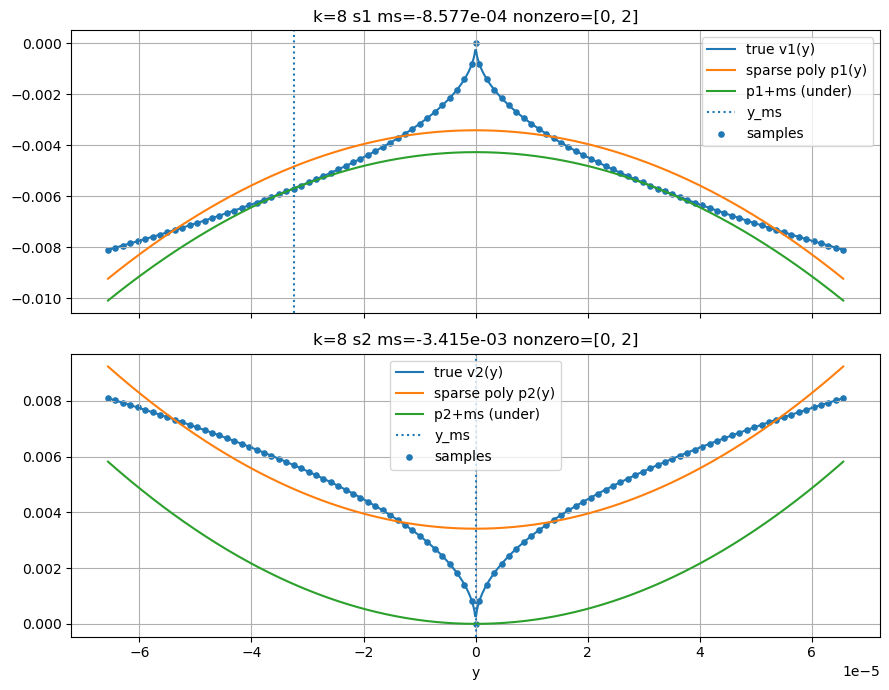

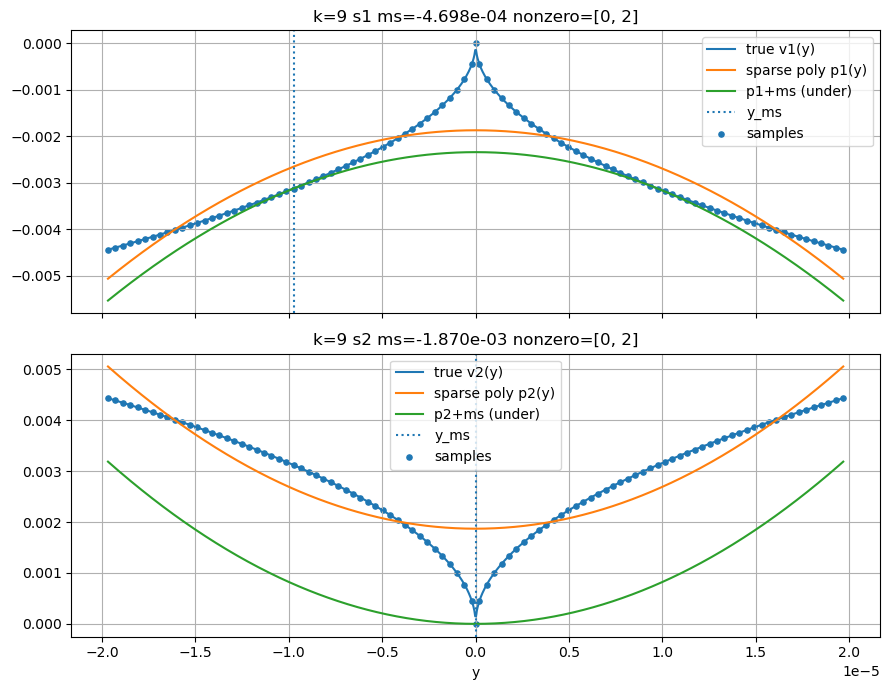

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from dataclasses import dataclass
from typing import Callable, Tuple, Dict, List
from itertools import combinations
from scipy.optimize import minimize_scalar

# ============================================================
# USER KNOBS (Route B)
# ============================================================
DEGREE = 10                 # try 4, 8, 10...
K_NONZERO = 8               # at most k nonzero coefficients
FORCE_INTERCEPT = True      # force term y^0 included
SPARSE_SOLVER = "best_subset"  # "best_subset" or "omp"
SAMPLE_MODE = "grid"        # "grid" or "random"
WEIGHT_MODE = "uniform"     # "uniform" or "low_value_focus"
LOW_VALUE_ALPHA = 5.0

N_SAMPLES = 100
N_LEVELS = 10
EPS0 = 1.0
RHO = 0.3
SEED = 1

# ============================================================
# P4 scenarios
# ============================================================
def v1(y: float) -> float:
    return -np.sqrt(abs(y))

def v2(y: float) -> float:
    return +np.sqrt(abs(y))

P1 = 0.5
P2 = 0.5
SPLIT = 0.0  # P4 nonsmooth at 0

# ============================================================
# Basis features: [y^0, y^1, ..., y^DEGREE]
# ============================================================
def poly_features(y: np.ndarray, degree: int) -> np.ndarray:
    y = np.asarray(y, dtype=float).ravel()
    return np.vstack([y**k for k in range(degree + 1)]).T  # (n, degree+1)

# ============================================================
# Sampling + weights
# ============================================================
def sample_points(Y: Tuple[float,float], n_samples: int, rng: np.random.Generator, mode: str) -> np.ndarray:
    lo, hi = Y
    if mode == "grid":
        ys = np.linspace(lo, hi, n_samples)
    elif mode == "random":
        ys = rng.uniform(lo, hi, size=n_samples)
    else:
        raise ValueError("SAMPLE_MODE must be 'grid' or 'random'")
    ys = np.unique(np.concatenate([ys, np.array([lo, 0.0, hi])]))
    ys.sort()
    return ys

def make_weights(fs: np.ndarray, mode: str, low_value_alpha: float) -> np.ndarray:
    fs = np.asarray(fs, dtype=float)
    if mode == "uniform":
        return np.ones_like(fs)
    if mode == "low_value_focus":
        fmin = float(np.min(fs))
        return np.exp(-low_value_alpha*(fs - fmin))
    raise ValueError("WEIGHT_MODE must be 'uniform' or 'low_value_focus'")

# ============================================================
# Weighted least squares on a chosen subset of columns
# Solve: min || sqrt(W)(X_S b - f) ||^2
# ============================================================
def weighted_ls_subset(X: np.ndarray, f: np.ndarray, w: np.ndarray, cols: List[int]) -> Tuple[np.ndarray, float]:
    """
    Return (beta_full, SSE_weighted) where beta_full has zeros outside cols.
    """
    X = np.asarray(X, dtype=float)
    f = np.asarray(f, dtype=float).ravel()
    w = np.asarray(w, dtype=float).ravel()
    assert X.shape[0] == f.shape[0] == w.shape[0]

    cols = list(cols)
    XS = X[:, cols]
    sw = np.sqrt(np.clip(w, 0.0, np.inf))
    XSw = XS * sw[:, None]
    fw = f * sw

    # LS
    bS, *_ = np.linalg.lstsq(XSw, fw, rcond=None)

    # SSE (weighted)
    resid = (XS @ bS) - f
    sse = float(np.sum(w * resid * resid))

    beta = np.zeros(X.shape[1], dtype=float)
    beta[cols] = bS
    return beta, sse

# ============================================================
# Route B Solver 1: best subset (enumeration) for hard sparsity
# ============================================================
def best_subset_fit(X: np.ndarray, f: np.ndarray, w: np.ndarray,
                    k_nonzero: int, force_intercept: bool) -> Tuple[np.ndarray, float, List[int]]:
    p = X.shape[1]
    all_idx = list(range(p))

    if force_intercept:
        base = [0]
        cand = all_idx[1:]
        k_free = max(k_nonzero - 1, 0)
    else:
        base = []
        cand = all_idx
        k_free = k_nonzero

    best_beta = None
    best_sse = np.inf
    best_cols = None

    # allow <=k_nonzero (not exactly)
    for k in range(0, k_free + 1):
        for subset in combinations(cand, k):
            cols = base + list(subset)
            if len(cols) == 0:
                # degenerate: beta=0
                beta = np.zeros(p)
                resid = -f
                sse = float(np.sum(w * resid * resid))
            else:
                beta, sse = weighted_ls_subset(X, f, w, cols)
            if sse < best_sse:
                best_sse = sse
                best_beta = beta
                best_cols = cols

    return best_beta, best_sse, best_cols

# ============================================================
# Route B Solver 2: OMP (greedy) for hard sparsity
# ============================================================
def omp_fit(X: np.ndarray, f: np.ndarray, w: np.ndarray,
            k_nonzero: int, force_intercept: bool) -> Tuple[np.ndarray, float, List[int]]:
    """
    Simple weighted OMP:
      Start with intercept if forced, then greedily add columns by max correlation with residual.
    """
    n, p = X.shape
    sw = np.sqrt(np.clip(w, 0.0, np.inf))
    Xw = X * sw[:, None]
    fw = f * sw

    selected = []
    if force_intercept:
        selected = [0]

    # initial residual
    if selected:
        beta, _ = weighted_ls_subset(X, f, w, selected)
        r = (X @ beta) - f
    else:
        r = -f

    while len(selected) < k_nonzero:
        # correlations in weighted space
        rw = r * sw
        corrs = Xw.T @ rw  # (p,)
        corrs[selected] = 0.0
        j = int(np.argmax(np.abs(corrs)))
        selected.append(j)

        beta, _ = weighted_ls_subset(X, f, w, selected)
        r = (X @ beta) - f

    # final SSE
    resid = (X @ beta) - f
    sse = float(np.sum(w * resid * resid))
    return beta, sse, selected

# ============================================================
# ms shift (bounded on two halves + safety grid), for general polynomial
# ms = min_{y in Y} (v(y) - p(y))  => p+ms <= v
# ============================================================
def exact_shift_to_underestimator_poly(
    v: Callable[[float], float],
    beta: np.ndarray,
    Y: Tuple[float,float],
    degree: int,
    split: float = 0.0,
    safety_grid: int = 10000,
    safety_tol: float = 1e-12,
) -> Tuple[float,float]:
    lo, hi = Y
    assert lo <= split <= hi

    def p_scalar(y: float) -> float:
        yy = np.array([float(y)], dtype=float)
        return float(poly_features(yy, degree) @ beta)

    def h(y: float) -> float:
        return p_scalar(y) - v(y)  # maximize

    cand = [lo, split, hi]
    best_val = -np.inf
    best_y = split
    for y in cand:
        val = h(y)
        if val > best_val:
            best_val = float(val)
            best_y = float(y)

    for (L, U) in [(lo, split), (split, hi)]:
        if U - L <= 0:
            continue
        res = minimize_scalar(lambda t: -h(t), bounds=(L, U), method="bounded")
        if res.success:
            val = h(res.x)
            if val > best_val:
                best_val = float(val)
                best_y = float(res.x)

    ms = -best_val
    y_ms = best_y

    # safety correction on dense grid
    ys = np.linspace(lo, hi, safety_grid)
    vv = np.array([v(float(t)) for t in ys])
    pp = poly_features(ys, degree) @ beta
    viol = float(np.max((pp + ms) - vv))
    if viol > safety_tol:
        ms -= (viol + safety_tol)

    hs = pp - vv
    y_ms = float(ys[int(np.argmax(hs))])

    return float(ms), float(y_ms)

# ============================================================
# Model + diagnostics
# ============================================================
@dataclass
class SparsePolyModel:
    beta: np.ndarray
    degree: int
    ms: float
    y_ms: float
    cols: List[int]
    sse: float

    def p(self, y):
        y = np.asarray(y, dtype=float)
        return poly_features(y, self.degree) @ self.beta

    def under(self, y):
        return self.p(y) + self.ms

@dataclass
class FitDiag:
    ys: np.ndarray
    fs: np.ndarray
    w: np.ndarray

def nonzero_indices(beta, thr=1e-10):
    return np.where(np.abs(beta) > thr)[0].tolist()

# ============================================================
# Build hard-sparse polynomial underestimator for one scenario
# ============================================================
def build_sparse_poly_underestimator(
    v: Callable[[float], float],
    Y: Tuple[float,float],
    degree: int,
    k_nonzero: int,
    force_intercept: bool,
    sparse_solver: str,
    n_samples: int,
    rng: np.random.Generator,
    sample_mode: str,
    weight_mode: str,
    low_value_alpha: float,
) -> Tuple[SparsePolyModel, FitDiag]:
    ys = sample_points(Y, n_samples, rng, mode=sample_mode)
    fs = np.array([v(float(t)) for t in ys], dtype=float)
    w = make_weights(fs, mode=weight_mode, low_value_alpha=low_value_alpha)

    X = poly_features(ys, degree)

    if sparse_solver == "best_subset":
        beta, sse, cols = best_subset_fit(X, fs, w, k_nonzero=k_nonzero, force_intercept=force_intercept)
    elif sparse_solver == "omp":
        beta, sse, cols = omp_fit(X, fs, w, k_nonzero=k_nonzero, force_intercept=force_intercept)
    else:
        raise ValueError("SPARSE_SOLVER must be 'best_subset' or 'omp'")

    ms, y_ms = exact_shift_to_underestimator_poly(v, beta, Y, degree=degree, split=SPLIT)

    model = SparsePolyModel(beta=beta, degree=degree, ms=ms, y_ms=y_ms, cols=cols, sse=sse)
    diag = FitDiag(ys=ys, fs=fs, w=w)
    return model, diag

# ============================================================
# Hausdorff error on Y for P4:
# true total f(y)=0, so err = -min(relax)
# We use dense grid min since polynomial can be nonconvex.
# ============================================================
def hausdorff_error_for_interval_grid(Y: Tuple[float,float],
                                      m1: SparsePolyModel,
                                      m2: SparsePolyModel,
                                      n_grid: int = 20001) -> Tuple[float,float,float]:
    lo, hi = Y
    ys = np.linspace(lo, hi, n_grid)
    relax = P1*m1.under(ys) + P2*m2.under(ys)
    j = int(np.argmin(relax))
    lb = float(relax[j])
    err = -lb
    return lb, err, float(ys[j])

# ============================================================
# Experiment + plotting
# ============================================================
def estimate_slope_loglog(x, y):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    mask = (x > 0) & (y > 0)
    x = x[mask]; y = y[mask]
    beta, _ = np.polyfit(np.log(x), np.log(y), 1)
    return float(beta)

def run_experiment():
    rng = np.random.default_rng(SEED)
    diam_list, err_list, lb_list = [], [], []
    rounds = []

    for k in range(N_LEVELS):
        eps = EPS0*(RHO**k)
        Y = (-eps, eps)

        m1, d1 = build_sparse_poly_underestimator(
            v1, Y,
            degree=DEGREE, k_nonzero=K_NONZERO, force_intercept=FORCE_INTERCEPT,
            sparse_solver=SPARSE_SOLVER,
            n_samples=N_SAMPLES, rng=rng,
            sample_mode=SAMPLE_MODE, weight_mode=WEIGHT_MODE, low_value_alpha=LOW_VALUE_ALPHA
        )
        m2, d2 = build_sparse_poly_underestimator(
            v2, Y,
            degree=DEGREE, k_nonzero=K_NONZERO, force_intercept=FORCE_INTERCEPT,
            sparse_solver=SPARSE_SOLVER,
            n_samples=N_SAMPLES, rng=rng,
            sample_mode=SAMPLE_MODE, weight_mode=WEIGHT_MODE, low_value_alpha=LOW_VALUE_ALPHA
        )

        lb, err, y_argmin = hausdorff_error_for_interval_grid(Y, m1, m2)

        diam_list.append(2*eps)
        err_list.append(err)
        lb_list.append(lb)

        rounds.append(dict(k=k, Y=Y, m1=m1, m2=m2, d1=d1, d2=d2, lb=lb, err=err, y_argmin=y_argmin))

    return dict(diam=np.array(diam_list), err=np.array(err_list), lb=np.array(lb_list), rounds=rounds)

def plot_convergence(out, slope_fit_last=6):
    diam = out["diam"]
    err  = out["err"]
    mask = (diam > 0) & (err > 0)
    d2 = diam[mask]; e2 = err[mask]
    K = min(slope_fit_last, len(d2))
    beta = estimate_slope_loglog(d2[-K:], e2[-K:])

    lx = np.log(d2[-K:])
    ly = np.log(e2[-K:])
    c = float(np.mean(ly - beta*lx))
    fit = np.exp(beta*np.log(d2) + c)

    plt.figure(figsize=(7,5))
    plt.loglog(d2, e2, marker="o", linestyle="-", label="Hausdorff error")
    plt.loglog(d2, fit, linestyle="--", label=f"fit last {K}, beta={beta:.3f}")
    plt.title(f"P4 Route-B hard-sparse poly (deg={DEGREE}, k={K_NONZERO}, solver={SPARSE_SOLVER}, mode={SAMPLE_MODE})")
    plt.xlabel("diam(Y)")
    plt.ylabel("Hausdorff error")
    plt.grid(True, which="both")
    plt.legend()
    plt.show()
    return beta

def plot_round(r, n_grid=900):
    k = r["k"]
    lo, hi = r["Y"]
    m1, m2 = r["m1"], r["m2"]
    d1, d2 = r["d1"], r["d2"]
    ys = np.linspace(lo, hi, n_grid)

    fig, axes = plt.subplots(2,1,sharex=True,figsize=(9,7))

    ax = axes[0]
    ax.plot(ys, [v1(float(t)) for t in ys], label="true v1(y)")
    ax.plot(ys, m1.p(ys), label="sparse poly p1(y)")
    ax.plot(ys, m1.under(ys), label="p1+ms (under)")
    ax.axvline(m1.y_ms, linestyle=":", label="y_ms")
    ax.scatter(d1.ys, d1.fs, s=14, label="samples")
    ax.set_title(f"k={k} s1 ms={m1.ms:.3e} nonzero={nonzero_indices(m1.beta)}")
    ax.grid(True); ax.legend()

    ax = axes[1]
    ax.plot(ys, [v2(float(t)) for t in ys], label="true v2(y)")
    ax.plot(ys, m2.p(ys), label="sparse poly p2(y)")
    ax.plot(ys, m2.under(ys), label="p2+ms (under)")
    ax.axvline(m2.y_ms, linestyle=":", label="y_ms")
    ax.scatter(d2.ys, d2.fs, s=14, label="samples")
    ax.set_title(f"k={k} s2 ms={m2.ms:.3e} nonzero={nonzero_indices(m2.beta)}")
    ax.grid(True); ax.legend()

    axes[1].set_xlabel("y")
    fig.tight_layout()
    plt.show()

# ============================================================
# RUN
# ============================================================
out = run_experiment()
beta = plot_convergence(out, slope_fit_last=6)
print("Estimated beta =", beta)

for r in out["rounds"]:
    plot_round(r, n_grid=900)
